# Project Objective

#### ->To study and predict surging price of Cabs which depends on multiple feartures using Machine Learning Alogorithms.

### Import Packages

In [3]:
import pandas as pd

### Reading Dataset

In [7]:
df = pd.read_csv('cab_rides.csv')

In [8]:
df

,Unnamed: 0,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,product_id,name
0,0,0.44,Lyft,1544952607890,North Station,Haymarket Square,5.0,1.0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,lyft_line,Shared
1,1,0.44,Lyft,1543284023677,North Station,Haymarket Square,11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,lyft_premier,Lux
2,2,0.44,Lyft,1543366822198,North Station,Haymarket Square,7.0,1.0,981a3613-77af-4620-a42a-0c0866077d1e,lyft,Lyft
3,3,0.44,Lyft,1543553582749,North Station,Haymarket Square,26.0,1.0,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,lyft_luxsuv,Lux Black XL
4,4,0.44,Lyft,1543463360223,North Station,Haymarket Square,9.0,1.0,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,lyft_plus,Lyft XL
...,...,...,...,...,...,...,...,...,...,...,...
693066,693066,1.0,Uber,1543708385534,North End,West End,13.0,1.0,616d3611-1820-450a-9845-a9ff304a4842,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,UberXL
693067,693067,1.0,Uber,1543708385534,North End,West End,9.5,1.0,633a3fc3-1f86-4b9e-9d48-2b7132112341,55c66225-fbe7-4fd5-9072-eab1ece5e23e,UberX
693068,693068,1.0,Uber,1543708385534,North End,West End,NaN,1.0,64d451d0-639f-47a4-9b7c-6fd92fbd264f,8cf7e821-f0d3-49c6-8eba-e679c0ebcf6a,Taxi
693069,693069,1.0,Uber,1543708385534,North End,West End,27.0,1.0,727e5f07-a96b-4ad1-a2c7-9abc3ad55b4e,6d318bcc-22a3-4af6-bddd-b409bfce1546,Black SUV


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693071 entries, 0 to 693070
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        693071 non-null  int64  
 1   distance          693071 non-null  object 
 2   cab_type          693071 non-null  object 
 3   time_stamp        693071 non-null  int64  
 4   destination       693071 non-null  object 
 5   source            693071 non-null  object 
 6   price             637976 non-null  float64
 7   surge_multiplier  693071 non-null  float64
 8   id                693071 non-null  object 
 9   product_id        693071 non-null  object 
 10  name              693071 non-null  object 
dtypes: float64(2), int64(2), object(7)
memory usage: 58.2+ MB


In [10]:
df.dropna(subset=['price'] , inplace=True)

In [11]:
df.reset_index(inplace=True)

In [12]:
# cretating col for data time from time stamp col


In [87]:
import datetime
#convert 13digit time stamp to datetime format
df['date_time']= pd.to_datetime(df['time_stamp']/1000, unit='s')
df['date']= df['date_time'].dt.date
df['day'] = df.date_time.dt.dayofweek
df['hour'] = df.date_time.dt.hour


In [14]:
# converting km to meter

In [15]:
for i in range(0,693070):
    if type(df['distance'][i]) == str:
#         print(df['distance'][i])
        num_list = df['distance'][i].split(" ")
        print(num_list)
        df['distance'][i] = float(num_list[0]) / 1.609344

['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['0.71']
['0.71']
['0.71']
['0.71']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.67']
['2.67']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']


C:\Users\RAHUL\AppData\Local\Temp\ipykernel_5652\2351142915.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['distance'][i] = float(num_list[0]) / 1.609344


['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.57']
['1.57']
['1.57']
['1.57']
['2.52667008', 'km']
['1.57']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.02']
['1.02']
['1.02']
['1.02']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.88293248', 'km']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.81']
['1.3']
['1.81']
['1.3']
['1.81']
['1.3']
['2.9129126400000005', 'km']
['1.3']
['1.81']
['1.81']


['1.06']
['1.06']
['1.06']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.94']
['2.94']
['2.94']
['2.94']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['3.23']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['4.1']
['4.1']
['4.1']
['4.1']
['4.1']
['4.1']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.66']
['2.66']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['3.3']
['3.2']
['3.2']
['3

['1.3']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.55']
['1.55']
['1.55']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.62']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['0.72']
['0.72']
['0.72']
['1.15872768', 'km']
['0.72']
['0.72']
['3.28']
['3.28']
['1.35']
['1.35']
['2.1726144000000005', 'km']
['1.35']
['1.35']
['1.35']
['0.63

['1.02']
['1.02']
['1.02']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.01']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['3.59']
['3.59']
['3.59']
['3.59']
['3.59']
['3.59']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['2.71979136', 'km']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.73']
['2.78416512', 'km']
['1.73']
['1.73']
['1.73']
['1.73']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['1.96339968', 'km']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.32']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
[

['3.05']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.34']
['1.34']
['1.34']
['1.34']
['2.1565209600000004', 'km']
['1.34']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.29']
['5.31']
['5.31']
['5.31']
['5.31']
['5.31']
['5.31']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.32']
['1.39']
['1.39']
['1.39']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.35']
['1.3

['1.16']
['1.16']
['3.05']
['3.05']
['4.9084992', 'km']
['3.05']
['3.05']
['3.05']
['1.33']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['0.84']
['0.84']
['0.84']
['0.84']
['0.84']
['0.84']
['1.5']
['1.5']
['0.92']
['0.92']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['5.41']
['5.41']
['5.41']
['5.41']
['0.71']
['1.14263424', 'km']
['0.71']
['1.14263424', 'km']
['0.71']
['0.71']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['4.84412544', 'km']
['3.01']
['3.01']
['3.01']
['2.74']
['2.74']
['2.74']
['2.74']
['4.409602560000001', 'km']
['2.74']
['1

['1.25']
['1.25']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.24']
['2.24']
['2.24']
['2.24']
['2.24']
['2.24']
['3.45']
['3.45']
['3.45']
['5.552236800000001', 'km']
['3.45']
['3.45']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['2.48']
['2.48']
['2.48']
['2.48']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.81']
['2.81

['2.17']
['2.17']
['2.17']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['3.18']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.06']
['1.7059046400000002', 'km']
['1.06']
['1.06']
['1.06']
['1.06']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.36']
['3.36']
['3.36']
['5.40739584', 'km']
['3.36']
['5.40739584', 'km']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.25']
['3.25']
['

['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.16']
['1.16']
['1.16']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['2.87']
['2.87']
['2.87']
['2.87']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['2.17']
['2.17']
['2.17']
['2.17']
['3.49227648', 'km']
['2.17']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.54']
['3.26']
['3.26']
['1.54']
['3.26']
['3.26']
['3.26']
['1.54']
['1.54'

['2.98']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.32']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.34']
['1.08']
['1.08']
['1.08']
['1.34']
['1.34']
['1.74']
['1.74']
['0.64']
['1.74']
['1.74']
['0.64']
['1.74']
['0.64']
['0.64']
['0.64']
['1.74']
['1.02998016', 'km']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['4.45']
['4.45']
['4.

['1.63']
['1.63']
['1.63']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['3.45']
['3.45']
['3.45']
['5.552236800000001', 'km']
['3.45']
['3.45']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['4.0']
['4.0']
['4.0']
['4.0']
['4.0']
['4.0']
['2.72']
['2.72']
['2.72']
['2.72']
['4.37741568', 'km']
['2.72']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['1.57']
['1.57']
['1.57']
['1.57']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.89']
['2.62']
['2.62']
['2.62']
['2.62']
['2.89']
['2.89']
['2.62']
['2.62']
['2.89']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['0.74']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1

['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['2.77']
['2.77']
['4.4578828800000005', 'km']
['2.77']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['1.25']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.33']
['2.33']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.52']
['3.52']
['3.52']
['3.52']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.35']
['1.35']
['1.35']
['1.3

['1.16']
['1.16']
['1.86683904', 'km']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.46']
['2.86']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.5']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.54']
['0.54']
['0.8690457600000001', 'km']
['0.54']
['0.54']
['0.54']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.5']
[

['1.54']
['1.54']
['1.54']
['1.54']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.51']
['3.51']
['3.51']
['3.51']
['3.51']
['3.51']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.87']
['2.87']
['2.87']
['2.87']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['3.3']
['3.3']
['0.99']
['0.99']
['3.3']
['0.99']
['0.99']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.08']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['3.39']
[

['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']


['0.76']
['0.76']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['3.71']
['3.71']
['3.71']
['3.71']
['3.71']
['3.71']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['1.19091456', 'km']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['0.98']
['0.98']
['0.98']
['0.98']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1

['1.03']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.11']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.9']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.5105766400000005', 'km']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['1.34']
['1.34']
['1.34']
['1.34']
['2.1565209600000004', 'km']
['1.34']
['1.69']
['1.69']
['1.

['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['1.93']
['1.93']
['1.93']
['1.93']
['1.93']
['1.93']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.38']
['2.38']
['1.23']
['2.38']
['1.23']
['2.38']
['1.23']
['1.23']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.35']
['2.172614400000

['4.59']
['1.16']
['1.16']
['1.16']
['1.86683904', 'km']
['1.16']
['1.16']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.97']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.39']
['1.39']
['1.39']
['1.39']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.93']
['1.93']
['1.93']
[

['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['2.85']
['2.85']
['2.85']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['3.08']
['3.08']
['3.08']
['1.34']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.32']
['2.32']
['2.32']
['2.32'

['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['0.03']
['0.03']
['0.03']
['0.03']
['0.03']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['4.16']
['4.16']
['4.16']
['4.16']
['4.16']
['4.16']
['4.32']
['4.32']
['4.32']
['4.32']
['4.32']
['4.32']
['3.05']
['3.05']
['3.05']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['3.15']
['3.15']
['3.15']
['3.15']
['3.

['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['1.97']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['6.97']
['6.97']
['6.97']
['6.97']
['6.97']
['6.97']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['4.56']
['4.56']
['4.56']
['4.56']
['4.56']
['2.3']
['2.3']
['3.7014912', 'km']
['2.3']
['2.3']
['2.3']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.27']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['1.81']
['1.81']
['1.81']
['1.81']
[

['2.27']
['2.27']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['4.32']
['4.32']
['4.32']
['4.32']
['4.32']
['4.32']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.14']
['2.14'

['1.03']
['1.03']
['1.03']
['1.03']
['0.89']
['0.89']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.66']
['2.66']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['2.66']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['2.45']
['3.11']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['3.45']
['1.25']
['3.45']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['1.23919488', 'km']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['6.26']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['

['2.38']
['2.38']
['2.38']
['2.38']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.18']
['2.18']
['2.18']
['2.18']
['2.18']
['2.18']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['1.88293248', 'km']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.96']
['2.96']
['2.96']
['2.96']
['2.

['1.01']
['1.01']
['1.01']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.36']
['1.36']
['1.36']
['1.36']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['2.26']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['1.64']
['1.94']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['2.06']
['3.3152486400000005', 'km']
['2.06']
['2.06']
['1.59']
['1.59']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['

['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.34']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['3.04']
['3.04']
['3.04']
['3.04']
['4.892405760000001', 'km']
['3.04']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['4.20038784', 'km']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.21

['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['3.8624256', 'km']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['6.83']
['6.83']
['6.83']
['6.83']
['6.83']
['6.83']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['3.15']
['3.15']
['3.15']
['3.15'

['1.1']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.07']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['1.64']
['1.64']

['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.07']
['3.07']
['3.07']
['3.07']
['3.01']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['4.77']
['4.77']
['4.77']
['4.77']
['4.77']
['4.77']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.39']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.7059046400000002', 'km']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66

['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.99558656', 'km']
['1.03']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['2.8']
['2.8']
['2.8']
['2.8']
['4.5061632', 'km']
['2.8']
['2.94']
['2.94']
['2.94']
['2.94']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['1.06']
['1.06']
['1.7059046400000002', 'km']
['1.06']
['1.06']
['1.06']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['3.76']
['3.76']
['3.76']
['3.76']
['3.76']
['3.76']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.4

['4.48']
['4.48']
['3.08']
['3.08']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['3.44']
['3.63']
['3.63']
['3.63']
['3.63']
['3.63']
['3.63']
['2.46']
['3.95898624', 'km']
['2.46']
['2.46']
['2.46']
['2.46']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.15']
['2.15']
['2.15']
['2.15']
['3.4600896', 'km']
['2.15']
['3.22']
['3.22']
['3.22']
['3.22']
['5.18208768', 'km']
['3.22']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['3.21']
['1.01']
['1.01']
['1.01']
['3.21']
['3.21']
['3.21']
['3.21']
['1.01']
['1.01']
['1.01']
['3.21']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.62']
['1.62']
['1.62']
['1.62']
['4.44']
['4.44']
['4.44']
['4.44']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['

['0.49']
['0.49']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.61']
['3.05']
['3.05']
['3.05']
['3.05']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['0.62']
['0.99779328', 'km']
['0.62']
['0.62']
['0.62']
['0.62']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['2.04']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.28']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['4.78']
['4.78']
['4.78']
['4.78']
['4.78']
['4.78']
['0.55']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['4.72']
['4.72']
['4.72']
['4.72']
['4.

['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['1.0']
['1.0']
['1.0']
['1.609344', 'km']
['1.0']
['1.0']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['2.01']
['3.23478144', 'km']
['2.01']
['2.01']
['2.01']
['2.01']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.46']
['1.94']
['1.94']
['1.94']
['1.94']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.33']
['1.33']
['1.33']
['1.33']
['

['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['3.05']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.84']
['4.57053696', 'km']
['2.84']
['2.84']
['2.84']
['2.84']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.8']
['1.8']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['0.61']
['0.61']
['0.61']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.98']
['3.98']
['3.98

['2.23']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['1.25']
['1.25']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.41']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.61']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.95898624', 'km']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.97']
['2.97']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.46']
['3.46']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['2.66']
['2.66']
['2.66']
['2.66']
['3.23']
['3.23']
['3.

['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['1.49']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.55']
['1.55']
['1.55']
['1.55']
['2.4944832000000003', 'km']
['1.55']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.98']
['2.98']

['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.74']
['2.74']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.58']
['0.58']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.34']
['1.34']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['4.29']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.64']
['3.64']
['3.64']
['3.64']
['3.64']
['3.64']
['2.89']
['2.89']
['2.89']
['2.

['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.54']
['2.54']
['2.54']
['2.54']
['4.087733760000001', 'km']
['3.22']
['3.22']
['3.22']
['5.18208768', 'km']
['3.22']
['3.22']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.77']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['2.86']
['2.1']
['2.1']
['3.3796224000000006', 'km']
['2.1']
['2.1']
['2.1']
['3.13']
['3.13']
['0.86']
['0.86']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['0.81']
['0.81']
['0.81']
['0.81']
['0.81']
['0.81']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.21']
['1.21']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']


['3.45']
['3.45']
['3.45']
['3.45']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.44']
['2.44']
['2.44']
['3.92679936', 'km']
['2.44']
['2.44']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.23']
['1.23']
['1.23']
['1.23']
['1.97949312', 'km']
['1.23']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['0.91']
['2.48']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['3.22']
['3.22']
['3.22']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.

['1.94']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.67']
['1.67']
['1.67']
['2.68760448', 'km']
['1.67']
['1.67']
['3.58']
['3.58']
['3.58']
['3.58']
['3.58']
['3.58']
['1.57']
['1.57']
['1.57']
['1.57']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.14']
['1.14']
['1.14']
['3.55']
['3.55']
['3.55']
['3.55']
['1.25']
['1.25']
['1.45']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.2']
['1.2']
['1.9312128', 'km']
['1.2']
['1.2']
['1.2']
['4.52']
['4.52']
['4.52']
['7.27423488', 'km']
['4.52']
['4.52']
['1.56']
['1.56']
['1.56'

['2.32']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.28']
['1.28']
['1.28']
['1.28']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['0.94']
['0.94']
['0.94']
['0.94']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.54']
['1.54']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.28']
['2.28']
['2.28']
['3.6693043199999997', 'km']
['2.28']
['2.28']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19'

['0.73']
['0.73']
['0.73']
['0.73']
['4.21']
['4.21']
['4.21']
['4.21']
['4.21']
['4.21']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.49']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['5.29']
['5.29']
['5.29']
['5.29']
['5.29']
['5.29']
['1.22']
['1.22']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.26']
['1.26']
['1.26']
['1.26']
['1.

['4.16']
['4.16']
['4.16']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.92']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.46']
['1.46']
['1.46']
['1.56']
['1.46']
['1.46']
['1.46']
['1.56']
['2.82']
['2.82']
['2.82']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['3.05']
['4.56']
['4.56']
['4.56']
['4.56']
['4.56']
['4.56']
['0.9']
['0.9']
['0.9']
['0.9']
['2.72']
['2.72']
['2.72']
['

['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.14']
['0.59']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.27']
['2.27']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.97']
['1.97']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.63']
['1.94']
['2.63']
['2.63']
['1.94']
['1.94']
['2.63']
['2.63']
['2.63']
['1.94']
['1.94']
['1.94']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['4.69928448', 'km']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['1.04']
['3.05']
['1.04']
['1.04']
['3.05']
['1.04']
[

['1.39']
['0.68']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['3.01']
['3.01']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.35']
['2.14']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.85']
['0.85']
['0.85']
['0.85']
['0.85']
['0.85']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['3.76']
['3.76']
['3.76']
['3.76']
['3.76']
['3.76']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['5.45']
['5.45']
['5.45']
['5.45']
['5.45']
['5.45']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['3.07']
['3.07']
['3.07']
['3.07'

['0.71']
['0.71']
['0.71']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['3.53']
['3.53']
['3.53']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.19']
['2.19']
['2.19']
['3.53']
['3.53']
['3.53']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.1565209600000004', 'km']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['0.61']
['0.61']
['0.98169984', 'km']
['0.61']
['0.61']
['0.61']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['4.65']
['4.65']
['4.65']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.05']
['3.05']
['3.05']
['3.05']

['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['4.64']
['4.64']
['4.64']
['7.46735616', 'km']
['4.64']
['4.64']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['0.39']
['3.45']
['3.45']
['5.552236800000001', 'km']
['3.45']
['3.45']
['3.45']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['1.23']
['1.23']


['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['0.62']
['0.62']
['0.62']
['0.62']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['2.69']
['2.69']
['2.69']
['2.69']
['2.69']
['2.69']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['4.5061632', 'km']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['7.306421760000001', 'km']
['4.54']
['4.54']
['4.54']
['4.54']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']


['2.43']
['2.43']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['3.23']
['3.23']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.33']
['3.7497715200000004', 'km']
['2.33']
['2.33']
['2.33']
['2.33']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['

['2.33']
['2.33']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.48']
['3.99117312', 'km']
['2.48']
['2.48']
['2.48']
['2.48']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['4.6']
['4.6']
['2.83']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.03']
['2.03']
['2.03']
['3.2669683199999997', 'km']
['2.03']
['2.03']
['0.56']
['0.56']
['1.04']
['0.56']
['2.01']
['2.01']
['2.01'

['2.32']
['2.32']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.9129126400000005', 'km']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['4.79']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['6.26']
['2.33']
['0.89']
['0.89']
['0.89']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.94951296', 'km']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['1.3

['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['3.05']
['3.05']
['3.05']
['3.05']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['2.79']
['2.79']
['2.79']
['4.490069760000001', 'km']
['2.79']
['2.79']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.23']
['3.31']
['3.31']
['3.31']
['3.31']
['5.32692864', 'km']
['3.31']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.31']
['3.31']
['3.31']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66

['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.17']
['1.17']
['1.17']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['5.41']
['5.41']
['5.41']
['5.41']
['5.41']
['5.41']
['1.57']
['1.57'

['2.1']
['2.1']
['2.1']
['1.24']
['1.24']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.24']
['1.71']
['1.24']
['1.24']
['1.24']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.01168', 'km']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.16']
['1.16']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.06']
['1.06']
['1.06']
['1.7059046400000002', 'km']
['1.06']
['1.06']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.18']
['1.18']
['1.18']
['1.1

['7.24']
['7.24']
['7.24']
['7.24']
['7.24']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.61']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.25']
['1.25']
['1.25']
['1.25']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['4.44']
['1.25']
['1.25']
['1.25']
['2.01168', 'km']
['1.25']
['1.25']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['3.84']
['3.84']
['6.17988096', 'km']
['3.84']
['3.84']
['3.84']
['1.01']
['1.01']
['1.01']
['1.01']
[

['2.5']
['2.5']
['2.5']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.52']
['2.52']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['4.48']
['4.48']
['4.48']
['2.79']
['2.79']
['1.0']
['1.0']
['1.0']
['1.21']
['1.21']
['1.21']
['1.21']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.

['0.61']
['0.61']
['2.17']
['2.17']
['2.17']
['3.49227648', 'km']
['2.17']
['2.17']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.06']
['1.06']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['2.81']
['2.94']
['1.47']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.34']
['1.34']
['1.34']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.56']
['1.56']
['1.56']
['2.5105766400000005', 'km']
['1.56']
['1.56']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['3.34']
['3.34']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.91']
['0.91']
['0.91']
['0.91']
['3.85']
['3.85']
['

['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['5.18208768', 'km']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['1.25']
['1.25']
['1.25']
['2.84']
['2.84']
['4.57053696', 'km']
['2.84']
['2.84']
['2.84']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.6898112000000003', 'km']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['4.98']
['4.98']
['4.98']
['4.98']
['4.98']
['4.98']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['3.05']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.61']
['2.61']
['2.61']
['2.

['4.76']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['0.97']
['0.97']
['0.97']
['0.97']
['0.97']
['0.97']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['0.73']
['0.73']
['0.73']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.05']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.67']
['1.67']
['1.67']
['1.67']
['1.67']
['1.67']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.4']
['1.35']
['3.4']
['1.35']
['3.4']
['1.35']
['3.4']
['3.4']
['1.35']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.23

['3.22']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.77']
['1.77']
['2.32']
['1.77']
['2.32']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.01']
['4.84412544', 'km']
['3.01']
['3.01']
['3.01']
['3.01']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['3.08']
['2.8']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.8']
['1.8']
['1.91']
['1.91']
['1.91']
['3.07384704', 'km']
['1.91']
['1.91']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['1.11']
['1.11']
['1.11']
['1.11']
['1.

['3.26']
['3.26']
['2.61']
['2.61']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['4.22']
['4.22']
['6.79143168', 'km']
['4.22']
['4.22']
['4.22']
['5.16599424', 'km']
['3.21']
['5.16599424', 'km']
['3.21']
['3.21']
['3.21']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.22']
['1.51']
['1.22']
['1.22']
['1.51']
['1.51']
['1.51']
['1.22']
['1.51']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.7702784000000003', 'km']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.27']
['0.61']
['2.27']
['0.61']
['0.61']
['0.61']
['2.27']
['2.27']
['2.27']
['0.61']
['0.61']
['2.27']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.03']
['1.03']
['1.03']
['1.03']
['1.6576243200000003', 'km']
['1.03']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.88']
['2.88']
['1.07']
['1.07']
['1.07']
['1.7219980800000003', 'km']
['1.07']
['1.07']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['3.0']
['3.0']
['

['2.56']
['2.56']
['2.56']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['4.22']
['4.22']
['4.22']
['4.22']
['4.22']
['4.22']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['4.61']
['4.61']
['4.61']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.6737177600000002', 'km']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.41']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.01']
['5.09']
['5.09']
['5.09']
['5.09']
['5.09']
['5.09']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']

['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['0.82']
['0.82']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.04']
['0.46']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['5.7']
['9.173260800000001', 'km']
['5.7']
['5.7']
['5.7']
['5.7']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.08']
['

['3.12']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['3.47']
['3.47']
['3.47']
['2.38']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.92']
['2.92']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['3.01']
['3.01']
['4.84412544', 'km']
['3.01']
['3.01']
['3.01']
['1.34']
['1.34']
['3.44']
['3.44']
['3.44']
['3.44']
['5.5361433600000005', 'km']
['3.44']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.57']
['0.57']
['0.57']
['0.57']

['4.55']
['4.55']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.53']
['0.54']
['0.54']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14'

['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['0.63']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.3']
['1.3']
['2.2048012800000003', 'km']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['0.62']
['3.52']
['3.52']
['3.52']
['3.52']
['3.52']
['3.52']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.22']
['1.22']
['1.17']
['1.17']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['2.86']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['1.66']
['1.66']
['1.66']
['1.66']
['1.66']
['1.66']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.32']
['3.

['0.54']
['0.54']
['0.54']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.73367808', 'km']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['2.11']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['1.97']
['1.97']
['1.97']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['1.07']
['1.07']
['1.7219980800000003', 'km']
['1.07']
['1.07']
['1.07']
['4.17']
['4.17']
['4.17']
['4.17']
['4.17']
['4.17']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.32']
['2.42']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['3.19']
['2.12']
['2.12']
['2.12']

['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['4.17']
['4.49']
['4.49']
['4.49']
['4.17']
['4.49']
['4.49']
['6.71096448', 'km']
['4.17']
['4.17']
['4.49']
['4.17']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.61']
['1.61']
['1.61']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['1.1']
['1.1']
['1.1']
['1.7702784000000003', 'km']
['1.1']
['1.1']
['3.22']
['3.22']
['3.22']
['5.18208768', 'km']
['3.22']
['3.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
[

['2.38']
['2.38']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['4.97']
['4.97']
['4.97']
['4.97']
['4.97']
['4.97']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['5.37']
['5.37']
['5.37']
['5.37']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['3.96']
['3.96']
['6.37300224', 'km']
['3.96']
['3.96']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['4.75']
['4.75']
['4.75']
['4.75']
['4.75']
['4.75']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['0.72']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['3.37']
['3.37']
['3.37']
['3.37']
['5.423489280000001', 'km']
['3.37']
['3.4600896'

['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['2.13']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['2.4944832000000003', 'km']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['0.62']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.61']
['2.61']
['1.89']
['1.89']
['1.89']
['2.61']
['2.61']
['2.61']
['1.89']
['1.89']
['1.89']
['2.61']
['0.88']
['0.88']
['0.88']
['0.88']
['0.88']
['0.88']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['

['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['6.97']
['6.97']
['6.97']
['6.97']
['6.97']
['6.97']
['1.35']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.92']
['2.92']
['2.92']
['2.92']
['4.69928448', 'km']
['2.92']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.01']
['3.01']
['3.01']
['3.01']
['2.64']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.62']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.97']
['1.97']
['1.

['2.14']
['2.14']
['2.14']
['2.14']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.16']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['4.20038784', 'km']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.57']
['2.52667008', 'km']
['1.57']
['1.57']
['1.57']
['1.57']
['3.16']
['3.16']
['3.16']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['4.48']
['4.48']
['4.48']
['4.48']
['2.97']
['2.97']
['4.77975168', 'km']
['2.97']
['2.97']
['2.97']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['5.43']
[

['1.41']
['1.41']
['1.41']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['2.18']
['2.18']
['2.18']
['2.18']
['2.18']
['2.18']
['1.97949312', 'km']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['1.03']
['1.03']
['1.03']
['1.03']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['3.39']
['5.45567616', 'km']
['3.39']
['3.39']
['3.39']
['3.39']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.

['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.86']
['2.86']
['2.86']
['4.60272384', 'km']
['2.86']
['2.86']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['4.892405760000001', 'km']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['3.04']
['3.04']
['3.04']
['4.892405760000001', 'km']
['3.04']
['3.04']
['1.94']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['3.78']
['3.78']
['3.78']
['3.78']
['3.78']
['3.78']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['2.67']
['2.67']
['2.67']
['2.67']
['

['3.53']
['3.54']
['3.54']
['3.54']
['3.54']
['3.54']
['3.54']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.99']
['1.99']
['3.20259456', 'km']
['3.20259456', 'km']
['1.99']
['3.01']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['4.34']
['4.34']
['4.34']
['4.34']
['4.34']
['4.34']
['3.26']
['3.26']
['2.17']
['2.17']
['2.17']
['3.49227648', 'km']
['2.17']
['2.17']
['3.2']
['3.2']
['3.2']
['3.2']
['5.149900800000001', 'km']
['3.2']
['4.46']
['4.46']
['4.46']
['4.46']
['4.46']
['4.46']
['2.44']
['2.44']
['2.44']
['3.92679936', 'km']
['2.44']
['2.44']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['

['2.82']
['2.82']
['2.82']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.94']
['1.94']
['1.94']
['1.94']
['3.12212736', 'km']
['1.94']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.53']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.49']
['5.616610560000001', 'km']
['3.49']
['3.49']
['3.49']
['3.49']
['0.38']
['0.38']
['0.38']
['0.38']
['0.38']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.95898624', 'km']
['2.46']
['0.7']
['0.7']
['0.7']
['0.7']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.75']
['2.75'

['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['2.44']
['2.44']
['2.44']
['2.44']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['3.07']
['2.14']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['2.14']
['3.4439961600000006', 'km']
['2.14']
['

['1.03']
['1.03']
['1.03']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.27']
['4.27']
['4.27']
['4.27']
['4.27']
['4.27']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.92']
['1.4805964800000002', 'km']
['0.92']
['0.92']
['0.92']
['0.92']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.47']
['1.47']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.51']
['2.51']
['2.51']
['2.5

['1.06']
['1.06']
['1.06']
['1.06']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.44']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.2']
['2.2']
['2.2']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.21']
['3.21']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['1.63']
['2.15']
['2.15']
['2.15']
['2.15']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3

['2.3']
['2.3']
['2.3']
['2.3']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.52']
['2.52']
['1.49']
['2.52']
['1.49']
['1.49']
['2.52']
['1.49']
['1.49']
['2.52']
['1.49']
['2.52']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.16']
['2.16']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['2.17']
['2.17']
['2.17']
['2.17']
['2.1

['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['4.31']
['4.31']
['4.31']
['4.31']
['4.31']
['4.31']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.05']
['1.05']
['1.7']
['1.05']
['1.7']
['1.05']
['1.7']
['1.05']
['1.05']
['1.7']
['1.7']
['1.7']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.01']
['1.01']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.07']
['1.07']
['1.07']
['1.07']
['2.48']
['2.48']
['2.48']
['2.48']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['5.16']
['5.16']
['5.16']
['5.

['2.72']
['2.72']
['2.72']
['2.72']
['4.47']
['4.47']
['4.47']
['4.47']
['4.47']
['4.47']
['1.06']
['1.06']
['1.06']
['1.7059046400000002', 'km']
['1.06']
['1.06']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.53']
['3.53']
['3.53']
['3.53']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['0.73']
['0.73']
['3.15']
['5.0694336', 'km']
['3.15']
['3.15']
['3.15']
['3.15']
['2.12433408', 'km']
['1.32']
['1.32']
['1.32']
['1.32']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.96']
['2.96']
['2.96']
['2.96']


['1.49']
['1.49']
['1.49']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.19']
['3.19']
['5.1338073600000005', 'km']
['3.19']
['3.19']
['3.19']
['4.34']
['4.34']
['4.34']
['4.34']
['4.34']
['4.34']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.97']
['0.39']
['0.39']
['0.39']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['2.15']
['2.15']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']

['2.39']
['2.39']
['2.39']
['2.39']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['5.954572800000001', 'km']
['3.7']
['3.7']
['3.7']
['2.21']
['2.21']
['2.21']
['2.21']
['2.21']
['2.21']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['3.38

['0.76']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['0.91']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['2.98']
['4.79584512', 'km']
['2.98']
['2.98']
['2.98']
['2.98']
['0.8']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['2.49']
['2.49']
['4.007266560000001', 'km']
['2.49']
['2.49']
['2.49']
['1.93']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.16']
['3.16']
['3.

['3.45']
['3.45']
['3.45']
['3.45']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['2.62']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.39']
['0.39']
['0.6276441600000001', 'km']
['0.39']
['0.39']
['0.39']
['2.98']
['2.98']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.38182912', 'km']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['0.45']
['0.45']
['0.45']
['0.45']
['0.45']
['0.45']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']

['3.0']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['3.44']
['5.5361433600000005', 'km']
['3.44']
['3.44']
['3.44']
['3.44']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['3.26']
['2.66']
['3.26']
['2.66']
['3.26']
['2.66']
['3.26']
['2.66']
['2.66']
['3.26']
['2.66']
['3.26']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['5.80973184', 'km']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['5.4']
['5.4']
['5.4']
['8.690457600000002', 'km']
['5.4']
['5.4']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['2.27']
['2.27']
['2.27']
['2.27']
['2.

['2.44']
['2.44']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.45']
['1.45']
['3.61']
['3.61']
['3.61']
['3.61']
['1.45']
['1.45']
['1.45']
['3.61']
['1.45']
['3.61']
['1.21']
['1.21']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.08']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19'

['2.32']
['2.32']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['3.88']
['3.88']
['3.88']
['3.88']
['3.88']
['3.88']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.58']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.47']
['1.47']
['1.

['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['5.117713920000001', 'km']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['1.07']
['1.07']
['1.07']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.71']
['2.71']
['2.71']
['2.71']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.04']
['3.04']
['3.04']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['4.48']
['4.48']
['4.48']
['4.48']
['7.209861120000001', 'km']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.17']
['3.17']
['3.17']
['3.17']

['1.27']
['1.27']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['1.97']
['1.97']
['1.97']
['1.97']
['3.1704076800000003', 'km']
['1.97']
['1.5']
['1.5']
['1.5']
['1.5']
['1.04']
['1.04']
['1.04']
['1.04']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.19']
['3.19']
['5.1338073600000005', 'km']
['3.19']
['3.19']
['3.19']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['1.99']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.99']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['0.49']
[

['4.55']
['4.55']
['4.55']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.38']
['2.38']
['2.79']
['2.79']
['2.79']
['2.79']
['4.490069760000001', 'km']
['2.79']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['3.07']
['3.07']
['3.07']
['4.94068608', 'km']
['3.07']
['3.07']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.58']
['2.58']
['3.52']
['3.52']
['3.52']
['3.52']
['3.52']
['3.52']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.61']
['1.61

['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.46']
['3.46']
['2.93']
['2.93']
['2.93']
['3.46']
['2.93']
['3.46']
['3.46']
['2.93']
['2.93']
['3.46']
['2.5']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['3.95']
['3.95']
['3.95']
['3.95']
['3.95']
['3.95']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.67']
['1.67']
['1.67']
['1.67']
['1.67']
['1.67']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['3.22']
['3.22']
['3.22']
['3.22']
['5.18208768', 'km']
['3.22']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.17']
['1.17']
['1.17']
['

['1.74']
['1.74']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['5.22']
['5.22']
['5.22']
['5.22']
['5.22']
['5.22']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['3.64']
['3.64']
['3.64']
['3.64']
['3.64']
['3.64']
['2.98']
['2.98']
['2.98']
['2.

['1.22']
['1.64']
['1.94']
['1.94']
['1.94']
['1.22']
['1.25']
['1.22']
['1.25']
['1.25']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.11']
['1.7863718400000004', 'km']
['1.11']
['1.11']
['1.11']
['1.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['4.8']
['4.8']
['4.8']
['4.8']
['4.8']
['4.8']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.61']
['0.61']
['0.61']
['0.61']
['1.46']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['1.0460736000000002', 'km']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['1.94']
['1.94']
['3.12212736', 'km']
['1.94']
['1.94']
['1.94']
['1.89']
['1.89

['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.59']
['1.59']
['1.59']
['1.59']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.07']
['1.07']
['1.07']
['1.7219980800000003', 'km']
['1.7219980800000003', 'km']
['1.07']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.09']
['2.09']
['2.09']
['2

['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['5.56']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['3.6532108800000005', 'km']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.34']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.98']
['2.98']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.18']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['5.32692864', 'km']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['0.91']
['0.91']
['0.91']
['0.91']
['

['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.11']
['1.11']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['1.74']
['1.74']
['2.80025856', 'km']
['1.74']
['1.74']
['1.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['3.14']
['3.

['4.45']
['4.45']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['0.75']
['0.75']
['0.75']
['0.75']
['1.207008', 'km']
['0.75']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['4.72']
['4.72']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['1.23']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.79']
['0.79']
['0.79']
['0.79']
['0.79']
['0.92']


['1.47']
['1.47']
['1.47']
['2.69']
['2.69']
['2.69']
['2.69']
['2.69']
['2.69']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.59']
['1.59']
['1.59']
['1.59']
['1.59']
['1.59']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.08']
['1.08']
['1.7380915200000002', 'km']
['1.08']
['1.08']
['1.08']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.5']
['3.5']
['3.5']
['3.5']
['3.5']
['3.5']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['0.99']
['0.99']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['0.39']
['2.67']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['3.01']
['

['1.22']
['1.22']
['1.27']
['2.46']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['3.13']
['3.13']
['3.13']
['3.13']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.91']
['1.46450304', 'km']
['0.91']
['0.91']
['0.91']
['0.91']
['1.11']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.61']
['2.59104384', 'km']
['1.61']
['1.61']
['1.61']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
[

['0.6276441600000001', 'km']
['0.39']
['0.39']
['2.33']
['2.33']
['2.33']
['2.33']
['3.7497715200000004', 'km']
['2.33']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.44']
['3.44']
['5.5361433600000005', 'km']
['3.44']
['1.19']
['2.72']
['2.72']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['0.39']
['0.6276441600000001', 'km']
['0.39']
['0.39']
['0.39']
['0.39']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.89']
['1.89']
['1.89']
['3.04166016', 'km']
['1.89']
['1.89']
['0.39']
['0.3

['1.41']
['1.41']
['1.41']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['1.33']
['1.33']
['1.33']
['1.33']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.73']
['0.73']
['0.73']
['0.73']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['5.42']
['5.42']
['8.72264448', 'km']
['5.42']
['5.42']
['5.42']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.4']
['2.4']
['3.8624256', 'km']
['2.4']
['2.4']
['2.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['2.42']
['2.42']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.83']
['1.

['3.98']
['3.98']
['3.98']
['3.98']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.41']
['3.41']
['5.487863040000001', 'km']
['3.41']
['3.41']
['3.41']
['3.22']
['3.22']
['3.22']
['3.22']
['5.18208768', 'km']
['3.22']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.57']
['1.57']
['1.57']


['3.14']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['1.7']
['1.7']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['4.73']
['4.73']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']


['3.7497715200000004', 'km']
['2.33']
['2.33']
['2.33']
['2.33']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['4.09']
['6.58221696', 'km']
['4.09']
['4.09']
['4.09']
['4.09']
['2.27']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.54']
['2.54']
['2.54']
['2.54']
['4.087733760000001', 'km']
['2.54']
['6.71096448', 'km']
['4.17']
['4.17']
['4.17']
['4.17']
['4.17']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['3.44']
['3.44']
['4.47']
['4.47']
['4.47']
['4.47']
['4.47']
['4.47']
['3.77']
['3.77']
['3.77']
['3.77']
['3.77']
['3.77']
['1.61']
['2.66']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73'

['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.73']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['4.79']
['4.79']
['4.79']
['7.708757760000001', 'km']
['4.79']
['4.79']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['3.07']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['3.08']
['3.08

['1.25']
['2.19']
['3.52446336', 'km']
['2.19']
['2.19']
['2.19']
['2.19']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.25']
['1.25']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.07']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['3.52']
['3.52']
['3.52']
['3.52']
['5.664890880000001', 'km']
['3.52']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['4.78']
['4.78']
['4.78']
['4.78']
['4.78']
['4.78']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.32']
['2.01']
['2.32']
['2.01']
['2.32']
['2.32']
['2.32']
['2.01']
['2.01']
['2.01']
['2.32']
['2.01']
['3.17']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.82

['1.51']
['1.51']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.0']
['2.0']
['2.0']
['2.0']
['3.218688', 'km']
['2.0']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.8346521599999999', 'km']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56

['1.97']
['1.97']
['1.97']
['1.97']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['4.94068608', 'km']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.

['2.17']
['2.17']
['2.17']
['2.17']
['2.05996032', 'km']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['4.79']
['4.79']
['4.79']
['4.79']
['4.79']
['4.79']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.56']
['2.56']
['2.56']
['2.56']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['2.6554176', 'km']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.02']

['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.66']
['2.66']
['2.66']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['4.39350912', 'km']
['2.73']
['2.73']
['2.73']
['4.39350912', 'km']
['2.73']
['2.62']
['2.62']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.21']
['1.21']
['1.21']
['1.21']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.7']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.04']


['1.23']
['1.23']
['1.23']
['1.23']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.46']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['1.39']
['1.39']
['1.39']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.36']
['1.36']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.75']
['2.816352', 'km']
['1.75']
['1.75']
['1.75']
['1.75']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.07']
['3.05']
['3.05']
['3.05']
['3.05']
['3

['1.9']
['1.9']
['2.8']
['2.8']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.34']
['2.34']
['2.34']
['2.21']
['2.21']
['2.21']
['2.21']
['2.21']
['2.21']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['4.37']
['4.37']
['4.37']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.409602560000001', 'km']
['2.74']
['2.74']
['2.74']
['2.74']
['2.

['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['4.1']
['4.1']
['4.1']
['4.1']
['4.1']
['4.1']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.48']
['2.48']
['2.48']
['2.48']
['3.99117312', 'km']
['2.48']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.34']
['1.34']
['1.34']
['1.

['1.23']
['1.23']
['1.23']
['1.23']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.05']
['3.05']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.69']
['2.69']
['2.69']
['2.69']
['2.69']
['2.69']
['2.73']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']


['2.36']
['2.36']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['2.59']
['2.59']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.67']
['1.67']
['1.67']
['1.67']
['1.67']
['1.67']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['2.61']
['2.61']
[

['0.9']
['0.9']
['0.9']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['0.54']
['0.54']
['0.54']
['0.54']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['1.81']
['1.81']
['1.81']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.84']
['2.84']
['2.84']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['0

['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.99']
['2.99']
['4.811938560000001', 'km']
['2.99']
['2.99']
['2.99']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.45']
['1.25']
['1.25']
['1.25']
['1.45']
['1.25']
['1.45']
['1.25']
['1.45']
['1.45']
['1.25']
['1.45']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['1.5']
['1.5']
['1.5']
['3.38']
['3.38']
['3.38']
['3.38']
['3.38']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.46']
['0.46']
['0.46']
['0.46']
['0.7402982400000001', 'km']
['0.7402982400000001', 'km']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.23']
['5.23']
['5.23']
['5.23']
['8.416869120000001', 'km']
['5.23']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22'

['2.0']
['2.0']
['2.0']
['2.0']
['1.44']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.7']
['1.7']
['1.7']
['2.7358848', 'km']
['1.7']
['1.7']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.0']
['3.0']
['3.0']
['2.17']
['2.17']
['3.49227648', 'km']
['2.17']
['2.17']
['2.17']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.03']
['1.03']
['1.03']

['2.94']
['2.94']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['4.46']
['4.46']
['4.46']
['4.46']
['4.46']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.67']
['2.67']
['2.67']
['4.29694848', 'km']
['2.67']
['2.67']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.79']
['2.79']
['2.79']
['4.490069760000001', 'km']
['2.79']
['2.79']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.12

['1.55']
['1.55']
['1.55']
['0.62']
['0.62']
['0.62']
['0.62']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['0.57']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.75']
['3.75']
['6.03504', 'km']
['3.75']
['3.75']
['3.75']
['4.15210752', 'km']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.59']
['2.59']
['4.16820096', 'km']
['2.59']
['2.59']
['2.59']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['3.48']
['3.48']
['2.95']
['3.48']
['2.95'

['3.19']
['3.19']
['3.19']
['3.19']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['4.54']
['4.54']
['4.54']
['7.306421760000001', 'km']
['4.54']
['4.54']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.01']
['1.6254374400000002', 'km']
['1.01']
['1.01']
['1.01']
['1.01']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.4']
['1.4']
['1.4'

['3.18']
['3.18']
['3.18']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.8']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.08']
['1.08']
['1.08']
['1.08']
['5.56']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['1.64']
['2.63932416', 'km']
['1.64']
['1.64']
['1.64']
['1.64']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.42']
['1.42']
['1.42']
['1.42']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['2.47']

['1.2']
['1.2']
['1.2']
['1.2']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.64']
['1.64']
['1.64']
['2.63932416', 'km']
['1.64']
['1.64']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.99']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['2.3']
['0.93']
['0.93']
['1.4966899200000001', 'km']
['0.93']
['0.93']
['0.93']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.48']
['2.

['2.86']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.7059046400000002', 'km']
['1.06']
['1.7059046400000002', 'km']
['1.06']
['1.06']
['1.06']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.82']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['1.26']
['1.26']
['1.26']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.11']
['4.55']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['2.61']
['2.61']
['2.61']
['2.61']
['2

['2.44']
['2.44']
['2.44']
['2.44']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.08']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.52']
['3.52']
['3.52']
['2.37']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.78416512', 'km']
['2.1']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['4.32']
['4.32']
['4.32']
['4.32']
['4.32']
['4.32']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.71']
['0.71']
['0.71']
['0.71']
['0.7

['2.29']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.06']
['1.06']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['4.1038272', 'km']
['1.25']
['0.54']
['0.54']
['0.8690457600000001', 'km']
['0.54']
['0.54']
['0.54']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['4.490069760000001', 'km']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.35']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.39']
['1.39']
['1.39']
['1.39']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['3.05']
['

['3.14']
['3.14']
['3.14']
['3.14']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.93']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['1.6']
['1.6']
['1.6']
['2.32']
['2.32']
['2.32']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['4.16']
['4.16']
['4.16']
['4.16']
['4.16']
['4.16']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61'

['2.45']
['2.45']
['2.45']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['4.72']
['4.72']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.23']
['1.

['1.41']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['4.76']
['4.76']
['0.9']
['0.9']
['0.9']
['1.04']
['1.04']
['1.04']
['1.04']
['1.6737177600000002', 'km']
['1.04']
['1.54']
['1.54']
['2.47838976', 'km']
['1.54']
['1.54']
['1.54']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['4.41']
['4.41']
['4.41']
['4.41']
['4.41']
['4.41']
['5.36']
['5.36']
['5.36']
['5.36']
['5.36']
['5.36']
['1.45']
['1.45']
['1.46']
['1.46']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['2.32']
['2.32']
['2.32']
['2.32']
['3.73367808', 'km']
['2.32']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.38']
['2.38']
['3.83023872', 'km']
['2.38']
['2.38']
['2.38']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.414016', 'km']
['1.5']
['1.5']
['1.03']
['1.03']
['1.03']
['1.5']
['1.03']
['1.5']
['1.5']
['1.03']
['1.03']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['2.51']
['2.51']
['1.79']
['1.79']
['1.79

['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.7059046400000002', 'km']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['0.73']
['0.73']
['0.73']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['0.68']
['0.68']
['0.68']
['0.68']
['1.06']
['1.06']
['1.06']
['

['1.56']
['1.56']
['3.93']
['3.93']
['3.93']
['3.93']
['3.93']
['3.93']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['1.28']
['1.28']
['1.28']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.53']
['1.53

['2.98']
['2.98']
['2.98']
['3.22']
['3.22']
['5.18208768', 'km']
['3.22']
['3.22']
['3.22']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['4.490069760000001', 'km']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.73']
['2.73']
['4.39350912', 'km']
['2.73']
['2.73']
['2.73']
['0.55']
['0.55']
['0.55']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.18']
['1.18']
['1.18']
['1.18']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['1.93']
['1.93']
['1.93']
['1.93']
['1.93']
['1.93']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['0.58']
['0.58']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.15']
['2.15']
['3.4600896', 'km']
['2.15']
['2.15']
['2.15']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['4.14']
['4.14']
['4.14']
[

['5.31']
['5.31']
['5.31']
['5.31']
['5.31']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.94']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.23']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['0.69']
['0.69']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['0.72']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['2.32']
['2.62']
['3.39']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['0.56']
['0.56']
['0.56']
[

['1.89']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.0']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.94']
['2.94']
['2.94']
['0.93']
['0.93']
['0.93']
['0.93']
['0.93']
['0.93']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['0.71']
['0.71']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.33']
['2.33']
['3.7497715200000004', 'km']
['2.33']
['2.33']
['2.33']
['3.04']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.23698816', 'km']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']


['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.58']
['4.72']
['2.58']
['2.58']
['2.58']
['2.58']
['4.72']
['2.58']
['4.72']
['4.72']
['4.72']
['4.72']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['3.98']
['3.98']
['3.98']
['3.98']
['3.98']
['5.56']
['5.56']
['5.56']
['5.56']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.6576243200000003', 'km']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.73']
['0.76']
['0.76']
['0.76']
['0.76']
['5.37']
['0.76']
['5.37']
['2.73']
['5.37']
['5.37']
['0.76']
['2.73']
['5.37']
['2.73']
['2.73']
['5.37']
['2.73']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.2048012800000003', 'km']
['1.37']
['1.37']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16

['3.2']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['2.85']
['2.85']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.47']
['1.47']
['2.3657356800000002', 'km']
['1.47']
['1.47']
['1.47']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['3.94']
['3.94']
['3.94']
['3.94']
['3.94']
['3.94']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.39']
['2.39']
['2.39']
['2.39']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']

['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['0.03']
['0.03']
['0.03']
['2.48']
['2.48']
['2.48']
['2.48']
['3.99117312', 'km']
['2.48']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.48']
['1.48']
['1.48']
['1.48']
['7.1454873600000015', 'km']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']

['1.53']
['1.53']
['1.53']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.3']
['1.3']
['1.3']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['1.34']
['1.34']
['2.1565209600000004', 'km']
['1.34']
['1.34']
['1.34']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['3.3']
['3.3']
['3.3']
['

['1.5']
['4.48']
['4.48']
['4.48']
['4.48']
['7.209861120000001', 'km']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['4.46']
['4.46']
['4.46']
['4.46']
['4.46']
['4.46']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.27']
['2.27']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['1.35']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19'

['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.0']
['1.0']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.84']
['2.84']
['2.84']
['0.56']
['0.56']
['1.8']


['3.3']
['3.3']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['0.49']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['4.16']
['4.16']
['4.16']
['4.16']
['4.16']
['4.16']
['1.06']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['0.57']
['0.57']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82

['1.73']
['2.78416512', 'km']
['1.73']
['1.73']
['1.73']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['5.41']
['5.41']
['5.41']
['5.41']
['5.41']
['5.41']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['0.39']
['0.39']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['1.07']
['1.07']
['1.07']
['2.66']
['2.66']
['2.66']
['2.66']
['1.35']
['1.6']
['1.6']
['1.6']
['1.6']
['1.6']
['1.6']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.91']
['3.91']
['3.91']
['3.91']
['3.91']
['3.91']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.

['4.490069760000001', 'km']
['2.79']
['2.79']
['2.79']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.14']
['2.14']
['3.4439961600000006', 'km']
['2.14']
['2.14']
['2.14']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['4.13']
['4.13']
[

['4.94']
['4.94']
['4.94']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.7']
['2.7']
['2.7']
['2.7']
['4.345228800000001', 'km']
['2.7']
['0.49']
['0.49']
['0.49']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.14']
['3.14']
['2.34']
['

['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['4.94068608', 'km']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.57053696', 'km']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['4.46']
['4.46']
['4.46']
['4.46']
['4.46']
['4.46']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.33']
['3.33']
['5.3591155200000005', 'km']
['3.33']
['3.33']
['3.33']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['3.19']
['3.19']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.6

['2.14']
['2.14']
['2.14']
['2.14']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['2.58']
['2.58']
['4.15210752', 'km']
['2.58']
['2.58']
['2.58']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['0.42']
['0.42']
['0.42']
['0.42']
['0.42']
['0.42']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['0.97']
['0.97']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['0.64']
['0.64']
['0.64']
['1.02998016', 'km']
['0.64']
['0.64']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['2.93']
['2.93']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.14'

['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.47']
['0.47']
['0.47']
['0.47']
['0.47']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.24']
['1.24']
['0.49']
['0.78857856', 'km']
['0.49']
['0.49']
['0.49']
['0.49']
['3.08']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.25']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.06']
['1.06']
['1.06']
['1.06']
['1.86683904', 'km']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.49']
['2.49']
['2.49'

['1.35']
['1.35']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['0.91']
['0.91']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.99']
['1.99']
['1.99']
['3.20259456', 'km']
['1.99']
['1.99']
['2.96']
['4.76365824', 'km']
['2.96']
['2.96']
['2.96']
['2.96']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['3.3']
['3.3']
['5.3108352', 'km']
['3.3']
['3.3']
['3.3']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.78']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['2.22089472', 'km'

['2.66']
['2.66']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['0.55']
['0.55']
['0.55']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['2.58']
['2.58']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.09']
['2.09']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.44']
['4.44']
['1.41']
['1.41']
['2.26917504', 'km']
['1.41']
['1.41']
['1.41']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['2.88']
['4.63491072', 'km']
['2.88']
['2.88']
['2.88']
['2.88']
['1.16']
['1.16']
['1.86683904', 'km']
['1.16']
['1.16']
['1.16']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['4.23257472', 'km']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['0.

['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['3.76']
['3.76']
['3.76']
['3.76']
['3.76']
['3.76']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['6.630497280000001', 'km']
['4.12']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.9']
['1.9']
['1.9']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.37']
['2.37']
['2.37']
['2.37']
['3.8141452800000004', 'km']
['2.37']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.4']
['1.4']
['1.53']
['1.39']
['1.39']
['1.39']
['1.39']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['2.3']
['1.39']
['1.39']
['0.39']
['0.6276441600000001', 'km']
['0.39']
['0.3

['3.53']
['3.53']
['3.53']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.78']
['2.78']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['4.97']
['4.97']
['4.97']
['4.97']
['4.97']
['4.97']
['2.04']
['2.04']
['2.04']
['2.04']
['3.2830617600000003', 'km']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.16']
['1.16']
['1.16']
['2.06']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.32']
['2.32']
['2.1']
['2.1']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['0.43']
['0.43']
['0.43']
['0.43']
['0.6920179200000001', 'km']
['0.43']
['2.48']
['2.48']
['3.99117312', 'km']
['2.48']
['2.48']
['2.48']

['3.59']
['3.59']
['3.59']
['3.59']
['3.59']
['4.38']
['4.38']
['4.38']
['4.38']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.08']
['1.08']
['1.08']
['3.05']
['1.08']
['3.05']
['1.08']
['3.05']
['1.08']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['0.49']
['0.49']
['0.49']
['1.79']
['1.79']
['1.79']
['1.79']
['2.8807257600000002', 'km']
['1.79']
['2.37']
['2.37']
['2.37']
['2.37']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.89']
['2.89']
['2.89']
['2.89']
['4.65100416', 'km']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.03']
['1.03']
['2.44']
['2.44']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.07']
['1.0

['1.97']
['1.97']
['1.97']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['3.05']
['3.05']
['3.05']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.22']
['2.22089472', 'km']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['2.61']
['2.61']
['2.61']
['2.49']
['2.49']
['2.61']
['2.61']
['2.49']
['2.49']
['2.49']
['2.61']
['2.49']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['0.47']
['0.47']
['0.47']
['0.

['4.03']
['4.03']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.19']
['3.19']
['3.19']
['4.25']
['4.25']
['4.25']
['4.25']
['4.25']
['4.25']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22'

['3.15']
['3.15']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['3.7']
['3.7']
['3.7']
['3.7']
['3.7']
['3.7']
['3.95898624', 'km']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['2.05']
['2.05']
['2.05']
['2.05']
['3.58']
['3.58']
['3.58']
['3.58']
['3.58']
['3.58']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['3.19']
['3.19']
['3.19']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.

['2.36']
['2.36']
['2.36']
['2.36']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.25']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['1.45']
['1.45']
['1.0']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['1.4']
['1.4']
['1.4']
['

['3.98']
['3.98']
['1.61']
['1.61']
['2.8']
['1.16']
['1.61']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.02']
['1.02']
['1.02']
['1.02']
['2.62']
['1.02']
['1.02']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['2.69']
['2.69']
['2.69']
['2.69']
['2.69']
['2.69']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.07']
['3.07']

['2.79']
['2.79']
['2.79']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['3.22']
['3.22']
['3.22']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.35']
['1.91']
['1.91']
['1.35']
['1.91']
['1.35']
['1.91']
['1.35']
['1.91']
['1.35']
['1.35']
['1.91']
['2.32']
['2.32']
['2.32']
['2.32']
['3.73367808', 'km']
['2.32']
['2.85']
['2.85']
['2.85']
['4.586630400000001', 'km']
['2.85']
['2.85']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.67']
['1.67']
['1.67']
['1.67']
['1.67']
['1.67']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.06']
['1.04']
['1.04']
['5.56']
['1.04']
['5.56']
['5.56']
['5.56']
['1.04']
['5.56']
['1.04']
['5.56']
['1.04']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['2.01']
['2.01']
['2.01']
['2.01']
['4.84412544', 'km']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.98']
['2.98']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.35']
['2.35']
['2

['2.61']
['2.61']
['2.61']
['2.61']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['2.15']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.41']
['1.41']
['1.41']
['1.41']
['2.74']
['2.74']
['2.74']
['2.74']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.8']
['1.8']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['1.63']
['1.63']
['1.63']
['1.63

['2.48']
['1.39']
['1.39']
['1.39']
['1.39']
['3.08']
['3.08']
['2.31']
['2.31']
['2.31']
['2.31']
['1.06']
['1.06']
['1.06']
['1.7059046400000002', 'km']
['1.06']
['1.06']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.28']
['1.28']
['1.28']
['2.33']
['2.33']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.81']
['1.81']
['1.81']
['1.81']
['1.27']
['1.26']
['1.26']
['1.27']
['1.26']
['1.26']
['1.27']
['1.27']
['1.26']
['1.27']
['1.26']
['1.27']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']

['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.8']
['1.46']
['1.46']
['1.8']
['1.8']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['1.35']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['4.71']
['4.71']
['4.71']
['4.71']
['4.71']
['4.71']
['2.93']
['2.93']
['2.93']
['2.93']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['4.58']
['4.58']
['4.58']
['4.58']
['0.55']
['0.55']
['0.55']


['2.42']
['2.42']
['1.97']
['1.97']
['2.42']
['2.42']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['5.41']
['5.41']
['5.41']
['5.41']
['5.41']
['5.41']
['3.64']
['3.64']
['3.64']
['3.64']
['3.64']
['3.64']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['3.4118092800000004', 'km']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.25']
['1.25']
['1.25']
['1.25']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.14']
['2.14']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['4.7314713600000005', 'km']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['0.66

['2.61']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.08']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['4.38']
['4.38']
['4.38']
['4.38']
['4.38']
['4.38']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['8.94795264', 'km']
['2.14']
['2.14']
['2.14']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
[

['1.64']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.52']
['1.52']
['1.52']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['4.1']
['4.1']
['4.1']
['4.1']
['6.5983104', 'km']
['4.1']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.66']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['2.66']
['2.66']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['2.94']
['2.94']
['1.3']
['1.3']
['1.3']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['0.35']
['3.39']
['3.39']
['5.4556761

['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['3.65']
['3.65']
['3.65']
['3.65']
['3.65']
['3.65']
['4.28']
['4.28']
['4.28']
['4.28']
['4.28']
['4.28']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
[

['1.03']
['1.03']
['1.03']
['1.53']
['1.87']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.27']
['2.27']
['2.36']
['2.27']
['2.36']
['2.27']
['2.27']
['2.36']
['2.27']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.27']
['2.86']
['2.86']
['4.60272384', 'km']
['2.86']
['2.86']
['2.86']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.05']
['3.05']
['4.9084992', 'km']
['3.05']
['3.05']
['3.05']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['2.15']
['2.15']
['2.15']
['2.15']
['1.61']
['1.61']
['1.61']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['2.27']
['2.27']
['2.27']
['2.27']
['

['1.07']
['1.07']
['1.07']
['1.07']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.5']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.45']
['1.45']
['1.45']
['1.45']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['1.5']
['1.5']
['1.5']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.56']
['0.56']
['0.56']
['0.56']
['

['0.58']
['0.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.49227648', 'km']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['0.45']
['0.45']
['0.45']
['0.45']
['0.45']
['0.45']
['2.61']
['4.20038784', 'km']
['2.61']
['2.61']
['2.61']
['2.61']
['2.47838976', 'km']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['4.72']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.97']
['4.77975168', 'km']
['2.97']
['2.97']
['2.97']
['2.97']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.46']
['1.

['4.14']
['4.14']
['4.14']
['4.14']
['4.14']
['0.27']
['0.27']
['0.27']
['0.27']
['0.27']
['0.27']
['1.18']
['1.18']
['1.18']
['1.18']
['1.89902592', 'km']
['1.18']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.07']
['1.07']
['1.7219980800000003', 'km']
['1.07']
['1.07']
['1.07']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.18']
['2.18']
['2.18']
['2.18']
['2.18']
['2.18']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.27']
['2.27']
['2.27']
['2.27']
['3.6532108800000005', 'km']
['2.27']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['0.91']
['0.91']
['0.91']
['0.91']
['1.46450304', 'km']
['0.91']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.54']
['0.54']
['0.54']
['1.97']


['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['0.66']
['0.66']
['1.06']
['1.06']
['0.66']
['0.66']
['0.66']
['1.06']
['0.66']
['1.06']
['1.06']
['1.06']
['1.49']
['1.49']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.98']
['4.79584512', 'km']
['2.98']
['2.98']
['2.98']
['2.98']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['4.53']
['1.07']
['1.07'

['0.49']
['0.49']
['0.49']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.1565209600000004', 'km']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['3.25']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.84']
['1.84']
['1.84']
['2.9611929600000004', 'km']
['1.84']
['1.84']
['1.89']
['1.89']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0

['0.87']
['0.87']
['0.87']
['0.87']
['0.87']
['1.5']
['1.87']
['1.5']
['1.87']
['1.5']
['1.5']
['1.87']
['1.87']
['1.5']
['1.87']
['1.5']
['1.87']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['0.42']
['0.42']
['0.42']
['0.42']
['0.42']
['0.42']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.86683904', 'km']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.414016', 'km']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['2.79']
['2.79']
['2.79']

['1.49']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.64']
['2.64']
['2.64']
['2.64']
['2.17']
['2.17']
['2.17']
['3.49227648', 'km']
['2.17']
['2.17']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.97']
['1.97']
['1.97']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.95']
['1.95']
['1.95']
['1.95']
['3.1382208', 'km']
['1.9

['3.0']
['3.0']
['3.0']
['3.0']
['2.39']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.5']
['1.34']
['1.5']
['0.39']
['0.39']
['1.5']
['1.5']
['1.34']
['1.5']
['1.34']
['1.34']
['0.39']
['1.34']
['0.39']
['1.34']
['0.39']
['0.39']
['1.5']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['0.98']
['0.98']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['0.92']
['0.92']
['0.92']
['0.92']
['0.9

['2.94']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.25']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.14']
['2.14']
['2.14']
['3.4439961600000006', 'km']
['2.14']
['2.14']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['1.41']
['1.41']
['1.41']
['1.4

['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['1.61']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['1.24']
['1.24']
['1.99558656', 'km']
['1.24']
['1.24']
['1.24']
['1.38']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['2.45']
['2.45']
['2.45']
['2.66']
['2.66']
['2.66']
['2.66']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['3.6210240000000002', 'km']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.1

['0.5']
['0.5']
['0.5']
['0.5']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['0.59']
['0.59']
['0.59']
['0.59']
['0.94951296', 'km']
['0.59']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.35']
['1.35']
['1.35']
['2.1726144000000005', 'km']
['1.35']
['1.35']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.07']
['1.07']
['1.07']
['1.7219980800000003', 'km']
['1.07']
['1.07']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.58']
['2.58']
['2.58']
[

['3.47']
['3.47']
['3.47']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.44']
['2.44']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['3.15']
['3.15']
['1.07']
['1.07']
['1.07']
['2.31']
['2.31']
['1.07']
['2.31']
['1.07']
['2.31']
['2.31']
['2.31']
['1.07']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['3.45']
['2.25']
['2.25']
['3.6210240000000002', 'km']
['2.25']
['2.25']
['2.25']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.39']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']

['1.79']
['1.79']
['1.79']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.5105766400000005', 'km']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.02']
['1.6415308800000001', 'km']
['1.02']
['1.02']
['1.02']
['1.02']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['0.62']
['0.62']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['3.05']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['2.32']
['2.32']
['3.73367808', 'km']
['2.32']
['2.32']
['2.32']
['1.55']
['1.55']
['1.55']
['1.55']


['1.49']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['1.37']
['1.37']
['1.37']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['0.45']
['0.45']
['0.45']
['0.45']
['0.45']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.1565209600000004', 'km']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.16']
['1.16']
['1.16']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.03']
['3.03']
['3.03']
['3.03']

['1.1']
['1.1']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.68']
['1.68']
['1.68']
['1.68']
['2.70369792', 'km']
['1.68']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.7680716800000003', 'km']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.06']
['2.88']
['2.06']
['2.88']
['2.06']
['2.88']
['2.88']
['2.06']
['2.88']
['2.88']
['2.06']
['2.06']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['0.9']
['0.9']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['0.56']
['0.56']
['0.56']
['0.56']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['4.37']
['4.37']
['4.37']
['4.37']
['4.37']
['4.37']
['1.02']
['1.02']
['1.02']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['3.28']
['3.28']
['3.28']


['1.25']
['1.25']
['1.25']
['1.25']
['0.54']
['0.54']
['0.54']
['0.54']
['0.8690457600000001', 'km']
['0.54']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.46']
['2.46']
['2.46']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['3.05']
['3.05']
['1.26']
['1.26']
['3.05']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['2.65']
['2.65']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.29']
['1.3']
['2.0921472000000003', 'km']
['1.3']
['1.3']
['1.3']
['1.3']
['4.48']
['4.48']
['0.54']
['0.54']
['0.54']
['0.54']
['

['1.74']
['1.74']
['1.74']
['0.46']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['0.27']
['0.27']
['0.27']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['4.56']
['4.56']
['4.56']
['4.56']
['4.56']
['4.56'

['1.03']
['1.03']
['2.43']
['2.43']
['2.43']
['2.43']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.64']
['1.64']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.19']
['1.19']
['1.19']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.51']
['3.51']
['3.

['4.45']
['4.45']
['4.45']
['4.45']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.22']
['1.22']
['1.22']
['1.22']
['2.84']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.49']
['0.78857856', 'km']
['0.49']
['0.49']
['0.49']
['0.49']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.85']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['2.26917504', 'km']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['2.72']
['2.72']
['2.72']
[

['4.48']
['0.62']
['0.99779328', 'km']
['0.62']
['0.62']
['0.62']
['0.62']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.42']
['1.42']
['1.41']
['2.82']
['2.82']
['2.82']
['2.82']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.1']
['2.32']
['2.32']
['2.32']
['2.1']
['2.1']
['2.1']
['2.32']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.66']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['2.32']

['2.84']
['2.84']
['2.84']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.35']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.44']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['5.24']
['5.24']
['5.24']
['5.24']
['5.24']
['5.24']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['0.46']
['0.72']
['0.72']
['0.72']
['0.72']
['0.

['4.44']
['4.44']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['3.07']
['1.48']
['1.48']
['2.38182912', 'km']
['1.48']
['2.38182912', 'km']
['1.48']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.8']
['2.8']
['2.8']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.86']
['2.86']
['2.

['3.4']
['3.4']
['3.4']
['3.7497715200000004', 'km']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['0.58']
['0.58']
['3.05']
['0.58']
['0.58']
['3.05']
['0.58']
['3.05']
['3.05']
['3.05']
['3.05']
['0.58']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.2']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['3.04']
['3.04']
['4.892405760000001', 'km']
['3.04']
['3.04']
['3.04']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['1.21']
['1.21']
['1.21']
['1.94730624', 'km']
['1.21']
['1.21']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.15']
['1.15']
['1.8507456', 'km']
['

['3.15']
['3.15']
['3.15']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.29']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.8785190400000005', 'km']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.61']
['2.32']
['2.32']
['1.61']
['1.61']
['1.61']
['2.32']
['2.32']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['3.01']
['3.0

['2.32']
['2.32']
['2.32']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['3.45']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.88']
['2.88']
['2.88']
['2.88']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['0.99']
['0.99']
['0.99']
['0.99']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['2.5']
['2.5']
['2.5']
['2.5']
['4.02336', 'km']
['2.5']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.8']
['1.8']
['1.8']
['1.8']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.

['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['2.12']
['2.12']
['2.72']
['2.72']
['2.72']
['2.72']
['4.37741568', 'km']
['2.72']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['3.55']
['3.55']
['3.55']
['3.55']
['3.55']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.74']
['2.29']
['1.74']
['2.29']
['2.29']
['1.74']
['1.74']
['2.29']
['2.29']
['1.74']
['2.29']
['1.74']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['1.56']
['1.56']
['1.56']
['1.56']
['1.

['1.5']
['1.5']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.38']
['2.38']
['1.16']
['1.16']
['1.16']
['1.16']
['2.38']
['1.16']
['1.16']
['2.38']
['2.38']
['2.38']
['3.35']
['5.391302400000001', 'km']
['3.35']
['3.35']
['3.35']
['3.35']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['4.57']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['3.01']
['3.01']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.4']
['0.4']
['0.4']
['0.4']
['0.4']
['0.4']

['1.41']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.82']
['1.82']
['1.82']
['1.82']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.94']
['1.94']
['1.94']
['1.94']
['3.12212736', 'km']
['1.94']
['3.3']
['3.3']
['3.3']
['3.3']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['2.91']
['

['1.03']
['1.03']
['1.03']
['1.03']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['5.3']
['5.3']
['5.3']
['5.3']
['5.3']
['5.3']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['2.66']
['1.16']
['1.16']
['2.66']
['1.16']
['2.66']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.21']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.67']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']


['3.05']
['3.05']
['3.05']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['0.6']
['0.6']
['0.6']
['0.6']
['0.6']
['0.6']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['1.56']
['1.56']
['1.56']
['4.53835008', 'km']
['2.82']
['2.82']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.73']
['2.73']
['2.73']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.86']
['2.86']
['2.86']
['2.86']
['4.60272384', 'km']
['2.86']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.79']
['2.79'

['2.84']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['2.8807257600000002', 'km']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['3.23']
['2.78']
['2.78']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']

['1.21']
['1.21']
['3.04']
['3.04']
['3.04']
['3.04']
['4.892405760000001', 'km']
['3.04']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['1.35']
['1.35']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['4.988966400000001', 'km']
['3.1']
['3.1']
['2.92']
['4.35']
['4.35']
['4.35']
['4.35']
['4.35']
['4.

['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.44']
['0.44']
['0.7081113600000001', 'km']
['0.44']
['0.44']
['0.44']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['2.29']
['2.29']

['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['4.72']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.76']
['0.76']
['0.76']
['0.76']
['1.2231014400000002', 'km']
['0.76']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.37']
['2.37']
['2.37']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.54']
['0.54']
['0.54']
['0.54']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['3.45']

['4.58']
['4.58']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.08']
['1.08']
['1.7380915200000002', 'km']
['1.08']
['1.08']
['1.08']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.51']
['1.42']
['1.42']

['1.23']
['1.23']
['1.23']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.8']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.69']
['1.69']
['1.69']
['1.69']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['4.892405760000001', 'km']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['1.76']
[

['2.65']
['2.65']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.55']
['3.55']
['3.55']
['3.55']
['3.55']
['3.55']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['3.17']
['3.17']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['0.55']
['3.73367808', 'km']
['2.32']
['2.32']
['2.32']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.35']
['1.35']
['1.35']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['1.16']
['1.16']
['1.16'

['1.25']
['1.25']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.79']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.98']
['2.98']
['4.79584512', 'km']
['2.98']
['2.98']
['2.98']
['3.15']
['3.15']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['3.08']
['3.08']
['3.08']
['2.24']
['2.24']
['2.24']
['2.24']
['2.24']
['2.24']
['2.3']
['0.39']
['0.39']
['0.39']
['0.39']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['0.56']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']

['1.0']
['1.0']
['1.0']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['4.72']
['4.72']
['4.72']
['4.72']
['7.59610368', 'km']
['4.72']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.78']
['3.56']
['3.56']
['3.56']
['3.56']
['3.56']
['3.56']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.44']
['2.08']
['2.08']
['2.44']
['2.08']
['2.44']
['2.08']
['2.44']
['2.08']
['2.08']
['2.44']
['2.44']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
[

['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['2.3657356800000002', 'km']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.32']
['2.32']
['2.32']
['2.32']
['0.62']
['0.62']
['0.62']
['0.62']
['0.99779328', 'km']
['0.62']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.09']
['1.09']
['1.09']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.33']
['1.32']
['1.32']
['4.11']
['4.11']
['1.32']
['1.32']
['1.32']
['4.11']
['1.32']
['4.11']
['4.11']
['4.11']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.26']
['2.89']
['2.89']
['2.89']
['2.8

['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['1.68']
['1.68']
['0.95']
['1.68']
['0.95']
['1.68']
['0.95']
['0.95']
['0.95']
['1.68']
['0.95']
['1.68']
['1.34']
['2.1565209600000004', 'km']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.01']
['3.01']
['3.01']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['0.91']
['0.91']
['0.91']
['0.91']
[

['1.0']
['1.0']
['1.0']
['1.0']
['1.609344', 'km']
['1.0']
['4.57']
['4.57']
['4.23']
['4.23']
['0.57']
['0.57']
['0.57']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.7']
['0.72']
['1.7']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.7']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.59']
['1.59']
['1.59']
['1.59']
['1.59']
['2.5588569600000004', 'km']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.55']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.34']
['1.34']
['1.34']
['1.34']


['1.51']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['1.83']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['1.97']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.3']
['3.3']
['3.3']
['3.3']
['5.3108352', 'km']
['3.3']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['2.73']
['2.73']
['2.73']
['2.73']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.84']
['2.84']
['2.84'

['1.06']
['1.06']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['1.54']
['2.46']
['3.95898624', 'km']
['2.46']
['2.46']
['1.54']
['2.46']
['1.54']
['1.54']
['2.46']
['1.54']
['1.54']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.05']
['1.6898112000000003', 'km']
['1.05']
['1.05']
['1.05']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.56']
['2.56']
['2.56']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['4.53']
['7.290328320000001', 'km']
['4.53']
['4.53']
['4.53']
['4.53']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
[

['2.84']
['2.84']
['2.84']
['2.66']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['2.66']
['2.66']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['1.81']
['0.55']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.98']
['2.98']
['2.98']
['

['0.88']
['0.88']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['5.34']
['5.34']
['5.34']
['5.34']
['5.34']
['5.34']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['3.07']
['3.07']
['3.07']
['4.21']
['4.21']
['4.21']
['4.21']
['4.21']
['4.21']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.41']
['1.41']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.32']
['2.44']
['2.44']
['2.32']
['2.32']
['2.44']
['2.44']
['2.32']
['2.44']
['0.98']
['3.33']
['3.33']
['0.98']
['3.33']
['3.33']
['3.33']
['0.98']
['0.98']
['3.33']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.63']
['2.63']
['2.

['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.99']
['0.99']
['1.69']
['1.69']
['0.99']
['1.69']
['1.69']
['1.69']
['1.69']
['0.99']
['0.99']
['0.99']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.04']
['1.04']
['1.04']
['1.04']
['1.

['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['1.0']
['1.0']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.6254374400000002', 'km']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['3.04']
['3.04']
['3.04']
['3.04']
['4.48']
['4.48']
['4.48']
['4.48']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['1.28']
['1.28']
['2.05996032', 'km']
['1.28']
['1.28']
['1.28']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1

['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.92']
['1.16']
['0.92']
['0.92']
['1.16']
['1.16']
['1.16']
['0.92']
['0.92']
['0.92']
['1.16']
['1.16']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['1.21']
['1.21']
['1.21']
['1.63']
['1.63']
['1.63']
['1.63']
['1.61']
['4.74']
['1.61']
['4.74']
['2.59104384', 'km']
['4.74']
['4.74']
['1.61']
['4.74']
['4.74']
['1.61']
['1.61']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.41']
['0.59']
['0.59'

['0.92']
['0.92']
['0.92']
['0.92']
['4.44']
['7.1454873600000015', 'km']
['4.44']
['4.44']
['4.44']
['4.44']
['0.49']
['0.49']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['4.08']
['4.08']
['4.08']
['4.08']
['4.08']
['4.08']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.79']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.38']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['3.01']
['

['4.77']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.24']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.66']
['2.66']
['2.66']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['2.32']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.23']
['1.23']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.59']
['0.59']
['0.59']
['0.94951296', 'km']
['0.59']
['0.59']
['3.06']
['3.06']
['4.92459264', 'km']
['3.06']
['3.06']
['3.06']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.32']
['2.32']
['2.32']
['2.32']
['2.

['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.45']
['3.48']
['1.45']
['1.45']
['3.48']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.39']
['1.39']
['1.39']
['3.2']
['3.2']
['4.22']
['4.22']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['2.4462028800000004', 'km']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['0.97']
['0.97']
['0.97']
['0.97']
['0.97']
['0.97']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.35']
['1.35'

['1.53']
['1.53']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['4.60272384', 'km']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['0.64']
['2.63']
['0.64']
['2.63']
['2.63']
['2.63']
['0.64']
['0.64']
['2.63']
['0.64']
['2.63']
['0.64']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['2.32']
['2.32']
['2.32']
['3.73367808', 'km']
['2.32']
['2.32']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['0.54']
['0.54']
['0.54']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.39']
['3.

['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.48']
['0.48']
['0.77248512', 'km']
['0.48']
['0.77248512', 'km']
['0.48']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.99']
['0.99']
['6.26']
['2.44']
['0.99']
['6.26']
['0.99']
['2.44']
['6.26']
['6.26']
['6.26']
['2.44']
['2.44']
['6.26']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['5.149900800000001', 'km']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['

['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['3.1']
['1.08']
['1.08']
['1.08']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['3.83']
['3.83']
['3.83']
['3.83']
['3.83']
['3.83']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.92']
['1.92']
['1.92']
['3.08994048', 'km']
['1.92']
['1.92']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['

['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.05']
['3.05']
['3.05']
['3.05']
['2.66']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['5.4717696', 'km']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['3.16']
['3.16']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['1.02998016', 'km']
['2.32']
[

['1.97949312', 'km']
['1.23']
['1.23']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['0.44']
['0.44']
['0.7081113600000001', 'km']
['0.44']
['0.44']
['0.44']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.46']
['2.48']
['1.46']
['1.46']
['1.46']
['2.48']
['1.46']
['1.46']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.64']
['6.97']
['6.97']
['6.97']
['6.97']
['6.97']
['6.97']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['2.22']
['2.2

['0.58']
['0.58']
['0.93341952', 'km']
['0.58']
['0.58']
['0.58']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.14']
['1.14']
['1.8346521599999999', 'km']
['1.14']
['1.14']
['1.14']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.96339968', 'km']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.18']
['2.18']
['2.18']
['2.18']
['2.18']
['2.18']
['2.91']
['2.91']
['2.41']
['0.59']
['0.94951296', 'km']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['2.33']
['2.33']

['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.04']
['1.04']
['1.04']
['1.07']
['1.04']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.

['2.98']
['2.98']
['2.98']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['4.07164032', 'km']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['0.99']
['1.593250

['0.65']
['0.65']
['0.65']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['2.33']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.12']
['0.12']
['0.12']
['0.12']
['0.12']
['0.12']
['3.22']
['3.22'

['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.4761830400000004', 'km']
['2.16']
['2.16']
['2.16']
['2.16']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.46']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.27']
['2.96']
['2.27']
['2.96']
['2.96']
['2.27']
['2.27']
['2.27']
['2.96']
['2.96']
['2.96']
['2.27']
['2.1']
['2.1']
['2.1']
['0.54']
['2.75']
['2.75']
['2.75']
['

['3.35']
['3.35']
['3.35']
['3.35']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['0.98']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.55']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.46']
['1.46']
['1.46']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['5.149900800000001', 'km']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.13']
['

['2.95']
['2.95']
['2.95']
['2.95']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['2.84']
['2.84']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.33']
['2.33']
['2.

['0.59']
['3.61']
['3.61']
['3.61']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['3.79']
['3.79']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.41']
['1.41']
['1.41']
['1.41']
['2.65']
['4.74']
['4.74']
['4.74']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['2.43']
['2.43']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['2.24']
['2.24']
['2.24']
['2.24']
['2.24']
['2.24']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['0.59']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.01']
['2.41']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.54']
['1.54']
['1.54']
[

['1.23']
['1.23']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.18']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['7.34']
['11.81258496', 'km']
['7.34']
['7.34']
['7.34']
['7.34']
['3.64']
['3.64']
['3.64']
['3.64']
['3.64']
['3.64']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['2.33']
['2.33']
['3.7497715200000004', 'km']
['2.33']
['2.33']
['2.33']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.61']
['2.63']
['2.27']
['2.63']
['1.11']
['2.63']
['2.27']
['2.61']
['2.27']
['2.63']
['1.

['1.41']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.53']
['3.53']
['3.53']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.12']
['4.12']
['1.68']
['1.68']
['4.12']
['4.12']
['1.68']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['5.00505984', 'km']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.39']
['2.39']
['2.39']
['2.

['4.45']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.06']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['0.44']
['0.44']
['0.44']
['0.44']
['0.7081113600000001', 'km']
['0.44']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['7.209861120000001', 'km']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.72']
['2.72']
['2.72']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.74']
['2.74']
[

['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['3.23']
['3.23']
['3.23']
['3.23']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['2.84']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['0.98']
['0.98']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6

['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['4.72']
['1.8']
['4.72']
['1.8']
['4.72']
['1.8']
['1.8']
['4.72']
['4.72']
['4.72']
['1.8']
['1.8']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
[

['2.62']
['2.62']
['1.34']
['1.34']
['1.34']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['2.87']
['2.87']
['2.87']
['4.618817280000001', 'km']
['2.87']
['2.87']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.8']
['2.8']
['2.8']
['2.8']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['0.49']
['4.6831910400000005', 'km']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['4.24']
['4.24']
['4.24']
['4.24']
['4.24']
['4.24']
['4.11']
['4.11']
['4.11']
['4.11']
['4.11']
['4.11']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.12']
['2.12']

['2.66']
['2.66']
['2.66']
['1.08']
['1.08']
['1.08']
['5.552236800000001', 'km']
['3.45']
['3.45']
['3.45']
['3.45']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['1.36']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.32']
['1.52']
['1.52']
['1.52']
['2.82']
['1.32']
['2.82']
['2.82']
['2.82']
['1.52']
['1.32']
['1.52']
['1.32']
['1.32']
['2.82']
['1.52']
['2.82']
['1.32']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.61']
['2.61']
['2.61']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.09']
['1.09']
['1.09']
['1.09']
['1.7541849600000003', 'km']
['1.09']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['3.83023872', 'km']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.

['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['4.84412544', 'km']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.59']
['1.59']
['1.59']
['1.59']
['1.59']
['2.5588569600000004', 'km']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['3.3']
['3.3']
['3.3']
['3.3']
['1.25']
['1.25']
['2.01168', 'km']
['1.25']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1

['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.43']
['2.43']
['2.43']
['3.9107059200000007', 'km']
['2.43']
['2.43']
['0.39']
['0.39']
['0.39']
['0.39']
['2.98']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['3.25']
['3.25']
['3.25']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.66']
['2.66']
['2.66']
['4.2808550400000005', 'km']
['2

['3.18']
['3.18']
['3.18']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.74']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.12']
['1.12']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.98']
['2.66']
['2.66']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.81855872', 'km']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.06']
['3.08']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['4.42']
['4.42']
['4.42']
['4.42']
['4.

['2.65']
['2.65']
['2.65']
['2.65']
['1.25']
['1.25']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.46450304', 'km']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.07']
['3.07']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['2.63']
['2.63']
['2.63']
['2.63']
['4.23257472', 'km']
['2.63']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['3.6210240000000002', 'km']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.04']
['1.04']
['1.04']
['1.04']
['1.6

['1.79']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.5']
['2.5']
['2.5']
['2.31']
['2.31']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.73']
['1.73']
['1.73']
['1.

['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.73']
['1.73']
['1.73']
['1.73']
['2.78416512', 'km']
['1.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['7.19']
['7.19']
['7.19']
['7.19']
['7.19']
['7.19']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.8']
['2.8']
['2.8'

['1.23']
['1.23']
['1.92']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['0.62']
['4.54']
['0.75']
['4.54']
['0.75']
['0.62']
['0.62']
['4.54']
['0.75']
['0.75']
['0.62']
['4.54']
['0.75']
['0.62']
['4.54']
['0.75']
['0.62']
['4.54']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.4']
['0.56']
['0.56']
['0.56']
['0.4']
['0.4']
['0.4']
['0.4']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['4.47']
['

['3.66']
['3.66']
['3.66']
['3.66']
['3.66']
['3.66']
['7.46']
['7.46']
['7.46']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.41']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['2.48']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['7.46']
['7.46']
['7.46']
['0.44']
['0.44'

['1.92']
['1.92']
['1.92']
['1.92']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['4.42']
['4.42']
['4.42']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.82']
['0.82']
['0.82']
['0.82']
['0.82']
['0.82']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['2.34964224', 'km']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['0.93']
['0.93']
['0.93']
['0.93']
['0.93']
['0.93']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['1.6254374400000002', 'km']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.5']
['1.08']
['1.08']
['1.08']
['1.08']
['1

['3.44']
['3.42']
['3.01']
['2.44']
['2.44']
['3.01']
['2.44']
['2.44']
['3.44']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.25']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.22']
['1.22']
['1.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['4.66']
['4.66']
['4.66']
['4.66']
['4.66']
['4.66']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['1.36']
['1.36']
['1.36']
['2.56']
['2.

['1.65']
['1.65']
['1.65']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.25']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.23'

['1.26']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['1.88']
['1.88']
['1.88']
['1.88']
['3.02556672', 'km']
['1.88']
['4.16']
['4.16']
['4.16']
['4.16']
['4.16']
['4.16']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['2.61']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.46']
['2.46']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
[

['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.97']
['0.97']
['0.97']
['0.97']
['0.97']
['0.97']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['4.03']
['1.23']
['1.23']
['4.03']
['1.23']
['4.03']
['1.23']
['4.03']
['4.03']
['4.03']
['1.23']
['1.23']
['2.93']
['2.93']
['2.93']
['2.93']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.62']
['2.62']
['2.62']
['2.62']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['1.44']
['1.44'

['0.72']
['0.72']
['0.72']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.13']
['2.13']
['2.13']
['3.42790272', 'km']
['2.13']
['2.13']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.08']
['3.08']
['3.08']
['3.08']
['1.86683904', 'km']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.64']
['1.64']
['1.64']
['1.64']
['0.44']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['4.8']
['4.8']
['4.8']
['4.8']
['4.8']
['4.8']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.66']
['3.65']
['3.65']
['3.65']
['3.65']
['3.65']
['3.65']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.62']
['2.62']
['2

['1.89']
['1.89']
['1.89']
['1.89']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.02']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['2.42']
['2.42']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.11']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.79']
['2.79']
['4.490069760000001', 'km']
['2.79']
['2.79']
['2.79']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.25']
['1.25']
['1.25']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.71']
['2.71']
['2.71']
['2.71']


['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.22']
['1.22']
['1.22']
['1.22']
['4.44']
['4.44']
['4.44']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.65']
['1.65']
['1.65']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.54']
['0.39']
['0.39']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.99117312', 'km']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.25']
['1.25']
['1.25'

['2.94']
['2.94']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.81']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.68']
['2.68']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.58']
['2.5427635200000003', 'km']
['1.58']
['1.58']
['1.58']
['1.58']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.03']
['1.03']
['1.03']
['1.03']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.22']
['1.22']
['1.22']
['1.22']
['1.2

['4.48']
['4.48']
['4.48']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['0.73']
['1.17482112', 'km']
['0.73']
['0.73']
['0.73']
['0.73']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.23']
['1.23']
['1.23']
['1.23']
['1.97949312', 'km']
['1.23']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.18']
['2.18']
['2.18']
['2.18']
['2.18']
['2.18']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['0.81']
['0.81']
['0.81']
['0.81']
['0.81']
['0.81']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.

['2.86']
['2.86']
['2.86']
['2.86']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.48']
['4.48']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.96']
['2.96']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['2.25']
['2.25']
['2.25']
['2.25']
['3.6210240000000002', 'km']
['2.25']
['2.66']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['3.05']
['3.05']
['3.0

['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['2.46']
['3.95898624', 'km']
['2.46']
['2.46']
['2.46']
['2.46']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.86']
['0.86']
['0.86']
['0.86']
['0.86']
['0.86']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['0.55']
['4.715377920000001', 'km']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['4.11']
['4.11']
['4.11']
['4.11']
['4.11']
['4.11']
['1.81']
['1.81']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.13']
['1.13']
['1.13']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.42']
['2

['2.75197824', 'km']
['1.71']
['1.71']
['1.71']
['0.72']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.26']
['1.31']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['1.75']
['1.75']
['1.75']
['1.75']
['1.12']
['1.12']
['1.12']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['0.4']
['0.4']
['0.4']
['0.4']
['0.4']
['0.4']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['2.48']
['2.48'

['1.03']
['1.03']
['1.03']
['1.89']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['3.19']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.53']
['3.53']
['3.53']
['3.53']
['5.68098432', 'km']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['0.54']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['2.8324454400000003', 'km']
['2.32']
['2.32']
['2.32']
['2.32']

['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['0.51']
['0.51']
['0.51']
['0.51']
['0.51']
['0.51']
['1.64']
['1.64']
['0.65']
['1.64']
['1.64']
['0.65']
['1.64']
['0.65']
['0.65']
['1.64']
['0.65']
['0.65']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.92']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['0.72']
['0.72']
['0.72']
['0.72'

['2.84']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['3.3152486400000005', 'km']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['3.52446336', 'km']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['0.75']
['0.75']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.57']
['1.57']
['1.57']
['1.57']
['

['0.65']
['0.65']
['0.65']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.25']
['3.25']
['3.25']
['5.230368', 'km']
['3.25']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['1.26']
['1.26']
['1.26']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.29']
['2.29']
['2.29']
['5.56

['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['4.29694848', 'km']
['3.95898624', 'km']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.37']
['2.37']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['3.1']
['0.56']
['0.56']
['3.1']
['0.56']
['3.1']
['0.56']
['0.56']
['3.1']
['3.1']
['0.56']
['3.1']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.9']
['1.9']
['1.9']
['1.9']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.3']
['2.3']
['2.3']
['2.31']
['2.31']
['2.3']
['2.31']
['2.3']
['2.31']
['2.31']
['2.3']
['2.31']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['3.22']
['3.22']
['3.22']
['5.1820876

['0.99']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.41']
['2.41']
['2.41']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.94']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.32']
['1.32']
['1.02']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.59']
['0.59']
['0.59']
['0.59']
['0.

['3.24']
['3.24']
['3.24']
['4.92459264', 'km']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['0.57']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.41']
['1.41']
['2.26917504', 'km']
['1.41']
['1.41']
['1.41']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.46450304', 'km']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['1.51']
[

['3.08']
['3.08']
['3.08']
['3.08']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.03']
['1.03']
['1.03']
['1.6576243200000003', 'km']
['1.03']
['1.6576243200000003', 'km']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.06']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.75']
['2.75']
['2.75']
['2.75']
['4.425696', 'km']
['2.75']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.41']

['1.43']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['7.34']
['7.34']
['7.34']
['7.34']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['5.3108352', 'km']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.5']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.48']
['2.48']
['2.48']
['3.99117312', 'km']
['2.48']
['2.48']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']

['4.84412544', 'km']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['5.39']
['5.39']
['5.39']
['5.39']
['5.39']
['5.39']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['4.22']
['4.22']
['4.22']
['4.22']
['4.22']
['4.22']
['1.73']
['2.78416512', 'km']
['1.73']
['1.73']
['1.73']
['1.73']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.49']
['0.49']
['0.49']
['0.78857856', 'km']
['0.49']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['2.52']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']

['3.14']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.29']
['2.07605376', 'km']
['1.29']
['1.29']
['1.29']
['1.29']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['4.55']
['7.3225152', 'km']
['4.55']
['4.55']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['1.49']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['4.44']
['7.1454873600000015', 'km']
['4.44']
['4.44']
['4.44']
['4.44']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.56']
['0.56']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['1.15']
['1.15']
['1.15']
['1.8507456', 'km']
['1.15']
['1.15']
['1.89']
['3.18']
['3.18']
['1.89']
['3.18']
['1.89']
['1.89']
['1.89']
['3.18']
['1.89']
['3.18']
['2.03']
['2.03']
['2.03'

['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['1.57']
['1.54']
['1.57']
['1.34']
['1.34']
['1.34']
['1.34']
['2.1565209600000004', 'km']
['3.01']
['3.01']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['1.16']
['2.98']
['1.16']
['1.16']
['2.98']
['2.98']
['2.98']
['1.16']
['2.62']
['2.62']
['2.62']
['2.98']
['1.16']
['2.98']
['2.62']
['2.62']
['2.62']
['1.16']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['2.68']
['2.68']
['3.04']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.72']
['

['1.16']
['1.16']
['1.16']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.66']
['1.66']
['1.66']
['1.66']
['1.66']
['1.66']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['2.32']
['2.32']
['2.32']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['4.6831910400000005', 'km']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.39']
['1.39']
['2.23698816', 'km']
['1.39']
['1.39']
['1.39']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.71']
['0.71']
['0.71']
['

['3.06']
['3.06']
['3.06']
['3.06']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.98']
['0.98']
['1.57715712', 'km']
['0.98']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['3.91']
['3.91']
['3.91']
['3.91']
['3.91']
['3.91']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.01']
['1.19']
['1.01']
['1.01']
['1.19']
['1.01']
['1.19']
['1.01']
['1.19']
['1.01']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.98']
['2.98']
['2.98']
['4.79584512', 'km']
['2.98']
['2.98']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.14']
['1.14']


['1.06']
['1.06']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['3.01']
['3.01']
['3.01']
['4.84412544', 'km']
['3.01']
['3.01']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.11']
['3.11']
['3.11']
['3.11']
['1.34']
['1.34']
['1.34']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['3.68']
['3.68']
['3.68']
['3.68']
['3.68']
['3.68']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.4439961600000006', 'km']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['0.49']
['0.49']
['0.4

['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.

['0.99']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.04']
['4.892405760000001', 'km']
['3.04']
['3.04']
['3.04']
['3.04']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['1.04']
['1.04']
['1.04']
['1.57']
['1.57']
['2.52667008', 'km']
['1.57']
['1.57']
['1.57']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.34']
['1.34']
['1.34']
['1.34']
['2.1565209600000004', 'km']
['1.34']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['2.07605376'

['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['0.53']
['0.8529523200000001', 'km']
['0.53']
['0.53']
['0.53']
['0.53']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.94']
['2.94']
['2.94']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.79584512', 'km']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.81']
['2.81']
['2.81']
['2.81']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.86']
['4.60272384', 'km']
['2.86']
['2.86']
['2.86']
['2.86']
['0.17']
['0.17']
['1.21']
['4.32']
['4.32']
['4.32']
['4.32']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['0.88']
['0.88']
['0.88']
['0.88']

['2.78']
['2.78']
['2.78']
['2.78']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['2.72']
['2.72']
['2.72']
['2.72']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['2.84']
['2.84']
['2.84']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.58']
['2.58']
['3.05']
['2.58']
['1.22']
['3.05']
[

['4.4']
['4.4']
['4.4']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['1.16']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['1.1']
['1.1']
['1.1']
['1.1']
['3.37']
['3.37']
['3.37']
['3.37']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.23']
['3.23']
['3.23']
['3.23']
['5.19818112', 'km']
['3.23']
['1.35']
['1.35']
['1.35']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['

['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.22']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.92900608', 'km']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['3.22']
['3.22']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.59']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['3.04']
['3.04']
['0.55']
['0.55']
['0.55']
['0.55']
['4.17']
['4.17']
['4.17']
['4.17']
['4.17']
['4.17']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.7014912', 'km'

['2.98']
['2.98']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.93']
['0.55']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['3.42']
['3.42']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.6']
['4.6']
['5.42']
['5.42']
['5.42']
['5.42']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['3.975079680000001', 'km']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.0']
['1.0']
[

['1.57']
['1.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['3.3']
['3.3']
['5.3108352', 'km']
['3.3']
['3.3']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.24']
['3.24']
['3.24']
['3.31']
['3.24']
['3.31']
['3.31']
['3.31']
['3.24

['1.5']
['1.5']
['1.5']
['1.5']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.47']
['

['0.56']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['3.01']
['3.41']
['3.01']
['3.01']
['3.41']
['3.01']
['3.01']
['3.41']
['3.41']
['3.41']
['3.41']
['3.01']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.64']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.37']
['2.37']
['2.37'

['2.98']
['2.98']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['0.51']
['0.51']
['0.51']
['0.51']
['0.51']
['0.51']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['2.14']
['2.14']
['2.14']
['2.14']
['2.62']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.35']
['1.35']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['0.44']
['0.44']
[

['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.1']
['1.1']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.32']
['2.32']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.56']
['1.56']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['4.34']
['4.34']
['4.34']
['4.34']
['4.34']
['4.34']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.66']
['2.66']
['2.66

['1.61']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['3.53']
['3.53']
['3.53']
['5.68098432', 'km']
['3.53']
['3.53']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.03']
['1.03']
['1.03']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['2.67']
['2.67']
['2.67']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.2']
['0.49']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['4.13']
['4.13']
['4.13']
['4.13']
['4.13']
['4.13']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.86']
['2.86']
['4.60272384', 'km']
['2.86']
['2.86']
['2.8

['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['2.12433408', 'km']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.08']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['0.62']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['1.8']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.44']
['3.92679936', 'km']
['2.44']
['2.44']
['2.44']
['2.44']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9'

['3.3']
['3.3']
['0.85']
['0.85']
['0.85']
['0.85']
['0.85']
['0.85']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.66']
['5.230368', 'km']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.88']
['2.88']
['2.88']
['2.88']
['4.63491072', 'km']
['2.88']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['2.45']
['3.9428928000000005', 'km']
['2.45']
['2.45']
['2.45']
['2.45']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['2.67']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.38']
['2.38']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53

['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['1.17']
['1.17']
['1.17']
['1.17']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.05']
['1.05']
['1.05']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['0.49']
['0.49']
['0.49']
['0.49']
['0.78857856', 'km']
['0.49']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['1.09']
['1.09']
['1.08']
['1.08']
['1.08']
['1.09']
['1.09']
['1.08']
['1.09']
['1.09']
['1.08']
['1.08']
['1.27']
['1.27']
['1.27'

['2.68']
['2.68']
['2.68']
['2.68']
['2.84']
['2.84']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.49227648', 'km']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['4.47']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['0.55']
['0.55']
['0.55']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['4.04']
['4.04']
['4.04']
['4.04']
['4.04']
['4.04']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['0.56']
['0.56']
['0.56']
['0.56']
['0.

['2.41']
['2.41']
['1.06']
['1.06']
['1.06']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['2.3']
['3.7014912', 'km']
['2.3']
['2.3']
['2.3']
['1.44']
['1.44']
['1.44']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['3.5']
['3.5']
['3.5']
['3.5']
['3.5']
['3.5']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.2']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['0.9']
['0.9']
['0.9']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['2.66'

['1.71']
['1.71']
['1.71']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.8']
['1.46']
['1.46']
['1.8']
['1.46']
['1.8']
['1.46']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['4.66']
['4.66']
['4.66']
['4.66']
['4.66']
['4.66']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['2.71']
['2.71']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['4.09']
['4.09']
['4.09']
['4.09']
['4.09']
['4.09']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.69']
['0.69']
['0.69']
['0.69']
['0.

['4.72']
['4.72']
['4.72']
['4.72']
['3.59']
['3.59']
['3.59']
['3.59']
['3.59']
['3.59']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['0.86']
['0.86']
['0.86']
['0.86']
['0.86']
['0.86']
['1.3']
['1.3']
['1.3']
['1.3']
['2.0921472000000003', 'km']
['1.3']
['2.56']
['2.56']
['2.56']
['4.11992064', 'km']
['2.56']
['2.56']
['1.7863718400000004', 'km']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['5.56']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.84']
['2.84']
['2.84']
['4.11992064', 'km']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.9

['1.73']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['2.79']
['2.79']
['2.79']
['4.490069760000001', 'km']
['2.79']
['2.79']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['2.4462028800000004', 'km']
['1.79']
['1.79']
['2.8807257600000002', 'km']
['1.79']
['1.79']
['1.79']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['0.49']
['1.17']
['1.17']
['2.48']
['2.48']
['2.48']
['2.48']
['2.4

['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['4.68']
['4.68']
['4.68']
['4.68']
['4.68']
['4.68']
['2.84']
['2.84']
['4.57053696', 'km']
['2.84']
['2.84']
['2.84']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['4.13']
['4.13']
['4.13']
['4.13']
['4.13']
['4.13']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.94']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['4.2']
['4.2']
['4.2']
['4.2']
['4.2']
['4.2']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.61']
['2.61']
['2.

['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.32']
['1.32']
['1.32']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['1.16']
['2.98']
['2.98']
['4.79584512', 'km']
['2.98']
['1.16']
['1.16']
['1.16']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['1.18']
['1.18']
['1.18']
['1.18']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['0.81']
['0.81']
['0.81']
['0.81']
['0.81']
['0.81']
['1.57']
['1.57']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.

['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.01']
['4.84412544', 'km']
['1.07']
['1.07']
['3.01']
['1.07']
['1.07']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['0.27']
['0.27']
['0.27']
['0.27']
['0.27']
['0.27']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.47']
['3.47']
['3.47']
['3.47']
['5.5844236800000004', 'km']
['3.47']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.

['3.25']
['3.25']
['3.25']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['2.61']
['2.61']
['4.20038784', 'km']
['2.61']
['2.61']
['2.61']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['3.39']
['3.39']
['3.39']
['3.39']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['1.53']
['1.53']
['1.53']
['1.

['3.22']
['3.22']
['3.22']
['5.18208768', 'km']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['6.26']
['6.26']
['6.26']
['2.38']
['2.38']
['2.38']
['2.38']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['0.84']
['0.84']
['0.84']
['0.84']
['0.84']
['0.84']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.85']
['2.85']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['5.18208768', 'km']
['1.44']
['1.44']
['1.44']
['1.44']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.82']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.37']
[

['4.12']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.5105766400000005', 'km']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.58']
['2.58']
['2.58']
['2.58']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['1.69']
['1.69']
['1.69']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.54']
['3.54']
['3.54']
['3.54']
['3.54']
['5.697077760000001', 'km']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.46']
['1.46']
['1.46']
['1.46']
[

['4.08']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['1.37']
['0.86']
['0.86']
['0.86']
['0.86']
['0.86']
['0.86']
['0.9']
['0.9']
['0.9']
['1.4484096000000002', 'km']
['0.9']
['0.9']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['5.56']
['5.56']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.53']
['1.53']
['1.53']
['1.53']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.08'

['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['2.87']
['4.618817280000001', 'km']
['2.87']
['2.87']
['2.87']
['2.87']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['4.91']
['4.91']
['4.91']
['4.91']
['4.91']
['4.91']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.13']
['2.13']


['2.37']
['0.88']
['0.88']
['0.88']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.3']
['3.3']
['3.3']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.78']
['2.78']
['2.78']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.5']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.08']
['2.08']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.47']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['2.66']
['3.15']
['

['2.3']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.08']
['4.95677952', 'km']
['3.08']
['3.08']
['3.08']
['3.08']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.61']
['1.61']
['1.61']
['1.61']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.22']
['1.22']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['2.5']
['2.95']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.61']


['1.35']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.64']
['1.64']
['1.64']
['1.64']
['2.63932416', 'km']
['1.64']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.34']
['1.34']
['1.98']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['0.63']
['2.19']
['2.19']
['2.19']
['0.65']
['0.65']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.62']
['0.62']
['0.64']
['0.64']
['0.64']
[

['3.36']
['3.36']
['3.36']
['3.36']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.0']
['1.0']
['1.0']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.58']
['2.58']
['2.58']
['2.58']
['0.5']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.63']
['0.63']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['1.22']
['1.22']
['1.22']
['1.22']
['1.96339968', 'km']
['1.22']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['4.75']
['4.75']
['4.75']
['4.75']
['4.75']
['4.75']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['2.43']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']

['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.09']
['2.09']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['0.62']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['5.37']
['5.37']
['5.37']
['5.37']
['5.37']
['5.37']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['1.54']
['1.54']
['1.

['2.46']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.09']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['3.79']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['1.18']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.25']
['1.25']
['1.25']
['1.25']
['2.01168', 'km']
['1.25']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.23']
['

['2.66']
['2.66']
['2.66']
['2.66']
['1.22']
['1.22']
['1.22']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.5']
['0.92']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['2.15']
['2.15']
['3.4600896', 'km']
['2.15']
['2.15']
['2.15']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.16']
['1.16']
['1.86683904', 'km']
['1.16']
['1.16']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['0.42']
['0.42']
['0.42']
['0.42']
['0.42']
['0.42']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91

['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['5.37']
['5.37']
['5.37']
['5.37']
['5.37']
['5.37']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.46']
['2.46']
['2.46']
['1.24']
['2.46']
['1.24']
['1.24']
['2.46']
['1.24']
['1.24']
['2.46']
['1.24']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['1.38']
['1.38']
['1.38']
['1.38']
['3.53']
['3.53']
['3.53']
['3.53']
['3.2830617600000003', 'km']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['1.56']
['1.56']
['1.56']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']

['1.02']
['1.02']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['1.13']
['1.13']
['3.17']
['3.17']
['1.13']
['1.13']
['3.17']
['1.13']
['3.17']
['5.10162048', 'km']
['1.13']
['3.17']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['4.25']
['4.25']
['4.25']
['4.25']
['4.25']
['4.25']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['4.72']
['4.72']
['4.72']
['3.05']
['3.05']
['4.72']
['4.72']
['3.05']
['3.05']
['4.72']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['4.47']
['3.12']
['3.12']
['3.12']
['3.12'

['2.9129126400000005', 'km']
['1.81']
['1.81']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['3.83023872', 'km']
['3.44']
['3.44']
['3.44']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['7.209861120000001', 'km']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.15872768', 'km']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['4.75']
['4.75']
['4.75']
['4.75']
['4.75']
['4.75']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['3.55']
['3.55']
['3.55']
['3.55']
['3.55']
['3.55']
['2.72']
['2.72']
['2.72']
[

['0.73']
['0.73']
['0.73']
['0.73']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['0.98']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.25']
['1.25']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['4.69']
['4.69']
['4.69']
['4.69']
['4.69']
['4.69']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.54']
['2.47838976', 'km']
['1.54']
['1.54']
['1.54']
['1.54']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.57']
['2.57']
['2.57']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
[

['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.04']
['1.04']
['1.04']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['2.27']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.41']
['1.41']
['1.41']
['2.26917504', 'km']
['1.41']
['1.41']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['5.19818112', 'km']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['0.54']
['0.54']
['0.54']
['2.84']
['0.54']
['2.84']
['2.84']
['2.84']
['2.84']
['0.54']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
[

['2.84']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['0.54']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.17']
['2.17']
['3.49227648', 'km']
['2.17']
['2.17']
['2.17']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['1.48']
['2.38182912', 'km']
['1.48']
['1.48']
['1.48']
['1.48']
['0.71']
['0.71']
['0.71']
['0.71']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.45']
['1.45']
['2.66']
['0.69']
['1.45']
['2.66']
['1.45']
['0.69']
['1.45']
['1.45']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['4.48']
['4.48']
['4.48']
['4.48']
['1.45']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['

['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['1.22']
['1.22']
['1.22']
['1.22']
['1.96339968', 'km']
['1.22']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.61']
['1.61']
['1.61']
['2.59104384', 'km']
['1.61']
['1.61']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.12']
['3.4118092800000004', 'km']
['2.12']
['2.12']
['2.12']
['2.12']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['

['1.64']
['1.64']
['2.27']
['1.64']
['2.27']
['2.27']
['1.64']
['2.27']
['1.64']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['2.32']
['3.73367808', 'km']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['3.97']
['3.97']
['3.97']
['3.97']
['3.97']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.72']
['1.72']
['2.7680716800000003', 'km']
['1.72']
['1.72']
['1.72']
['1.07']
['1.0

['3.2']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.26']
['3.26']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.22']
['1.22']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.59104384', 'km']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['1.26']
['1.45']
['1.26']
['1.45']
['1.26']
['1.26']
['1.45']
['1.45']
['1.45']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.4

['1.48']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['2.33']
['2.33']
['2.33']
['3.7497715200000004', 'km']
['2.33']
['2.33']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['2.0921472000000003', 'km']
['1.3']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['0.92']
['0.92']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['3.22']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['0.92']
['0.92']
['0.92']
['0.92'

['3.12']
['3.12']
['2.5']
['2.5']
['2.5']
['2.5']
['0.82']
['0.82']
['0.82']
['0.82']
['0.82']
['0.82']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['4.39350912', 'km']
['2.73']
['2.73']


['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.66']
['2.66']
['2.66']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.68760448', 'km']
['1.67']
['1.67']
['1.67']
['1.67']
['1.67']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.7680716800000003', 'km']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.8']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['0.58']
['0.58']
['0.58']
['0.93341952', 'km']
['0.58']
['0.58']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['4.52225664', 'km']
['0.99']


['2.61']
['2.61']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['4.72']
['4.48']
['4.48']
['4.48']
['7.209861120000001', 'km']
['4.48']
['4.48']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['4.41']
['4.41']
['4.41']
['4.41']
['4.41']
['4.41']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1

['0.82']
['0.82']
['0.82']
['0.82']
['0.82']
['0.82']
['0.79']
['0.79']
['0.79']
['0.79']
['0.79']
['0.79']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.62']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.72']
['2.72']
['2.72']
['4.37741568', 'km']
['2.72']
['2.72']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['3.22']
['3.22']
['3.

['2.84']
['2.84']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['0.71']
['1.14263424', 'km']
['0.71']
['0.71']
['0.71']
['0.71']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.64']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['2.06']
['2.06']
['2.06']
['1.11']
['1.11']
['1.11']
['1.11']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['1.15']
['1.15']
['1.15

['2.03']
['2.03']
['2.03']
['0.72']
['1.15872768', 'km']
['0.72']
['0.72']
['0.72']
['0.72']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.86']
['2.86']
['2.86']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['5.80973184', 'km']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['1.24']
['1.16']
['1.16']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.81']
['3.81']
['3.81']
['2.58']
['3.81']
['2.58']
['2.58']
['3.81']
['2.58']
['2.58']
['2.58']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72'

['3.27']
['3.27']
['3.27']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['2.27']
['2.27']
['2.27']
['2.27']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.61']
['4.20038784', 'km']
['2.61']
['2.61']
['2.61']
['2.61']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.03']
['1.03']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['3.05']
['2.61']
['2.61']
['3.05']
['1.41']
['3.05']
['3.05']
['2.61']
['3.05']
['1.41']
['2.61']
['2.61']
['3.05']
['2.61']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.

['1.09']
['1.09']
['1.09']
['1.09']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['2.74']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['4.03']
['4.03']
['4.03']
['4.03']
['4.03']
['4.03']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.207008', 'km']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.57']
['0.9173260799999999', 'km']
['0.57']
['0.57']
['0.57']
['0.57']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.04']
['0.04']
['0.04']
['0.04']
['0.04']
['0.04']
['0.04']
['0.04']
['0.04']
['0.04']
['4.55']
['7.3225152', 'km']
['4.55']

['2.95']
['2.95']
['2.95']
['2.95']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['6.91']
['6.91']
['6.91']
['6.91']
['6.91']
['6.91']
['0.6276441600000001', 'km']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.27']
['3.6532108800000005', 'km']
['2.27']
['2.27']
['2.27']
['2.27']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.414016', 'km']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.1']
['1.1']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.12

['3.79']
['3.79']
['3.79']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.58']
['2.58']
['4.15210752', 'km']
['2.58']
['2.58']
['2.58']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.5']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.31']
['1.31']
['1.31']
['1.31']
['2.14']
['2.14']
['2.14']
['2.14']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.8

['3.01']
['3.01']
['3.01']
['3.01']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['1.66']
['1.66']
['1.66']
['1.66']
['1.66']
['1.66']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['1.63']
['1.63']
['2.62323072', 'km']
['1.63']
['1.63']
['1.63']
['3.08']
['3.08']
['4.95677952', 'km']
['3.08']
['3.08']
['3.08']
['1.16']
['1.16']
['1.16']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['2.84']
['2.84']
['2.84']
['5.32']
['5.32']
['5.32']
['5.32']
['5.32']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['0.39']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.

['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.35']
['1.35']
['2.1726144000000005', 'km']
['1.35']
['1.35']
['1.35']
['1.61']
['1.61']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.49']
['0.49']
['0.49']
['0.49']
['5.37']
['5.37']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.16']
['1.16']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['0.6']
['0.6']
['0.6']
['0.6']
['0.6']
['0.6']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.39']
['0.39']
['0.39']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.67']
['2.67']
['

['3.14']
['3.14']
['3.14']
['3.14']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['2.33']
['2.33']
['2.33']
['2.33']
['0.72']
['0.72']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['0.72']
['2.8']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['4.07']
['4.07']
['4.07']
['4.07']
['4.07']
['4.07']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['4.65']
['4.65']
['4.65']
['4.65']
['4.65']
['4.65']
['1.9']
['1.9']
['1.9']
['3.03']
['3.03']
['3.03']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.08']
['3.08']
['3.08']
['3.08']
['3.43']
['3.43']
['3.

['2.84']
['2.84']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.15']
['3.15']
['3.15']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['1.92']
['1.92']
['1.92']
['1.92']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['3.05'

['2.54']
['2.54']
['2.54']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['0.49']
['0.49']
['0.49']
['0.49']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.33']
['2.33']
['2.33']
['2.33']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['0.61']
['0.61']
['0.61']
['0.61']
['0.98169984', 'km']
['0.61']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['3.9428928000000005', 'km']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.1']
['2.1']
[

['1.15']
['1.15']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.54']
['4.54']
['4.54']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['5.7']
['5.7']
['5.7']
['5.7']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.23']
['2.2

['2.42']
['2.42']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.64']
['1.64']
['2.63932416', 'km']
['1.64']
['1.64']
['1.64']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['3.16']
['3.16']
['3.16']
['5.0855270400000006', 'km']
['3.16']
['3.16']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.58']
['2.58']
['2.58']
['2.58']
['1.35']
['

['0.76']
['1.2231014400000002', 'km']
['0.76']
['0.76']
['0.76']
['0.76']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['8.94795264', 'km']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.8']
['0.46']
['1.8']
['0.46']
['1.8']
['1.8']
['0.46']
['0.46']
['0.46']
['1.8']
['0.46']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['1.93']
['1.93']
['1.93']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.3']
['1.3']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['2.33']
['2.33']
['2

['1.74']
['1.74']
['1.74']
['1.74']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.52']
['5.664890880000001', 'km']
['3.52']
['3.52']
['3.52']
['3.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.48']
['1.1']
['1.1']
['1.1']
['1.1']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['1.26']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.08']
['1.7380915200000002', 'km']
['1.08']
['1.08']
['1.08']
['1.08']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.67']
['

['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.75']
['7.6443840000000005', 'km']
['4.75']
['4.75']
['4.75']
['4.75']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.49227648', 'km']
['3.4']
['3.4']
['3.4']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['2.91']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.1']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['3.218688', 'km']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.98']
['2.98']
[

['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.8']
['2.8']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.75']
['1.75']
['1.75']
['1.75']
['2.816352', 'km']
['1.75']
['0.69']
['1.11044736', 'km']
['0.69']
['0.69']
['0.69']
['0.69']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['0.6276441600000001', 'km']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32

['3.39']
['3.39']
['3.39']
['3.39']
['0.59']
['0.94951296', 'km']
['0.59']
['0.59']
['0.59']
['0.59']
['2.6']
['2.6']
['2.6']
['2.6']
['4.184294400000001', 'km']
['2.6']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.57']
['1.57']
['1.57']
['1.57']
['2.84']
['2.84']
['2.84']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.61']
['1.61']
['1.61']
['1.61']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['6.97']
['6.97']
['6.97']
['6.97']
['6.97']
['1.13']
['1.13']
['1.13']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.07']
['1.07']
['1.0

['0.49']
['0.49']
['0.49']
['0.49']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.9173260799999999', 'km']
['4.4']
['4.4']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['3.44']
['3.44']
['3.44']
['1.08']
['1.08']
['1.7380915200000002', 'km']
['1.08']
['1.08']
['1.08']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.99']
['0.99']
['0.99']
['0.99']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['

['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['3.05']
['2.41']
['2.41']
['3.05']
['2.41']
['3.05']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.53']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.08']
['1.08']
['1.08']
['1.08']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['2.36']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['1.44']
['1.44']
['1.44']
['1.26']
['1.26']
['1.26']
['1.44']
['1.26']
['1.44']
['1.44']
['1.26']
['2.0277734400000003', 'km']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['3.29']
['3.2

['2.86']
['2.86']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.91']
['1.91']
['1.91']
['1.91']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['1.44']
[

['5.45']
['5.45']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.12']
['3.12']
['3.12']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['1.41']
['2.26917504', 'km']
['1.41']
['1.41']
['1.41']
['1.41']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54'

['1.03']
['1.03']
['1.03']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.84']
['2.84']
['2.84']
['2.84']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.2']
['2.2']
['3.5405568000000005', 'km']
['2.2']
['2.2']
['2.2']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['3.22']
['0.68']
['3.22']
['3.22']
['0.68']
['0.68']
['0.68']
['0.68']
['3.22']
['3.22']
['3.22']
['0.68']
['2.15']
['2.15']
['2.15']
['3.4600896', 'km']
['2.15']
['2.15']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['4.48']
['4.48']
['2.84']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['4.71']
['4.71']
['7.58001024', 'km']
['

['3.3']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.97']
['1.97']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['1.34']
['2.27']
['1.34']
['2.27']
['1.34']
['2.27']
['2.27']
['1.34']
['1.34']
['2.27']
['2.27']
['4.28']
['4.28']
['4.28']
['4.28']
['4.28']
['4.28']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['1.97']
['1.88']
['1.88']
['1.88']
['2.79']
['2.79']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.5']
['1.5']
['1.5']
['1.5']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.46

['1.04']
['1.04']
['1.04']
['1.04']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.26']
['2.31']
['2.31']
['3.7175846400000006', 'km']
['2.31']
['2.31']
['2.31']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['0.68']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.7380915200000002', 'km']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.43']
['3.9107059200000007', 'km']
['2.43']
['2.43']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.01']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['3.3']
['3.45']
['3.45']
['3.45']
['3.45']
['2.32']
['3.73367808', 'km']
['2.32']
['2.32']
['2.32']
['2.32']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.82']
['2.82']
['2.82']
['

['1.04']
['1.04']
['1.35']
['1.35']
['1.35']
['1.35']
['2.1726144000000005', 'km']
['1.35']
['1.86683904', 'km']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['4.72']
['4.72']
['4.72']
['4.72']
['7.59610368', 'km']
['4.72']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['0.62']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.04']
['1.04']
['1.6737177600000002', 'km']
['1.04']
['1.04']
['1.04']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['4

['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['4.490069760000001', 'km']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['2.4']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.62']
['2.62']
['2.62']
['4.216481280000001', 'km']
['2.62']


['2.32']
['4.44']
['4.44']
['2.32']
['4.44']
['2.32']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['4.26']
['4.26']
['4.26']
['4.26']
['4.26']
['4.26']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.01']
['3.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.52667008', 'km']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.34']
['1.34']
['1.34']
[

['0.61']
['0.61']
['0.61']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.6049305600000006', 'km']
['2.24']
['2.24']
['2.24']
['2.24']
['2.24']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['3.54']
['3.54']
['3.54']
['3.54']
['3.54']
['3.54']
['4.83']
['4.83']
['4.83']
['4.83']
['4.83']
['4.83']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['0.99']
['0.99']
['2.44']
['2.44']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.0']
['2.2']
['2.2']
['2.2']
['2.2']
['3.5405568000000005', 'km']
['2.2']
['1.0']
['1.0']
['1.0']
['1.609344', 'km']
['1.0

['1.16']
['1.16']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['2.03']
['2.03']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.03']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.8']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.73']
['1.73']
['1.73']
['1.73']
['2.78416512', 'km']
['1.73']
['3.16']
['5.0855270400000006', 'km']
['3.16']
['3.16']
['3.16']
['3.16']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.96']
['2.32']
['2.32']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['1.23']
['1.23']
['1.23']
['1.23']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2

['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['2.42']
['3.89461248', 'km']
['2.42']
['2.42']
['2.42']
['2.42']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.49']
['4.007266560000001', 'km']
['2.49']
['2.49']
['2.49']
['2.49']
['1.93']
['1.93']
['1.93']
['1.93']
['1.93']
['1.93']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['0.46']
['0.7402982400000001', 'km']
['0.46']
['0.46']
['0.46']
['0.46']
['1.53']
['1.53']
['2.46229632', 'km']
['1.53']
['1.53']
['1.53']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['1.69']
['1.69']
['2.71979136', 'km']
['1.69']
['1.69']
['1.69']
['1.31']
['1.26']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95'

['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['1.25']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.38']
['2.38']
['2.38']
['2.38']
['3.24']
['3.24']
['2.38']
['3.24']
['3.24']
['3.24']
['3.24']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['3.07']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['2.98']
['2.98']
['2.98']
['2.98']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.36']
['2.18870784', 'km']
['1.36']
['1.36']
['1.36']
['1.36']
['2.41']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.04']
['1.

['1.21']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.48']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.88']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['3.24']
['3.24']
['3.24']
['3.24']
['5.214274560000001', 'km']
['3.24']
['4.63']
['4.63']
['4.63']
['4.63']
['4.63']
['4.63']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1

['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.07']
['3.07']
['7.46']
['7.46']
['3.07']
['3.07']
['7.46']
['7.46']
['3.07']
['7.46']
['7.46']
['3.07']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['1.97']
['1.79']
['1.79']
['1.97']
['1.79']
['1.97']
['1.97']
['1.79']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['5.37']
['5.37']
['5.37']
['5.37']
['5.37']
['5.37']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']


['3.26']
['3.26']
['3.26']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['0.39']
['0.39']
['0.39']
['0.39']
['0.6276441600000001', 'km']
['0.39']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['3.22']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.2']
['1.41']
['2.26917504', 'km']
['1.41']
['1.41']
['1.41']
['1.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.07']
['1.07']


['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['1.44']
['3.44']
['3.44']
['3.44']
['3.44']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['0.92']
['0.92']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['0.65']
['0.65']
['0.65']
['0.65']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['3.01']
['4.84412544', 'km']
['3.01']
['3.01']
['0.59']
['0.59']
['0.59']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.03'

['2.72']
['2.72']
['2.72']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.35']
['1.35']
['2.1726144000000005', 'km']
['1.35']
['1.35']
['1.35']
['1.04']
['1.04']
['1.04']
['1.04']
['1.6737177600000002', 'km']
['1.04']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.14']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['6.97']
['6.97']
['6.97']
['6.97']
['6.97']
['6.97']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.81']
['1.81']
['1.81']
['1

['2.42']
['2.42']
['2.42']
['2.42']
['1.96']
['1.96']
['1.96']
['1.96']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['2.97']
['2.97']
['2.97']
['2.97']
['4.77975168', 'km']
['2.97']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['0.63']
['2.12']
['3.4118092800000004', 'km']
['2.12']
['2.12']
['2.12']
['2.12']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.04']
['3.04']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['2.44']
['2.44']
['2.44']
['2.44']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['3.01']
['3.01']
['3.01']
['

['2.62']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['3.05']
['3.36']
['3.36']
['3.28']
['3.05']
['3.36']
['3.36']
['3.28']
['3.28']
['3.28']
['3.05']
['3.36']
['3.05']
['3.05']
['3.28']
['3.05']
['3.28']
['3.36']
['0.55']
['0.8851392000000001', 'km']
['0.55']
['0.55']
['0.55']
['0.55']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.63']
['1.63']
['2.62323072', 'km']
['1.63']
['1.63']
['1.63']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.74']
['4.409602560000001', 'km']
['2.74']
['2.74']
['2.74']
['2.74']
['2.14']
['2.14']
['2.14']
['2.14']


['4.48']
['4.48']
['2.5']
['0.99']
['0.99']
['0.99']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['3.64']
['3.64']
['3.64']
['3.64']
['3.64']
['3.64']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.97']
['2.97']
['2.97']
['2.97']
['4.77975168', 'km']
['2.97']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.44']
['0.44']
['0.44']
['0.44']
['0.7081113600000001', 'km']
['0.44']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.22']
['3.22']


['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['0.56']
['0.56']
['0.9012326400000001', 'km']
['0.56']
['0.56']
['0.56']
['1.22']
['1.22']
['1.22']
['1.22']
['1.96339968', 'km']
['1.22']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.91']
['0.91']
['0.91']
['0.91']
['1.46450304', 'km']
['0.91']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.11']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.31']
[

['1.44']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['4.68']
['4.68']
['4.68']
['4.68']
['4.68']
['4.68']
['1.06']
['1.06']
['1.06']
['1.7059046400000002', 'km']
['1.06']
['1.06']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['1.16']
['1.25']
['2.14']
['1.6']
['1.6']
['1.6']
['1.6']
['1.6']
['1.6']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.01']
['3.01']

['0.68']
['0.68']
['0.68']
['3.17']
['3.17']
['5.10162048', 'km']
['3.17']
['3.17']
['3.17']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['0.61']
['0.61']


['2.5']
['2.5']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.58']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.06']
['2.3']
['2.3']
['2.3']
['1.06']
['1.06']
['2.3']
['1.06']
['1.06']
['1.06']
['2.3']
['2.3']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['2.80025856', 'km']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['2

['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.64']
['1.64']
['1.64']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['0.56']
['0.56']
['0.56']
['0.56']
['1.52']
['1.52']
['1.52']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.44']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['0.78']
['0.78']
['0.78']
['0.78']
[

['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.45']
['1.45']
['1.45']
['1.45']
['0.73']
['0.73']
['0.73']
['1.45']
['0.73']
['1.45']
['0.73']
['0.73']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['0.39']
['0.39']
['0.39']
['0.39']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['7.5']
['7.5']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.0']
['1.0']
['1.0']
['1.0']
['1.5']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['3.1

['0.92']
['2.6']
['2.6']
['2.6']
['4.184294400000001', 'km']
['2.6']
['2.6']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['2.39']
['2.39']
['3.83']
['3.83']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.64']
['1.64']
['1.64']
['1.64']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.4439961600000006', 'km']
['4.216481280000001', 'km']
['2.62']
['2.62']
['2.62']
['2.62']
['1.26']
['1.26']
['1.26']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.81']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']

['1.0']
['1.0']
['1.0']
['1.0']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.61']
['2.61']
['2.61']
['4.20038784', 'km']
['2.61']
['2.61']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.92']
['0.92']
['0.92']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['1.0']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['3.6853977600000003', 'km']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
[

['3.16']
['3.16']
['3.16']
['3.16']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['2.22089472', 'km']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['3.06']
['3.06']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['3.53']
['5.56']
['5.56']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.21']
['2.84']
['2.84']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.13']
['2.13']
['2.13']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['0.68']
['0.68']
['0.68']
['0.68']
['1.09435392', 'km']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['12.00570624', 

['4.59']
['4.59']
['4.59']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.3']
['3.3']
['3.3']
['3.3']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.04']
['2.04']
['2.04']
['2.04']
['3.2830617600000003', 'km']
['2.04']
['1.36']
['1.36']
['1.36']
['2.18870784', 'km']
['1.36']
['1.36']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['0.92']
['0.92']
['0.92']
['0.92

['3.16']
['3.16']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.46']
['0.46']
['0.46']
['0.46']
['0.7402982400000001', 'km']
['0.46']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.04']
['3.2830617600000003', 'km']
['2.04']
['2.04']
['2.04']
['2.04']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.18']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['2.28']

['4.60272384', 'km']
['2.86']
['2.86']
['2.86']
['2.86']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.96']
['2.96']
['4.76365824', 'km']
['2.96']
['2.96']
['2.96']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.84']
['2.84']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.13']
['2.13']
['2.13']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.23']
['1.23']
['2.22089472', 'km']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['0.49'

['2.73']
['1.83']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.56']
['0.56']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['2.04']
['2.04']
['2.04']
['3.2830617600000003', 'km']
['2.04']
['2.04']
['1.5']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.62']
['2.62']
['2.62']
['2.62']
['1.45']
['1.45']
['1.45']
['2.5']
['2.5']
['2.5']
['2.5']
['1.45']
['1.45']
['2.5']
['2.5']
['1.45']
['3.3']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['1.18']
['1.18']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['4.44']
['4.44']
['4.44']
['4.

['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['2.66']
['2.66']
['2.66']
['2.66']
['4.2808550400000005', 'km']
['2.66']
['3.05']
['3.05']
['3.05']
['1.89902592', 'km']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.86']
['2.86']
['2.86']
['2.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.25']
['2.25']
['2.25']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['4.05']
['4.05']
['4.05']
['4.05']
['4.05']
['4.05']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.97']
['1.97']
['1.97']
['1.9

['3.5']
['3.5']
['3.5']
['0.54']
['0.54']
['0.54']
['1.8']
['1.8']
['1.8']
['1.8']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['1.45']
['1.45']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['4.33']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.52']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.66']
['1.66']
['1.66']
['1.66']
['1.66']
['1.66']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['1.64']
['1.64']
['1.64']
['2.84']
['0.42']
['0.42']
['0.42']
['0.42']
['2.42']
['2.42']
['2.42']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']

['0.55']
['0.55']
['0.55']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['2.8']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.11']
['2.11']
['2.11']
['2.11']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['3.92']
['3.92']
['3.92']
['3.92']
['3.92']
['3.92']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['0.99']
['0.99']
['0.99']
['0.99']
['

['3.3']
['3.3']
['3.3']
['3.3']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['2.41']
['2.41']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['2.71']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.28']
['1.28']
['1.28']
['2.05996032', 'km']
['1.28']
['1.28']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['11.571183360000001', 'km']
['7.19']
['7.19']
['7.19']
['7.19']
['7.19']
['4.12']
['4.12']
['4.12']
['4.12']
['2.32']


['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['2.14']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['4.54']
['4.54']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.92']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['4.36']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.72']
['2.72']
[

['3.61']
['3.61']
['3.61']
['3.61']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.0921472000000003', 'km']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['7.59610368', 'km']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['3.16']
['3.16']
['3.16']
['3.16']
['5.0855270400000006', 'km']
['3.16']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['2.0438668800000004', 'km']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.64']
['1.64']
['1.64']
['1.64']
['1

['1.51']
['1.51']
['1.51']
['1.35']
['2.1726144000000005', 'km']
['1.35']
['1.16']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['4.4']
['4.4']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.69']
['1.69']
['1.69']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['3.45']
['3.45']
['3.45']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.38']
['2.38']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.43']
['1.43']
['1.43']
['1.43']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['4.48']
['4.48']
['2.06']
['2.06']
['2.06']
['4.48']
['3.3152486400000005', 'km']
['4.48']
['4.48']
['4.4

['1.61']
['1.61']
['1.61']
['1.61']
['0.63']
['1.0138867200000001', 'km']
['0.63']
['0.63']
['0.63']
['0.63']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.63']
['2.33']
['1.09']
['2.63']
['1.09']
['2.63']
['1.09']
['2.63']
['1.09']
['2.33']
['1.09']
['2.63']
['1.09']
['2.33']
['2.63']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.22']
['1.96339968', 'km']
['1.22']
['1.22']
['1.22']
['1.22']
['5.38']
['5.38']
['5.38']
['5.38']
['5.38']
['8.65827072', 'km']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.17']
['2.17']
['2.17']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['2.84']
['2.8

['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.45']
['1.45']
['1.45']
['2.4']
['2.4']
['2.4']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.27']
['2.27']
['2.27']
['2.27']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.49']
['2.49']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['3.05']
['3.05']
['3.05']
['4.9084992', 'km']
['3.05']
['3.05']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['3.05']
['3.05']
['3.05']
['

['1.36']
['1.36']
['1.36']
['1.36']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['4.84412544', 'km']
['3.01']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.91']
['1.91']
['1.

['0.48']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.46']
['1.46']
['0.99']
['0.99']
['0.99']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.27']
['2.27']
['2.27']
['2.27']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['2.

['0.99']
['0.99']
['0.99']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['3.61']
['3.61']
['5.80973184', 'km']
['3.61']
['3.61']
['3.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['5.38']
['5.38']
['5.38']
['5.38']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['3.8785190400000005', 'km']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']

['1.02']
['1.02']
['1.02']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['0.61']
['0.98169984', 'km']
['0.61']
['0.61']
['0.61']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['1.72']
['1.72']
['1.72']
['3.61']
['3.61']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['4.62']
['1.71']
['1.71']
['1.71']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['4.47']
['4.47']
['4.47']
['4.47']
['4.47']
['4.47']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14

['2.7680716800000003', 'km']
['1.72']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.48']
['2.48']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['3.3']
['3.01']
['3.3']
['3.3']
['3.01']
['3.3']
['3.01']
['3.01']
['3.3']
['3.01']
['3.01']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.44']
['2.5']
['1.44']
['2.5']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.33']
['2.86']
['2.86']
['1.56']
['2.86']
['2.86']
['2.86']
['2.86']
['2.38']
['2

['3.19']
['4.48']
['7.209861120000001', 'km']
['4.48']
['4.48']
['4.48']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.6254374400000002', 'km']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.34']
['1.34']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['4.86']
['4.86']
['4.86']
['4.86']
['4.86']
['4.86']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['4.59']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['2.41']
['2.41']
['2.41']
['2.

['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['0.68']
['1.11']
['1.11']
['1.49']
['1.49']
['0.72']
['1.11']
['0.72']
['0.68']
['0.72']
['1.49']
['0.72']
['1.11']
['1.49']
['0.72']
['0.68']
['1.11']
['0.72']
['0.68']
['1.11']
['1.49']
['1.49']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['5.38']
['5.38']
['5.38']
['5.38']
['5.38']
['5.38']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
[

['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.04']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.23']
['1.23']
['1.23']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['4.48']
['4.48']
['4.48']
['4.48']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.02']
['4.860218880000001', 'km']
['3.02']
['3.02']
['3.02']
['3.02']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.14']
['2.14']
['2.14']
['2.14']
['3.4439961600000006', 'km']
['2.14']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['4.15']
['4.15']
['4.15']
['4.15']
['4.15']
['4.15']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.47838976', 'km']
['1.54']
['1.54']
[

['2.5']
['2.47']
['0.66']
['2.5']
['0.44']
['2.5']
['0.63']
['1.5']
['0.63']
['0.66']
['2.5']
['1.08']
['0.63']
['1.08']
['1.08']
['1.08']
['1.44']
['2.47']
['0.66']
['2.47']
['0.66']
['0.44']
['2.47']
['0.66']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.56']
['1.56']
['2.5105766400000005', 'km']
['1.56']
['1.56']
['1.56']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.38']
['2.38']
['2.38']
['2.38']
['3.83023872', 'km']
['2.38']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.73']
['1.73']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2

['4.23']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['2.2']
['2.2']
['2.67']
['4.29694848', 'km']
['2.67']
['2.67']
['2.67']
['2.67']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.13']
['3.13']
['3.13']
['3.13']
['5.03724672', 'km']
['3.13']
['4.79584512', 'km']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.75']
['0.7']
['0.7']
['0.7']
['0.7']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['5.18208768', 'km']
['3.22']
['5.18208768', 'km']
['3.22']
['3.22']
['3.22']
['2.43']
['2.43']
[

['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.4']
['3.8624256', 'km']
['2.4']
['2.4']
['2.4']
['2.4']
['1.72']
['1.72']
['2.7680716800000003', 'km']
['1.72']
['1.72']
['1.72']
['1.21']
['1.2

['2.62']
['4.216481280000001', 'km']
['3.22']
['5.18208768', 'km']
['3.22']
['3.22']
['3.22']
['3.22']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['1.73']
['2.78416512', 'km']
['1.73']
['1.73']
['1.73']
['1.73']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.0']
['2.0']
['3.39']
['2.0']
['3.39']
['3.39']
['3.39']
['3.39']
['2.0']
['2.0']
['3.39']
['2.5']
['2.5']
['4.02336', 'km']
['2.5']
['2.5']
['2.5']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0

['2.94']
['2.94']
['2.82']
['1.23']
['1.23']
['1.23']
['2.82']
['2.82']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.92']
['1.92']
['1.92']
['0.58']
['1.92']
['0.58']
['0.58']
['1.92']
['0.58']
['0.58']
['1.92']
['0.58']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['0.99']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
[

['1.63']
['1.63']
['1.63']
['1.63']
['2.14']
['2.14']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['4.8']
['4.8']
['4.8']
['4.8']
['4.8']
['4.8']
['4.47']
['4.47']
['4.47']
['4.47']
['4.47']
['4.47']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.4']
['2.4']
['3.8624256', 'km']
['2.4']
['2.4']
['2.4']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.0']
['3.33']
['1.0']
['3.33']
['1.0']
['3.33']
['3.33']
['3.33']
['1.0']
['1.0']
['3.33']
['1.0']
['2.76']
['2.76']
['2.76']
['2.76']
['2.76'

['4.2']
['4.2']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.6254374400000002', 'km']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.84']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.79']
['1.79']
['1.79']
['1.79']
['4.4']

['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.21']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['4.32']
['4.32']
['4.32']
['4.32']
['4.32']
['4.32']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.42']
['1.72']
['1.42']
['1.42']
['1.72']
['1.42']
['2.7680716800000003', 'km']
['1.72']
['1.72']
['1.42']
['1.42']
['1.72']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.4']
['4.4']
['2.82']
['4.4']
['2.82']
['4.4']
['4.4']
['4.4']
['2.82']
['2.82']
['2.82']
['2.82']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.66']
['

['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['3.1']
['3.22']
['3.07']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['0.73']
['0.73']
['1.17482112', 'km']
['0.73']
['1.27']
['1.27']
['1.27']
['1.27']
['2.0438668800000004', 'km']
['1.27']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['3.22']
['3.22']
['3.22']
['3.22']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['3.22']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.34964224', 'km']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.12']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['5.37']
['5.37']
['5.37']
['5.37']
['5.37']
['5.37']
['1.7']
['1.7']
['1.7']
['1.7']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['4.62']
['1.16']
['1.16']
['1.

['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['4.84412544', 'km']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['4.45']
['1.0']
['1.0']
['1.0']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.94']
['1.94']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['3.39']
['3.39']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['2.72']
['2.72']
['2.72'

['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['1.49']
['2.39792256', 'km']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.0921472000000003', 'km']
['1.3']
['1.3']
['1.3']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['1.46']
['1.46']
['1.46']
['1.46']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['5.68098432', 'km']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['4.03']
['4.03']
['4.03']
['4.03']
['4.03']
['4.03']
['3.92']
['3.92']
['3.92']
['3.92']
['3.92']
['3.92']
['1.16']
['1.16']
['1.16']
['1.16']
['

['1.56']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['3.74']
['6.018946560000001', 'km']
['3.74']
['3.74']
['3.74']
['3.74']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.21']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.43']
['1.43']
['1.43']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['3.43']
['2.88']
['2.88']
['3.43']
['3.43']
['2.88']
['3.43']
['4.63491072', 'km']
['3.43']
['2.88']
['3.43']
['2.88']
['2.82']
['2.82']


['2.03']
['2.03']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.39']
['5.45567616', 'km']
['3.39']
['3.39']
['3.39']
['3.39']
['2.69']
['2.69']
['2.69']
['2.69']
['2.69']
['2.69']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['4.07']
['4.07']
['4.07']
['4.07']
['4.07']
['4.07']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22'

['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['2.71']
['2.71']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['2.65']
['2.65']
['2.65']
['2.65']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.4439961600000006', 'km']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['0.89'

['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['3.42']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.44']
['2.44']
['2.44']
['2.44']
['2.32']
['2.32']
['2.32']
['2.32']
['3.73367808', 'km']
['2.32']
['0.98']
['0.98']
['1.57715712', 'km']
['0.98']
['0.98']
['0.98']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.84']
['2.84']
['1.1']
['1.1']
['1.1']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72'

['2.41']
['2.41']
['2.41']
['2.41']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.7059046400000002', 'km']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.94730624', 'km']
['5.35']
['5.35']
['5.35']
['5.35']
['5.35']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['3.15']
['3.15']
['3.15']
['5.0694336', 'km']
['3.15']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['5.11']
['5.11']
['5.11']
['5.11']
['5.11']
['5.11']
['2.62']
['0.39']
['2.62']
['2.62']
['2.62']
['0.39']
['2.62']
['0.39']
['0.39']
['2.62

['1.97']
['1.97']
['1.97']
['1.97']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['0.72']
['0.72']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.66']
['2.66']
['2.66']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['4.55']
['4.55']
['4.55']
['4.55']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.62']
['2.04']
['2.04']
['2.04']
['2.04'

['1.08']
['1.08']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['0.39']
['0.39']
['0.39']
['0.39']
['1.25']
['1.25']
['1.25']
['1.25']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['2.01']
['2.01']
['2.01']
['3.23478144', 'km']
['2.01']
['2.01']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['3.23']
['5.19818112', 'km']
['3.23']
['3.23']
['3.23']
['3.23']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.32']
['2.32']
['2.32']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.14'

['3.61']
['5.03724672', 'km']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.67']
['1.67']
['2.68760448', 'km']
['1.67']
['1.67']
['1.67']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['4.1']
['4.1']
['4.1']
['4.1']
['4.1']
['4.1']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.0']
['1.0']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['1

['2.8']
['2.8']
['2.8']
['2.8']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.34']
['2.1565209600000004', 'km']
['1.34']
['1.34']
['1.34']
['1.34']
['0.49']
['0.49']
['0.49']
['0.49']
['0.78857856', 'km']
['0.49']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.72']
['1.72']
['1.72']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['4.44']
['4.44']
['4.44']
['4.44']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['2.32']
['2.32']
['2.32']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['1.74']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.06']
['1.06']
['1.06']


['1.79']
['1.79']
['1.79']
['1.79']
['2.8807257600000002', 'km']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['1.56']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['1.07']
['1.7219980800000003', 'km']
['1.07']
['1.07']
['1.07']
['1.07']
['1.64']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['2.45']
['2.45']
['2.45']
['3.01']
['2.45']
['3.01']
['4.84412544', 'km']
['2.45']
['2.45']
['3.01']


['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['3.05']
['3.05']
['3.05']
['4.9084992', 'km']
['3.05']
['3.05']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.72']
['0.72']
['0.72']
['0.72']
['1.15872768', 'km']
['0.72']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['2.08']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['1.74']
['1.7

['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.3']
['1.53']
['3.3']
['3.3']
['3.3']
['1.53']
['3.3']
['3.3']
['3.19']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.72']
['2.72']
['2.72']
['2.72']
['1.22']
['1.22']
['1.22']
['4.63']
['4.63']
['4.63']
['4.63']
['4.63']
['4.63']
['1.35']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['3.02']
['3.02']
['4.860218880000001', 'km']
['3.02']
['3.02']
['3.02']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.46']
['2.46']
['2.46']
['2.46

['3.39']
['3.39']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.22']
['2.22']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['4.4']
['4.4']
['4.4']
['4.4']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.46450304', 'km']
['4.38']
['4.38']
['4.38']
[

['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['1.83']
['1.83']
['2.9450995200000003', 'km']
['1.83']
['1.83']
['1.83']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.7']
['3.7']
['3.7']
['3.7']
['3.7']
['3.7']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.66']
['2.66']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.72']
['0.7

['1.25']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.0']
['3.0']
['3.0']
['3.0']
['4.828032', 'km']
['3.0']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.92']
['1.92']
['3.08994048', 'km']
['1.92']
['1.92']
['1.92']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.96339968', 'km']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['0.49']

['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['5.16']
['5.16']
['5.16']
['5.16']
['5.16']
['5.16']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.3']
['1.3']
['1.3

['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['3.14']
['3.14']
['2.14']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['3.5']
['3.5']
['3.5']
['3.5']
['3.5']
['3.5']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['3.45']
['1.4']
['1.4']
['1.4']
['1.4']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.86']
['2.86']
['2.86']
['

['0.77']
['0.77']
['0.77']
['0.77']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['2.38']
['2.38']
['2.38']
['7.24']
['3.47']
['3.47']
['7.24']
['3.47']
['7.24']
['7.24']
['3.47']
['5.5844236800000004', 'km']
['7.24']
['7.24']
['3.47']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.71']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']

['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.4439961600000006', 'km']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['0.77']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['0.54']
['0.8690457600000001', 'km']
['0.54']
['0.54']
['0.54']
['0.54']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.45']
['2.3335488', 'km']
['1.45']
['1.45']
['1.45']
['1.45']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['2.73']
['2.73']
['1.41']
['2.73']
['2.73']
['1.41']
['2.73']
['1.

['3.23']
['3.23']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['0.49']
['0.49']
['2.66']
['2.66']
['2.66']
['0.49']
['0.49']
['0.49']
['2.66']
['0.49']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.26']
['1.26']
['1.26']
['1.26'

['4.46']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['4.55']
['4.55']
['4.55']
['4.55']
['7.3225152', 'km']
['7.3225152', 'km']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['2.72']
['2.72']
['2.72']
['4.37741568', 'km']
['2.72']
['2.72']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['0.42']
['0.42']
['0.42']
['0.42']
['0.42']
['0.42']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.36']
['2.36']
['2.36']
['2.46']
['2

['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['0.62']
['0.62']
['0.62']
['0.62']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['4.14']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.98']
['1.98']
['1.98']
['1.98']
['1.98']
['1.98']
['2.01168', 'km']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35'

['1.5']
['1.5']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.21']
['2.62']
['1.21']
['1.21']
['1.21']
['1.97']
['2.62']
['1.97']
['1.97']
['1.21']
['1.97']
['1.97']
['1.97']
['2.62']
['2.62']
['2.62']
['2.62']
['1.21']
['4.58']
['4.58']
['4.490069760000001', 'km']
['2.72']
['4.37741568', 'km']
['2.72']
['2.72']
['2.72']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.38']
['0.91']
['2.38']
['2.38']
['2.38']
['0.91']
['0.91']
['0.91']
['2.38']
['0.91']
['2.38']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['3.45']
['3.45']
['3.45']

['1.6']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.02']
['3.02']
['3.02']
['3.02']
['4.860218880000001', 'km']
['3.02']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.68']
['1.68']
['2.70369792', 'km']
['1.68']
['1.68']
['1.68']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.45']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.45']
['1.45']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']


['1.22']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.49']
['1.49']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['0.39']
['1.17']
['1.17']
['1.17']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['1.07']
['1.07']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['4.33']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.27']
['2.27']
['2.27']
['2.27']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.8']
['2.8']
['2.8']
[

['2.32']
['2.32']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.45']
['2.45']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['5.19818112', 'km']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['2.79']
['2.79']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['4.96']
['4.96']
['4.96']
['4.96']
['4.96']
['4.96']
['2.79']
['2.79']
['2.79']
['1.39']
['1.39']
['1.39']
['1.39']
['2.66']
['2.66'

['2.13']
['2.13']
['2.13']
['2.13']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.18']
['1.18']
['1.18']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.5105766400000005', 'km']
['3.16']
['1.08']
['3.16']
['2.27']
['2.27']
['1.08']
['2.27']
['1.08']
['2.27']
['3.16']
['3.16']
['1.08']
['3.16']
['2.27']
['2.27']
['1.08']
['3.16']
['1.08']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['5.214274560000001', 'km']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['3.37']
[

['2.32']
['2.32']
['2.32']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['4.29694848', 'km']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['0.47']
['0.47']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.46']
['2.46']
['3.95898624', 'km']
['2.46']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39'

['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.84']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.05']
['3.05']
['3.05']
['3.05'

['1.43']
['1.43']
['1.43']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.01168', 'km']
['1.97']
['1.97']
['1.97']
['1.97']
['3.1704076800000003', 'km']
['1.97']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.38']
['2.38']
['2.38']
['3.83023872', 'km']
['1.3']
['1.3']
['1.64']
['1.64']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.0138867200000001', 'km']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.75']
['2.75']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['5.56']
['5.5

['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['1.41']
['2.26917504', 'km']
['1.41']
['1.41']
['1.41']
['1.41']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['2.96']
['4.76365824', 'km']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['4.65']
['4.65']
['4.65']
['4.65']
['4.65']
['4.65']
['2.46']
['2.46']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.05']
['2.05']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['3.05']
['3.05']
['3.05']
['3.05'

['3.44']
['3.44']
['3.44']
['3.44']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.49']
['0.49']
['0.49']
['0.49']
['0.6276441600000001', 'km']
['0.39']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.04']
['4.892405760000001', 'km']
['3.04']
['3.04']
['3.04']
['3.04']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['2.84']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['3.07']
['3.07']
['3.07']
['3.

['0.62']
['0.62']
['3.51']
['3.51']
['3.51']
['3.51']
['3.51']
['3.51']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.4']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.65']
['4.2647616', 'km']
['2.65']
['2.65']
['2.65']
['2.65']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.21']
['3.3']
['1.3']
['1.3']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.16']
['1.16']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.22']
['3.22']
['3.22']
['3

['2.67']
['2.67']
['2.67']
['2.67']
['3.76']
['3.76']
['3.76']
['3.76']
['3.76']
['3.76']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['4.61']
['4.61']
['4.61']
['4.61']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.7']
['2.7']
['4.345228800000001', 'km']
['2.7']
['2.7']
['2.7']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['0.67']
['0.67']
['0.67']
['0.67']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['1.34']
['1.68']
['1.68']
['1.6

['2.82']
['2.82']
['1.41']
['2.82']
['1.41']
['2.82']
['2.82']
['1.41']
['1.41']
['1.41']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['5.34']
['5.34']
['5.34']
['5.34']
['5.34']
['5.34']
['5.41']
['5.41']
['5.41']
['5.41']
['5.41']
['5.41']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.54']
['1.54']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['6.26']
['6.26']
['6.26']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.98']
['3.98']
['3.98']
['3.98']
['3.98']
['3.98']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.19']
['2.19']
['2.19']
['2.19']
['3.52446336', 'km']
['2.19']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05'

['0.62']
['0.63']
['0.63']
['0.62']
['0.63']
['0.62']
['0.63']
['2.84']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['0.56']
['0.56']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['3.15']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3'

['1.75']
['4.56']
['4.56']
['4.56']
['4.56']
['4.56']
['4.56']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.03']
['1.96']
['1.96']
['1.03']
['1.96']
['1.03']
['1.03']
['1.03']
['1.96']
['1.03']
['1.96']
['1.96']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.1']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['1.97']
['1.97']
['1.97']

['1.14']
['1.14']
['1.14']
['1.14']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['1.06']
['1.7059046400000002', 'km']
['1.06']
['1.06']
['1.06']
['1.06']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['1.25']
['1.25']
['3.22']
['3.22']
['3.22']
['5.18208768', 'km']
['3.22']
['3.22']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['1.81']
['1.81']
['1.81']
['1.81']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.33']
['1.33']
['

['1.23']
['1.23']
['1.23']
['1.23']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['4.14']
['4.14']
['4.14']
['4.14']
['4.14']
['4.14']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['6.97']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.31']
['1.31']
['1.31']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.5']
['2.5']
['2.5']
['6.26']
['6.26']
['6.26']
['10.07449344', 'km']
['6.26']
['6.26']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']

['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['0.63']
['0.63']
['0.63']
['1.0138867200000001', 'km']
['0.63']
['0.63']
['2.66']
['2.66']
['2.66']
['2.66']
['3.07']
['3.07']
['4.94068608', 'km']
['3.07']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.45']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['3.0']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.29']
['2.29']
['2.29']
['2

['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.01']
['3.01']
['3.01']
['3.01']
['4.84412544', 'km']
['3.01']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.41']
['1.41']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['2.72']
['2

['3.07']
['3.07']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.5']
['1.5']
['1.5']
['1.64']
['1.64']
['1.64']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.93341952', 'km']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['2.29']
['2.29']
['2.29']
['2.29']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.52']
['1.52']
['1.52']
['1.52']
['1.42']
['3.05']
['1.42']
['1.42']
['3.05']
['3.05']
['1.42']
['1.42']
['3.05']
['3.05']
['1.42']
['3.05']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['5.31']
['5.31']
['5.31']
['5.31']
['5.31']
['5.31']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.64']
['1.64']
['5.15']
['5.15']
['5.15']
['5.15']
[

['1.92']
['1.92']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.61']
['2.61']
['2.61']
['4.20038784', 'km']
['2.61']
['2.61']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.79']
['4.490069760000001', 'km']
['2.79']
['2.79']
['2.79']
['2.79']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.63']
['1.63']
['1.63']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.61

['2.84']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['5.7']
['5.7']
['5.7']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.31']
['3.31']
['3.31']
['5.32692864', 'km']
['3.31']
['3.31']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.73']
['1.73']
['1.73']
['1.73']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['0.82'

['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.22']
['1.22']
['1.22']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['1.5']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.73367808', 'km']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.3']
['0.3']
['2.27']
['0.3']
['2.27']
['2.27']
['1.34']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['1.69']
['1.69']
['1.69']
['2.71979136', 'km']
['1.69']
['1.69']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['0.62']
['0.62']
['0.9977932

['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['4.68']
['4.68']
['4.68']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.5']
['1.5']
['1.5']
['1.5']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['3.01']
['3.01']
['3.01']
['3.0

['2.91']
['2.91']
['2.91']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.609344', 'km']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['0.91']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['1.03']
['1.6576243200000003', 'km']
['1.03']
['1.03']
['1.03']
['1.03']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['1.08']
['1.08']
['1.08']
['1

['2.34']
['2.34']
['2.34']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.12']
['2.12']
['3.4118092800000004', 'km']
['2.12']
['2.12']
['2.12']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.48']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.5']
['2.414016', 'km']
['1.5']
['1.5']
['1.5']
['1.5']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.63']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['2.84']
['2.84']
['2.84']
['4.57053696', 'km']
['2.84']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['4.49006

['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.92']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.79']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.35']
['1.35']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.86683904', 'km']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.5']
['1.5

['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.59325056', 'km']
['0.99']
['0.99']
['0.99']
['0.99']
['1.59325056', 'km']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.03']
['4.03']
['4.03']
['4.03']
['4.03']
['4.03']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['0.39']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.82']
['3.82']
['3.82']
['3.82']
['3.82']
['3.82']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['4.03']
['4.03']
['4.03']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.67']
['2.67']
['4.29694848', 'km']
['2.

['1.75']
['1.75']
['11.120567040000001', 'km']
['6.91']
['6.91']
['6.91']
['6.91']
['6.91']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['4.67']
['4.67']
['4.67']
['4.67']
['4.67']
['4.67']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.83']
['2.83']
['2.83']
['4.55444352', 'km']
['2.83']
['2.83']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.82']
['4.53835008', 'km']
['2.82']
['2.82']
['2.82']
['2.82']
['4.4']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['7.209861120000001', 'km']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['1.56']
['1.56']
['2.5105766400000005', 'km']
['1.56']
['1.56']


['3.04']
['3.04']
['3.04']
['3.04']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.16']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['4.63']
['4.63']
['4.63']
['4.63']
['4.63']
['4.63']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.51']
['3.51']
['3.51']
['3.51']
['3.51']
['3.51']
['2.26917504', 'km']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.48']
['3.99117312', 'km']
['2.48']
['2.48']
['2.48']
['2.48']
['2.98']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.03']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['4.34']
['4.34'

['2.08']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.39792256', 'km']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['5.01']
['5.01']
['5.01']
['5.01']
['5.01']
['5.01']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.86']
['2.86']
['4.60272384', 'km']
['2.86']
['2.86']
['2.86']
['0.55']
['0.55']
['0.55']
['2.68']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['4.6']
['4.6']
['4.6']
['4.

['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.7081113600000001', 'km']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.42']
['2.42']
['2.42']
['2.42']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.38']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.79']
['2.79']
['2.79']
['

['2.79']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['0.92']
['1.4805964800000002', 'km']
['0.92']
['0.92']
['0.92']
['0.92']
['3.78']
['3.78']
['3.78']
['3.78']
['3.78']
['3.78']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.07']
['3.07']
['3.07']
['3.07']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.14']
['2.14']
['2.14']
['2.14']
['3.4439961600000006', 'km']
['2.14']
['2.78']
['

['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.08']
['3.08']
['3.08']
['3.08']
['3.

['2.44']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.82']
['2.82']
['2.82']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['1.57']
['1.57']
['1.57']
['1.57']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.66']
['2.66']
['2.66']
['2.66']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['0.92']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['1.57']
['1.57']
['1.57']
['1.57']
['2.52667008', 'km']
['1.57']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['1.33']
['1.25']
['1.25']
['1.25']
['1.25']
['1.39']
['2.01168', 'km']
['1.39']
['1.39']
['1.39']
['1.25']
['1.39']
['1.39']
['1.94']
['5.12']
['5.12']
['5.12']
['5.12']
['5.

['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.69']
['1.69']
['1.5']
['1.5']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.56']
['0.56']
['0.56']
['0.56']
['0.9012326400000001', 'km']
['0.56']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['4.72']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.08']
['1.08']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.22']
['0.6']
['0.6']
['0.6']
['3.22']
['0.6']
['0.6']
['3.22']
['3.22']
['3.22']
['0.6']
['3.22']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['1.25']
['1.25']
['1.25']
['1.25']
['2.58']
['2.58']
['2.58']
['4.15210752', 'km']
['2.58']
['2.58']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.609344', 'km']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.71']
['1.71']
['1.71']
['1.71']

['1.33']
['1.33']
['1.33']
['1.33']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.03']
['3.03']
['2.46']
['2.46']
['2.46']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['1.45']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.37']
['3.8141452800000004', 'km']
['2.37']
['2.37']
['2.37']
['2.37']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['1.5']
['1.5']
['

['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.66']
['2.66']
['2.66']
['2.66']
['1.48']
['1.48']
['1.48']
['1.48']
['2.38182912', 'km']
['1.48']
['2.18870784', 'km']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['3.15']
['3.15']
['3.15']
['5.0694336', 'km']
['3.15']
['3.15']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.97']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.53']
['3.53']
['3.53']
['5.68098432', 'km']
['3.53']
['3.53']
['1.04']
['1.6737177600000002', 'km']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.12']
['2.12']
['2.12']
['2.12']
['

['2.0921472000000003', 'km']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.7680716800000003', 'km']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['3.47']
['3.47']
['3.47']
['3.47']
['3

['4.2808550400000005', 'km']
['2.66']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.38']
['2.38']
['2.38']
['2.38']
['3.83023872', 'km']
['2.38']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.37']
['1.37']
['1.37']
['2.2048012800000003', 'km']
['1.37']
['1.37']
['2.61']
['4.20038784', 'km']
['2.61']
['2.61']
['2.61']
['2.61']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.16']
['2.79']
['4.490069760000001', 'km']
['2.79']
['2.79']
['2.79']
['2.79']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.29']
['2.29']
['2.29']
['2.29']
['2

['1.36']
['3.16']
['3.16']
['3.16']
['3.16']
['1.23']
['1.23']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.07']
['0.88']
['1.07']
['0.88']
['0.88']
['0.88']
['1.07']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['0.78']
['0.78']
['0.78']
['0.78'

['3.13']
['3.08']
['3.01']
['3.01']
['3.01']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.24']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.16']
['1.16']
['1.16']
['1.16']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
[

['4.52']
['4.52']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['4.03945344', 'km']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['2.27']
['2.27']
['2.27']
['2.27']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.02']
['1.02']
['1.02']
['1.02']
['1.

['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.84']
['2.66']
['2.66']
['2.66']
['2.66']
['4.2808550400000005', 'km']
['2.66']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['2.14']
['3.16']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.96339968', 'km']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.18']
['1.18']
['1.18']
['1.18']
['

['2.44']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.0921472000000003', 'km']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.57']
[

['0.35']
['3.16']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.3']
['1.3']
['1.3']
['1.3']
['2.0921472000000003', 'km']
['1.3']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.37']
['2.37']
['2.37']
['3.8141452800000004', 'km']
['2.37']
['2.37']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.17']
['3.17']
['3.17']
['3.17']
['5.10162048', 'km']
['3.17']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.57']
['1.57']
['1.57']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.73367808', 'km']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['2.39']
['2.39']
['2.39']
['2.3

['1.18']
['1.18']
['1.18']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.3']
['2.3']
['2.3']
[

['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['4.25']
['4.25']
['4.25']
['4.25']
['4.25']
['4.25']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.42']
['2.42']
['3.89461248', 'km']
['2.42']
['2.42']
['3.89461248', 'km']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['1.37']
['1.37']
['1.37']
['1.37']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['0.91']
['0.91']
['4.44']
['4.44']
['0.91']
['4.

['1.44']
['1.44']
['1.44']
['1.44']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.71']
['3.64']
['3.64']
['1.71']
['1.71']
['0.73']
['3.64']
['1.17482112', 'km']
['1.71']
['0.73']
['1.71']
['3.64']
['0.73']
['0.73']
['0.73']
['2.35']
['2.35']
['2.35']
['3.7819584000000006', 'km']
['2.35']
['2.35']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.83']
['1.83']
['1.83']
['1.83']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.16']
['1.16']
['1.16']
['1.16']
['1.86683904', 'km']
['1.16']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']

['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['1.04']
['1.04']
['1.04']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.14']
['1.14']
['1.14']
['1.14']
[

['0.92']
['0.92']
['0.92']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['2.38182912', 'km']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['3.8624256', 'km']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['1.91']
['1.91']
['1.91']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.06']
['1.06']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
[

['2.96']
['3.55']
['3.55']
['1.37']
['1.37']
['1.37']
['1.37']
['2.2048012800000003', 'km']
['1.37']
['2.46']
['2.46']
['2.46']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['3.4118092800000004', 'km']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['0.49']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['4.9084992', 'km']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['3.01']
['3.01']
['3.01']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.01']
['2.

['2.98']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['2.28']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['4.14']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.73']
['1.73']
['1.73']
['2.78416512', 'km']
['1.73']
['1.73']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.04']
['2.04']
['3.2830617600000003', 'km']
['2.04']
['2.04']
['2.04']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.58']
['1.58']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['1.97']
['1.97']
['1.97']
['1.97']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.8']
['1.8']
['1.8']
['1.8']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.8']
['1.25'

['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.6737177600000002', 'km']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.04']
['1.04']
['1.04']
['1.6737177600000002', 'km']
['1.04']
['1.04']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.93']
['0.93']
['0.93']
['0.93']
['0.93']
['0.93']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['2.37']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['0.99779328', 'km']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.34']
['2.34']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['0.49']
['0.49']
['0

['1.68']
['1.68']
['1.68']
['1.68']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['5.45567616', 'km']
['3.39']
['3.39']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['2.66'

['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.38']
['2.38']
['2.38']
['3.83023872', 'km']
['2.38']
['2.38']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['1.31']
['1.31']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['7.5']
['7.5']
['7.5']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.72']
['1.61']
['1.28']
['1.28']
['1.28']
['2.66']
['2.66']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22'

['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['4.55']
['4.55']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['6.83']
['6.83']
['6.83']
['6.83']
['6.83']
['6.83']
['4.13']
['4.13']
['4.13']
['4.13']
['4.13']
['4.13']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.38']
['2.38']
['2.38']
['3.83023872', 'km']
['2.38']
['2.38']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['2.15']
['2.15'

['4.4']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.3']
['2.3']
['2.3']
['3.7014912', 'km']
['2.3']
['2.3']
['1.25']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['1.71']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['2.4944832000000003

['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['3.2']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['

['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['2.07605376', 'km']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.7497715200000004', 'km']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.5']
['1.5']
[

['1.57']
['1.57']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.15']
['3.15']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.72']
['2.72']
['2.72']
['2.72']
['4.37741568', 'km']
['2.72']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.11'

['4.43']
['4.43']
['4.43']
['1.15872768', 'km']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['2.45']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['1.25']
['1.25']
['1.25']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['1.58']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.86']
['2.86']
['2.86']
['2.86']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.97']
['2.97']
['2.

['3.14']
['3.14']
['3.14']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['5.43']
['5.43']
['5.43']
['5.43']
['5.43']
['5.43']
['1.16']
['1.16']
['1.16']
['1.16']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['2.14']
['3.01']
['2.14']
['2.14']
['2.14']
['3.01']
['2.14']
['3.01']
['3.01']
['2.14']
['3.01']
['3.01']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['4.22']
['4.22']
['4.22']
['4.22']
['4.22']
['4.22']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['0.63']
['3.23']
['3.23']
['3.23']
['0.44']
['0.44']
['0.44']
['0.7081113600000001',

['1.57']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['0.56']
['0.56']
['0.56']
['0.9012326400000001', 'km']
['0.56']
['0.56']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['0.63']
['0.63']
['0.63']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.96']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.53']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.3']
['2.3']
['2.

['1.71']
['1.71']
['1.71']
['1.71']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.16']
['1.16']
['1.16']
['1.16']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['2.5']
['2.5']
['4.02336', 'km']
['2.5']
['2.5']
['2.5']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['2.84']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.59']
['0.91']
['1.59']
['1.59']
['1.59']
['1.59']
['1.59

['2.07']
['2.07']
['2.3']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.01']
['3.01']
['4.84412544', 'km']
['3.01']
['3.01']
['3.01']
['2.49']
['2.49']
['2.49']
['2.49']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.0']
['1.0']
['3.82']
['3.82']
['3.82']
['3.82']
['3.82']
['3.82']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['1.23']
['1.23']
['1.23']
['1.23']
['1.97949312', 'km']
['1.23']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
[

['2.84']
['2.84']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['3.67']
['3.67']
['3.67']
['3.67']
['3.67']
['3.67']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['5.33']
['5.33']
['5.33']
['5.33']
['5.33']
['5.33']
['1.63']
['1.63']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['4.56']
['4.56']
['4.56']
['4.56']
['4.56']
['4.56']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.14']
['1.14']
['1.14']
[

['3.27']
['3.27']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.49']
['1.49']
['1.49']
['2.39792256', 'km']
['1.49']
['1.49']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.29']
['2.29']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['3.46']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.9']
['4.6670976', 'km']
['0.93']
['0.93']
['0.93']
['0.93']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.39']
['0.96']
['0.96']
['0.96']
['0.96']
['0.96']
['4.65']
['4.65']
['4.65']
['4.65']
['4.65']
['4.65']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['3.24']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['2.86']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['1

['0.49']
['0.49']
['0.49']
['1.14']
['1.14']
['1.14']
['1.8346521599999999', 'km']
['1.14']
['1.14']
['2.87']
['2.87']
['4.618817280000001', 'km']
['2.87']
['2.87']
['2.87']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.6']
['1.6']
['1.6']
['1.6']
['1.6']
['1.6']
['2.46']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['1.84']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.11']
['2.11']
['2.11']
['3.39571584', 'km']
['2.11']
['2.11'

['1.02']
['1.02']
['1.02']
['1.02']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.9012326400000001', 'km']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['4.29694848', 'km']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['2.7358848', 'km']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.31']
['2.31']
['2.31']
['2.3

['1.39']
['1.39']
['1.84']
['1.84']
['1.84']
['2.9611929600000004', 'km']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.25']
['3.25']
['3.25']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['1.05']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['0.12']
['0.12']
['0.12']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['5.29']
['5.29']
['5.29']
['5.29']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.54']
['1.54'

['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['0.49']
['0.49']
['0.49']
['0.49']
['0.78857856', 'km']
['0.49']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['7.209861120000001', 'km']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.44']
['3.44']
['5.5361433600000005', 'km']
['3.44']
['3.44']
['3.44']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['4.7']
['4.7']
['4.7']
['4.7']
['4.7']
['4.7']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['4.14']
['4.14']
['4.14']
['4.14']
['4.14']
['4.14']
['1.56']
['1.56']
['1.08']
['1.08']
['1.08']
['1.08']
['1.

['1.0138867200000001', 'km']
['0.63']
['0.63']
['0.63']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['4.76']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['3.41']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.06']
['1.06']
['1.7059046400000002', 'km']
['1.06']
['1.06']
['1.06']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['3.97']
['3.97

['3.35']
['3.35']
['2.48']
['2.48']
['3.35']
['4.4']
['3.35']
['3.35']
['2.48']
['2.48']
['4.4']
['2.48']
['2.48']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.8']
['2.8']
['2.8']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.67']
['2.67']
['2.67']
['4.51']
['4.51']
['4.51']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.26']
['2.26']
['2.26']
['3.63711744', 'km']
['2.26']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['3.1']
['3.1']
['0.73']
['0.73']
['1.04']
['1.6737177600000

['3.16']
['3.16']
['3.16']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.43']
['2.43']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['3.96']
['3.96']
['3.96']
['3.96']
['3.96']
['3.96']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.21']
['1.21']
['1.21']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['1.04']
['1.04']
['0.62']
['0.62']
['0.62']
['0.62']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['2.66']
['2.8']
['2.8']
['2.66']
['2.8']
['2.8']
['2.66']
['2.8']
['2.66']
['2.8']
['2.66']
['2.66']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.44']
['3.44']
['3.44']
['3.44']
['1.78']
['2.86463232', 'km']
['1.78']
['1.78']
['1.78']
['1.78']
['0.39']
['0.39']
['0.39']
['0.39']
['0.6276441600000001', 'km']
['0.39']
['2.35']
['2.3

['2.19']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['4.71']
['4.71']
['4.71']
['4.71']
['4.71']
['4.71']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.62']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.12']
['5.021153280000001', 'km']
['3.12']
['3.12']
['3.12']
['3.12']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.7']
['3.7']
['3.7']
['3.7']
['3.7']
['3.7']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.67']


['2.61']
['2.61']
['2.61']
['2.61']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.24']
['2.24']
['2.24']
['2.24']
['2.24']
['2.24']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['2.66']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['2.66']
['2.66']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['2.8']
['3.42']
['3.42']
['3.42']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['5.31']
['3.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['1.95']
['1.95']
['1.95']
['3.1382208', 'km']
['1.

['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.3']
['2.3']
['2.3']
['2.3']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['3.24']
['3.24']
['3.22']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['1.5']
['0.39']
['0.39']
['1.5']
['0.39']
['1.5']
['1.5']
['1.5']
['0.39']
['1.5']
['0.39']
['0.39']
['2.98']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['5.3']
['5.3']
['5.3']
['5.3']
['5.3']
['5.3']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.3']


['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['1.08']
['1.08']
['1.08']
['1.7380915200000002', 'km']
['1.08']
['1.08']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['3.99']
['3.99']
['3.99']
['3.99']
['3.99']
['3.99']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['3.05']
['3.05']
['3.05']
['3.05']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['0.63']
['0.63']
['0.63']
['1.57']
['1.57']
['1.57']
['1.57']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['4.6']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['

['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['4.19']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['0.56']
['0.56']
['0.56']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.46']
['2.46']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.

['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['2.14']
['2.14']
['2.14']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['0.57']
['0.57']
['0.57']
['0.57']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1

['1.53']
['1.53']
['1.53']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.1726144000000005', 'km']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.72']
['1.72']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.72']
['0.72']
['0.72']
['0.72']
['2.58']
['4.15210752', 'km']
['2.58']
['2.58']
['2.58']
['2.58']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92'

['3.05']
['3.05']
['3.05']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.48']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['0.62']
['0.62']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['0.91']
['0.91']
['0.91']
['0.91']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.35']
['2.1726144000000005', 'km']
['1.35']
['1.35']
['1.35']
['1.35']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.8']
['2.8968192000000004', 'km']
['1.8']
['1.8']
['1.8']
['1.8']
['1.94']
['1.94']
['1.94']
['

['3.2']
['3.2']
['3.2']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['1.36']
['2.84']
['2.84']
['1.36']
['2.84']
['2.84']
['2.84']
['1.36']
['1.36']
['2.84']
['1.36']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.07']
['3.07']
['4.94068608', 'km']
['3.07']
['3.07']
['3.07']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.22']
['1.22']
['1.22']
['1.22']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.13']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.43']
['1.43']
['2.30136192', 'km']
['1.43']
['1.43']
['1.43']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['1.08']
['1.08']
['1.

['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['7.25']
['7.25']
['7.25']
['7.25']
['7.25']
['7.25']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.32']
['2.32']
['2.32']
['2.32']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['0.71']
['0.71']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.7541849600000003', 'km']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['3.3']
['3.3']
['3.3']
['3.3']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1

['1.23']
['1.23']
['1.23']
['1.23']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['2.27']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.85']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.89']
['1.03']
['1.89']
['1.89']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.22']
['1.22']
[

['2.41']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['0.65']
['0.65']
['0.65']
['0.65']
['1.0460736000000002', 'km']
['0.65']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.99']
['3.99']
['3.99']
['3.99']
['3.99']
['3.99']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.37']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['3.13']
['3.13']
['5.03724672', 'km']
['3.13']
['3.13']
['3.13']
['1.7']
['1.7']
['1.04']
['1.04']
['1.04']
['1.

['1.46']
['1.46']
['1.46']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['3.06']
['3.06']
['3.06']
['3.06']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['2.55']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['1.86']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.11']
['1.7863718400000004', 'km']
['1.11']
['1.11']
['1.11']
['1.11']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['2.97']
['1.71']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']

['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['4.715377920000001', 'km']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.04']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['4.13']
['4.13']
['4.13']
['4.13']
['4.13']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.61']
['2.61']
['0.39']
['0.39']
['0.39']
['0.39']
['0.6276441600000001', '

['0.92']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.21']
['3.21']
['3.21']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['4.57']
['4.57']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['4.19']
['4.19']
['4.19']
['4.19']
['4.19']
['4.19']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['0.59']
['1.5']
['1.5']
['1.5']
['1.5']

['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.29']
['2.29']
['2.29']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.01']
['3.01']
['3.01']
['3.01']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['3.

['2.25']
['2.25']
['2.25']
['3.7']
['3.7']
['3.7']
['3.7']
['3.7']
['3.7']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.01168', 'km']
['4.11']
['4.11']
['4.11']
['4.11']
['4.11']
['4.11']
['1.35']
['1.35']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.27']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['4.56']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.0']
['2.0']
['2.0']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['0.52']
['0.52']
['0.52']
['0.52']
['0.5

['2.84']
['2.84']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.72']
['2.72']
['2.72']
['2.72']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.21']
['1.21']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.41']
['3.41']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['3.

['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.73']
['3.73']
['3.73']
['3.73']
['3.73']
['3.73']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.98']
['1.98']
['1.98']
['1.98']
['1.98']
['1.98']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['1.79']
['1.79']
['1.79']
['2.8807257600000002', 'km']
['1.79']
['1.79']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.05']
['1.05']
['1.05']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.2

['1.89']
['1.89']
['1.89']
['1.89']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['2.8']
['2.8']
['2.8']
['2.8']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['2.12433408', 'km']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['4.51']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['0.97']
['0.97']
['0.97']
['1.49']
['2.39792256', 'km']
['1.49']
['1.4

['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['2.47']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['2.72']
['2.72']
['2.72']
['2.72']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.72']
['2.72']
['2.72']
['2.72']
['4.37741568', 'km']
['2.72']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['4.57053696', 'km']
['2.84']
['2.84']
['2.84']
['2.84']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
[

['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.99']
['0.63']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.6415308800000001', 'km']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['0.65']
['0.65']
['0.65']
['0.65']
['1.56']
['0.65']
['1.56']
['0.65']
['1.56']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.75']
['2.75']
['2.75']
['2.

['1.06']
['1.51']
['1.06']
['1.51']
['1.06']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['1.29']
['2.07605376', 'km']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.5']
['2.5']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.02']
['1.87']
['3.02']
['3.02']
['1.87']
['3.02']
['3.02']
['1.87']
['3.02']
['1.87']
['1.87']
['1.87']
['2.46']


['4.48']
['4.48']
['4.48']
['4.48']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.54']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.97']
['2.97']
['2.97']
['2.97']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['3.54']
['3.54']
['3.54']
['3.54']
['3.54']
['3.54']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['1.07']
['1.07']
['1.07']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.48']
['2.48']
['2.48']
['2.48']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.5']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['

['3.22']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.79']
['1.79']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.57']
['3.06']
['3.06']
['4.92459264', 'km']
['3.06']
['3.06']
['3.06']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.25']
['1.25']
['1.25']
['1.25'

['3.39']
['3.39']
['3.39']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['0.89']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['4.29']
['4.29']
[

['2.66']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['3.8624256', 'km']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['0.72']
['4.35']
['4.35']
['4.35']
['4.35']
['4.35']
['4.35']
['0.39']
['0.39']
['0.6276441600000001', 'km']
['0.39']
['0.39']
['0.39']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.7

['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['3.39']
['3.39']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.5']
['2.5']
['2.5']
['4.02336', 'km']
['2.5']
['2.5']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['1.0']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.57']
['2.52667008', 'km']
['1.57']
['1.57']
['1.57']
['1.57']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['0.56']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.99']
['1.16']
['1.16']
['1.16']
['1.16']
['1.

['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.96']
['1.96']
['1.96']
['1.96']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['1.41']
['1.41']
['3.31']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.72']
['0.72']
['0.72']
['1.15872768', 'km']
['1.15872768', 'km']
['0.72']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.28']
['3.27']
['1.96']
['1.96']
['1.96']
['3.27']
['1.96']
['1.96']
['5.262554880000001', 'km']
['3.27']
['1.96']
['3.27']
['3.27']
['3.53']
['3.53']
['3.53']
['3.53']
['3

['2.32']
['2.32']
['2.32']
['2.32']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.75']
['2.75']
['1.68']
['2.75']
['1.68']
['1.68']
['2.75']
['1.68']
['1.68']
['2.75']
['2.75']
['1.68']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['2.54']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.31']
['1.31']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.49']
['1.49']
['1.49']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['4.48']
['4.20038784', 'km']
['2.61']
['2.61']
['2.61'

['3.41']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.46']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.39']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.69']
['1.69']
['3.15']
['3.15']
['3.15']
['5.0694336', 'km']
['3.15']
['3.15']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['3.29']
['1.61']
['1.61']
['1.61']
['1.6

['2.36']
['2.36']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['4.14']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['2.08']
['3.25']
['3.25']
['3.45']
['5.552236800000001', 'km']
['3.45']
['3.45']
['3.45']
['3.45']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['1.97']
['1.97']
['1.97']
['1.97']
['2.57']
['2.57']
['4.13601408', 'km']
['2.57']
['2.57']
['2.57']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['3.0']
['3.0']
['4.828032', 'km']
['3.0']
['3.0']
['3.0']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.29']
['2.29']
['2.29']
['2.29']
['3.6853977600000003', 'km']
['2.29']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']

['3.42']
['3.42']
['3.42']
['3.42']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.63932416', 'km']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['3.09']
['3.09']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.29']
['2.29']
['3.6853977600000003', 'km']
['2.29']
['2.29']
['2.29']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['1.3']
['1.3']
['1.3']
['1.3']
['2.0921472000000003', 'km']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['1.

['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.64']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['5.149900800000001', 'km']
['5.149900800000001', 'km']
['3.2']
['3.2']
['3.2']
['3.2']
['2.95']
['4.747564800000001', 'km']
['2.95']
['2.95']
['2.95']
['2.95']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.76']
['1.76']
['1.76']
['1.76']

['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.25']
['1.25']
['1.25']
['1.25']
['1.23']
['1.23']
['1.23']
['1.23']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.56']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.32']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.95898624', 'km']
['2.46']
['2.46']
['2.46']
['1.45']
['1.45']
['1.45']
['1.45']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.79']
['2.79']
['2.

['4.72']
['4.72']
['4.72']
['4.72']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['0.39']
['0.39']
['0.39']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['2.8']
['2.12']
['2.8']
['2.12']
['2.12']
['2.8']
['2.12']
['2.8']
['2.12']
['2.8']
['2.12']
['2.8']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05'

['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.16']
['1.16']
['1.16']
['1.22']
['1.22']
['3.11']
['1.22']
['1.22']
['1.22']
['1.22']
['1.7380915200000002', 'km']
['1.08']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.5']
['1.5']
['1.5']
['1.5']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['7.25']
['7.25']
['7.25']
['7.25']


['0.49']
['0.49']
['0.49']
['0.49']
['1.67']
['1.67']
['1.67']
['1.67']
['1.67']
['1.67']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['1.68']
['1.68']
['1.68']
['4.4']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.31745536', 'km']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.03']
['1.34']
['1.34']
['1.34']
['3.23']
['3.23']
['3.23']
['5.19818112', 'km']
['3.23']
['3.23']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']

['2.8']
['2.8']
['2.8']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.59']
['1.59']
['1.59']
['1.59']
['1.59']
['1.59']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.48']
['2.48']
['2.48']
['3.99117312', 'km']
['2.48']
['2.48']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.17']
['2.17']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['0.96']
['0.96']
['0.96']
['0.96']
['0.96']
['0.96']
['1.04']
['1.04']
['3.22']
['3.22'

['2.48']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.16']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.03']
['1.03']
['1.6576243200000003', 'km']
['1.03']
['1.03']
['1.03']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['3.39571584', 'km']
['2.11']
['2.11']
['2.11']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['4.69']
['4.69']
['4.69']
['4.69']
['4.69']
['4.69']
['3.25']
['3.25']
['3.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['3.32']
['3.32']
['

['2.5']
['2.5']
['2.5']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.0']
['1.0']
['1.609344', 'km']
['1.0']
['1.0']
['1.0']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.32']
['2.32']
['3.73367808', 'km']
['2.32']
['2.32']
['2.32']
['1.54']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['4.34']
['4.34']
['4.34']
['4.34']
['4.34']
['6.98455296', 'km']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['4.72']
['4.72']
['4.72']
['1.25']
['1.25']
['2.01168', 'km']
['1.25']
['1.25']
['1.25']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']

['0.87']
['0.87']
['0.87']
['1.34']
['1.34']
['1.34']
['1.16']
['1.34']
['2.49']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.95']
['1.95']
['1.95']
['1.08']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['3.27']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.45']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['4.22']
['4.22']
['4.22']
['4.22']
['4.22']
['4.22']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.46450304', 'km']
['1.89']
['1.07']
['1.07']
['1.07']
['1.89']
['1.07']
['1.89']
['1.07']
['1.07']
['1.89']
['1.89']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['1.85']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.52'

['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['0.92']
['0.92']
['0.92']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.86683904', 'km']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['4.490069760000001', 'km']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.21']
['3.21']
['3.21']
['3.22']
['3.22']
['3.22']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.48']
['1.6']
['1.6']
['1.6']
['1.6']
['1.6']
['1.6']
['2.32']
['2.32']
['2.3']
['2.32']
['2.32']
['2.3']
['2.3']
['2.32']
['2.3']
['2.3']
['2.32']
['2.3']
['0.75']
['0.75']
['1.207008', 'km']
['0.75']
['0.75']
['0.75']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['0.86']
['0.86']
['0.86']
['0.86']
['0.86']
['0.8

['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['1.56']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['4.55']
['4.55']
['4.47']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.3']
['1.3']
['1.3']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['4.48']
['2.3']
['1.56']
['2.3']
['2.3']
['2.3']
['1.56']
['2.3']
['1.56']
['1.56']
['1.56']
['1.56']
['2.3']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
[

['0.76']
['0.76']
['0.76']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.08']
['1.08']
['1.08']
['1.08']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['2.87']
['2.87']
['1.22']
['1.22']
['1.22']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.31']
['1.16']
['1.16']
['1.86683904', 'km']
['1.16']
['1.16']
['1.16']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.98']
['2.98']
[

['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['4.41']
['4.41']
['4.41']
['4.41']
['4.41']
['4.41']
['1.3']
['0.92']
['1.3']
['1.3']
['1.3']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['3.06']
['3.06']
['3.06']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.45']
['0.45']
['0.45']
['0.45']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.77']
['0.77']
['0.77']
['0.77']
['

['0.56']
['0.56']
['1.34']
['0.55']
['0.55']
['0.8851392000000001', 'km']
['0.55']
['1.34']
['1.34']
['2.98']
['2.98']
['2.98']
['2.98']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['4.4']
['4.4']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.48']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.75']
['1.75']
['2.816352', 'km']
['1.75']
['1.75']
['1.75']
['1.84']
['1.84']
['2.74']
['2.74']
['2.74']
['2.74']
['4.409602560000001', 'km']
['2.74']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['4.57']
['4.57']
['4.57']
['4.57']
['5.3108352', 'km']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['

['0.56']
['0.56']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['4.59']
['4.59']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['2.56']
['2.56']
['2.56']
['4.11992064', 'km']
['2.56']
['2.56']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.73']
['2.73']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['0.72']
['0.72']
['0.72']
['0.

['1.08']
['1.08']
['1.08']
['4.14']
['4.14']
['4.14']
['4.14']
['4.14']
['6.6626841599999995', 'km']
['1.25']
['1.81']
['1.81']
['1.81']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['2.72']
['2.72']
['2.72']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.98']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.73367808', 'km']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.99']
['1.99']
['1.99']
['3.20259456', 'km']
['1.99']
['1.99']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.4

['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['0.99']
['0.99']
['0.99']
['0.99']
['1.59325056', 'km']
['0.99']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['4.96']
['4.96']
['4.96']
['4.96']
['4.96']
['4.96']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19'

['1.91']
['1.91']
['0.44']
['0.7081113600000001', 'km']
['0.44']
['0.44']
['0.44']
['0.44']
['3.22']
['3.22']
['3.22']
['3.22']
['5.18208768', 'km']
['3.22']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.43']
['2.43']
['2.43']
['2.43']
['1.45']
['2.43']
['2.43']
['1.45']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['0.72']
['0.72']
['0.72']
['0.72']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.8']
['2.8']
['2.8']
['

['4.55']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['5.7']
['5.7']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.82']
['2.82']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['1.09']
['1.09']
['1.7541849600000003', 'km']
['1.09']
['1.09']
['1.09']
['0.72']
['1.15872768', 'km']
['0.72']
['0.72']
['0.72']
['0.72']
['1.18']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.

['4.09']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['2.86']
['0.53']
['1.22']
['1.22']
['2.86']
['1.22']
['1.22']
['0.53']
['1.22']
['2.86']
['0.53']
['1.22']
['0.53']
['2.86']
['2.86']
['0.53']
['0.53']
['2.86']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.79']
['2.79']
['2.79']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.63']
['0.63']
['0.63']
['0.63']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.98']
['2.98']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.14']
['2.14']
['3.4439961600000006', 'km']
['2.14']
['2.14']
['2.14']
['1.12']
['1.12']
['1.12']
['1.12']
['

['1.67']
['1.67']
['1.67']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['3.15']
['5.0694336', 'km']
['3.15']
['3.15']
['3.15']
['3.15']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.34']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.01']
['3.01']
['3.01']
['3.01']
['1.08']
['1.08']
['1.08']
['3.01']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.52667008', 'km']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['0.59']
['0.59']
['0.5

['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['7.46']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['4.42']
['4.42']
['4.42']
['2.7']
['2.7']
['2.7']
['2.7']
['4.345228800000001', 'km']
['2.7']
['3.07']
['3.07']
['3.07']
['4.94068608', 'km']
['3.07']
['3.07']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['4.48']
['4.48']
['4.48']
['3.3']
['3.3']
['2.33']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['4.60272384', 'km']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.66']
['2.66']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['2.66']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.8

['2.87']
['2.87']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.34']
['2.0']
['2.0']
['1.34']
['2.0']
['2.0']
['1.34']
['3.07']
['4.94068608', 'km']
['3.07']
['3.07']
['3.07']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['2.0']
['2.0']
['2.91']
['2.82']
['3.02']
['2.0']
['2.91']
['2.82']
['2.91']
['2.91']
['2.91']
['3.02']
['2.0']
['2.82']
['2.82']
['2.82']
['3.02']
['2.82']
['2.0']
['3.02']
['3.02']
['3.02']
['2.0']
['2.91']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.73']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['0.46']
['2.94']
['2.9

['3.3']
['3.3']
['3.3']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.79']
['1.79']
['1.79']
['3.17']
['3.17']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['4.61']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.99']
['3.99']
['3.53']
['3.53']
['1.35']
['1.35']
['1.35']
['1.35']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.56']
['2.5105766400000005', 'km']
['1.56']
['1.56']
['1.5

['2.84']
['2.84']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.5']
['2.414016', 'km']
['1.5']
['1.5']
['1.5']
['1.5']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['2.32']
['2.32']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.3']
['1.3']
['1.3']
['1.3']
['5.35']
['5.35']
['5.35']
['5.35']
['5.35']
['5.35']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['4.41']
['4.41']
['4.41']
['4.41']
['4.41']
['4.41']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.33']
['1.33

['3.05']
['2.2530816', 'km']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['0.63']
['0.63']
['0.63']
['0.63']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['5.24646144', 'km']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.47']
['2.47']
['2.47']
['3.975079680000001', 'km']
['2.47']
['2.47']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['4.57']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['4.52']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.76']
['1.76']
['1.76']
['2.8324454400000003', 'km']
['1.76']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['2.33']
['2.33']
['0.39']
['3.01'

['0.67']
['0.67']
['0.67']
['0.67']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.04']
['1.04']
['1.04']
['1.04']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.09']
['3.09']
['3.09']
['3.09']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.17']
['3.49227648', 'km']
['2.17']
['2.17']
['2.17']
['2.17']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.57']
['1.57']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['2.98']
['2.98']
['2.98'

['2.95']
['2.95']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['5.24646144', 'km']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.99']
['2.99']
['2.99']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['3.98']
['3.98']
['3.98']
['3.98']
['3.98']
['3.98']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['2.81']
['2.81']
['2.39']
['2.39']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.

['2.49']
['2.49']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.17']
['3.17']
['2.73']
['2.73']
['3.17']
['2.73']
['2.73']
['3.17']
['3.17']
['2.73']
['2.73']
['3.17']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['2.84']
['2.32']
['2.32']
['2.32']
['2.84']
['2.84']
['2.84']
['2.32']
['2.84']
['2.32']
['2.84']
['2.32']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['4.8']
['4.8']
['4.8']
['4.8']
['4.8']
['7.7248512', 'km']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.19']
['3.52446336', 'km']
['2.19']
['2.19']
['2.19']
['2.19']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
[

['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['3.1']
['3.1']
['2.84']
['2.84']
['2.84']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.36']
['1.36']
['1.36']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['2.3']
['3.7014912', 'km']
['2.3']
['2.3']
['2.3']
['2.3']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['4.74']
['4.74']
['4.74']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.35']
['4.42']
['4.42']
['4.42']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.08']
['

['2.44']
['2.44']
['2.44']
['2.44']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.46']
['1.46']
['1.46']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.35']
['2.57']
['1.35']
['1.35']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['2.02']
['2.02']
['2.02']
['3.2508748800000005', 'km']
['2.02']
['2.02']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['4.38']
['4.38']
['4.38']
['4.38']
['4.38']
['4.38']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.34']
['1.34']
['1.34']
['2.1565209600000004', 'km']
['1.34']
['1.34']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43

['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.54']
['2.47838976', 'km']
['1.54']
['1.54']
['1.54']
['1.54']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['4.60272384', 'km']
['4.93']
['4.93']
['4.93']
['4.93']
['4.93']
['4.93']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.44']
['2.44']
['2.44']
['3.92679936', 'km']
['2.44']
['2.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.16']
['1.16']
['3.22']
['1.16']
['3.22']
['1.16']
['3.22']
['3.22']
['3.22']
['1.16']
['1.16']
['3.22']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.06437376', 'km']
['0.04']
['0.04']
['0.04']
['0.04']
['0.04']
['2.48']
['2.48']
['2.48']
['2.48']


['1.89']
['1.89']
['1.89']
['1.89']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.61']
['0.61']
['0.98169984', 'km']
['0.61']
['0.61']
['0.61']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.19']
['4.19']
['4.19']
['4.19']
['4.19']
['4.19']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['1.45']
['2.56']
['2.56']
['2.56']
['2.56']
['1.45']
['2.56']
['1.45']
['1.45']
['1.45']
['2.56']
['1.45']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['0.03']
['0.03']
['0.03']
['0.03']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.62']
['2.62']
['2.62']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.62']
['2.62']
['2.62']
['2.62']
['2.

['2.86']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['3.22']
['3.22']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['0.86']
['0.86']
['0.86']
['0.86']
['0.86']
['0.86']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['4.4']
['4.4']
['4.4']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['11.120567040000001', 'km']
['6.91']
['6.91']
['11.120567040000001', 'km']
['6.91']
['6.91']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['1.71']
['2.12']
['2.12']
['2.12']
['1.51']
['1.51']
['1.51']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['0.56']

['2.84']
['2.84']
['2.84']
['2.84']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.76']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['2.05']
['3.25']
['3.25']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.02']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.41']
['1.41']
['1.41']
['1.

['2.38']
['2.38']
['2.38']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['4.79']
['4.79']
['4.79']
['4.79']
['4.79']
['4.79']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['4.9084992', 'km']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['3.35']
['2.61']
['4.20038784', 'km']
['2.61']
['2.61']
['2.61']
['1.64']
['1.64']

['2.68']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.52667008', 'km']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.98']
['1.8']
['3.67']
['3.67']
['3.67']
['3.67']
['3.67']
['3.67']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.29']
['0.91']
['2.29']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.77']
['2.77']
['2.77']
['2.77']
['2.77']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.04']
['2.04']
['2.04']
['2.04']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['0.55']
['

['2.84']
['2.84']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.59325056', 'km']
['3.38']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['1.45']
['1.45']
['2.3335488', 'km']
['1.45']
['1.45']
['1.45']
['1.44']
['1.89']
['1.89']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.22']
['3.22']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.85']
['3.85']
['3.85']
['3.85']
['3.85']
['3.85']
['1.14']
['1.14']
['1.14']
['1.14']
['1.1

['3.3']
['3.3']
['3.3']
['3.3']
['5.37']
['5.37']
['5.37']
['5.37']
['5.37']
['5.37']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.8']
['2.8']
['2.8']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.28']
['1.23']
['1.23']
['2.56']
['2.56']
['1.23']
['1.23']
['4.32']
['4.32']
['4.32']
['4.32']
['4.32']
['4.32']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.1704076800000003', 'km']
['1.19']
['1.19']
['1.19

['2.86']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.16']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['2.35']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['5.41']
['5.41']
['5.41']
['8.70655104', 'km']
['5.41']
['5.41']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.12']
['1.24']
['3.3']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['2.02']
['3.16']
['3.16']
['5.0855270400000006', 'km']
['3.16']
['3.16']
['3.16']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.03']
['1.03']
['1.03']
['1

['1.21']
['1.21']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.35']
['1.35']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.04']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['3.39']
['3.

['0.56']
['0.56']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['2.98']
['2.98']
['2.98']
['2.98']
['4.79584512', 'km']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['1.19']
['4.36132224', 'km']
['2.71']
['2.71']
['2.71']
['4.36132224', 'km']
['2.71']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.61']
['0.94']
['3.61']
['0.94']
['3.61']
['0.94']
['3.61']
['0.94']
['3.61']
['3.61']
['0.94']
['0.94']
['1.0138867200000001', 'km']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['2.46']
['2.46']
['2.4

['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['2.47']
['2.47']
['2.47']
['2.47']
['2.47']
['2.79']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.73']
['3.4']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['3.36']
['3.36']
['3.36']
['3.36']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.03']
['1.03']
['1.03']
['1.6576243200000003', 'km']
['1.03']
['1.03']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['3.44']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['3.4']
['3.4']
['3.4']


['3.37']
['3.37']
['3.37']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.27']
['3.27']
['3.27']
['3.27']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['4.76']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.41']
['1.41']
['2.26917504', 'km']
['1.41']
['1.41']
['1.41']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.65']
['1.65']
['1.65']
['

['3.05']
['2.17']
['2.17']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.45']
['1.45']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.9312128', 'km']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.91']
['0.91']
['0.91']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.04']
['1.04']
['1.04']
['1.04']
['1.6737177600000002', 'km']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['

['2.85']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['3.32']
['4.13']
['4.13']
['4.13']
['4.13']
['4.13']
['4.13']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.46']
['2.46']
['2.46']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.57']
['1.57']
['1.57']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['3.51']
['3.51']
['3.51']
['3.51']
['3.51']
['3.51']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.57053696', 'km']
['1.67'

['2.51']
['2.51']
['2.51']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['3.12']
['3.12']
['3.12']
['3.12']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['1.98']
['1.98']
['1.98']
['1.98']
['1.98']
['1.98']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.66']
['2.66']
['1.62']
['1.62']
['2.6071372800000003', 'km']
['1.62']
['1.62']
['1.62']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.32']
['2.32']
['3.73367808', 'km']
['2.32']
['2.32']
['2.32']

['1.73']
['1.73']
['1.73']
['1.73']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['3.8624256', 'km']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['3.92679936', 'km']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.25']
['1.08']
['1.25']
['1.08']
['1.25']
['1.08']
['1.25']
['1.25']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.62']
['2.62']
['2.62']
['4.216481280000001', 'km']
['2.62']
['2.62']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.36']
['2

['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['2.33']
['2.33']
['2.33']
['2.33']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.04']
['2.04']
['2.04']
['3.2830617600000003', 'km']
['2.04']
['2.04']
['1.22']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['1.27']
['2.58']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['0.27']
['0.27']
['0.27']
['0.27']
['0.27']
['0.27']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['3.16']
['3.16']
['3.1

['1.97']
['1.97']
['1.97']
['1.97']
['1.34']
['1.34']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['1.22']
['1.22']
['2.48']
['2.48']
['2.48']
['1.22']
['2.48']
['1.22']
['1.22']
['1.22']
['2.48']
['2.48']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['5.45567616', 'km']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.55']
['0.55']
['0.55']
['0.55']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['0.98']
['0.98']
['0.98']
['0.98']
['1.45']
['1.45']
['1

['1.48']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['3.68']
['3.68']
['3.68']
['3.68']
['3.68']
['3.68']
['1.49']
['1.

['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.49']
['2.39792256', 'km']
['1.49']
['1.49']
['1.49']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.6898112000000003', 'km']
['1.97']
['1.97']
['3.1704076800000003', 'km']
['1.97']
['1.97']
['1.97']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']


['1.4']
['1.4']
['1.4']
['1.72']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['2.48']
['2.48']
['2.48']
['2.48']
['3.99117312', 'km']
['2.48']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
[

['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['4.73']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['2.74']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.16']
['1.16']
['1.86683904', 'km']
['1.16']
['1.16']
['1.16']
['1.49']
['1.49']
['1.49']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['4.72'

['1.48']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.91']
['4.6831910400000005', 'km']
['2.41']
['2.41']
['2.41']
['2.91']
['2.41']
['2.91']
['2.41']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['2.58']
['2.58']
['2.58']
['2.96']
['2.58']
['2.58']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.58']
['1.34']
['1.34']
['2.38']
['1.34']
['2.38']
['2.38']
['1.34']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['1.8']
['1.8']
['1.8']
['

['1.74']
['1.74']
['1.74']
['1.49']
['1.49']
['1.49']
['1.49']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.04']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['1.64']
['1.64']
['1.64']
['2.63932416', 'km']
['1.64']
['1.64']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['2.17']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.54']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['2.

['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.7014912', 'km']
['1.61']
['1.61']
['1.61']
['1.21']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['4.56']
['4.56']
['4.56']
['4.56']
['4.56']
['4.56']
['2.85']
['4.586630400000001', 'km']
['2.85']
['2.85']
['2.85']
['2.85']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['2.7680716800000003', 'km']
['1.72']
['1.72']
['2.9']
['4.6670976', 'km']
['2.9']
['2.9']
['2.9']
['2.9']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.07']
['1.07']
['1.7219980800000003', 'km']
['1.07']
['1.07']
['1.07']
['6.91']
['6.91']
['6.91']
['6.91']
['6.91']
['6.91']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.16']
['3.16']
['3.16']
['3.16']
['3.1

['1.2']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.89']
['2.89']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.12']
['1.12']
['1.12']
['1.8024652800000003', 'km']
['1.12']
['1.12']
['0.65']
['0.65']
['0.65']
['1.4']
['1.4']
['1.4']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['2.75']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.87']
['1.87']
['1.87']
['1.87']
['3.0094732800000004', 'km']
['1.87']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.22']
['1.22']
[

['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['0.57']
['0.57']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['2.92']
['3.06']
['3.06']
['4.92459264', 'km']
['3.06']
['3.06']
['3.06']
['1.04']
['1.04']
['1.04']
['1.04']
['1.6737177600000002', 'km']
['1.04']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['2.8']
['2.8']
['2.8']
['2.8']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.6']
['0.6']
['0.6']
['0.6']
['0.6']
['0.6']
['0.98']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['4.66']


['1.9']
['1.9']
['1.9']
['1.9']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.73']
['1.73']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.55']
['0.55']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['3.08']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.45']
['1.45']

['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['4.55']
['4.55']
['4.55']
['7.3225152', 'km']
['4.55']
['4.55']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['0.68']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['4.71']
['4.71']
['4.71']
['4.71']
['4.71']
['4.71']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['2.3657356800000002', 'km']
['2.66']
['2.66']
['2.48']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['1.21']
['1.21']
['1.94730624', 'km']
['1.21']
['1.21']
['1.21']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.0577536', 'km']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.81']
['1.87']
['1.87']
['1.87']
['1.87']
['3.0094732800000004', 'km']
['1.87']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.11']
['1.11']
['1.7863718400000004', 'km']
['

['2.6']
['2.6']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['3.37']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.99117312', 'km']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.54']
['1.54']
['1.54']
['1.54

['0.49']
['0.49']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['1.8']
['1.8']
['1.8']
['2.8968192000000004', 'km']
['1.8']
['1.8']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['4.44']
['4.44']
['4.44']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.61']
['4.20038784', 'km']
['2.61']
['2.61']
['2.61']
['2.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.72']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.63']
['2.63']
['2.63']
['2.63']
[

['1.72']
['1.72']
['1.72']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.15']
['3.15']
['3.15']
['5.0694336', 'km']
['2.61']
['2.61']
['1.77']
['2.61']
['1.77']
['1.77']
['2.61']
['1.77']
['1.77']
['2.61']
['1.77']
['2.61']
['5.43']
['8.73873792', 'km']
['5.43']
['5.43']
['5.43']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['3.24']
['3.24']
['3.24']
['3.24']
['5.214274560000001', 'km']
['5.214274560000001', 'km']
['1.11']
['1.11']
['1.11']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['3.36']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['3.07']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['0.78']
['1.25']
['1.25']
['1.25']
['1.25']
['2.01168', 'km']
['1.25']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['1.34']
['1.34']
['1.34']
['1

['1.4805964800000002', 'km']
['0.92']
['1.46']
['1.46']
['1.46']
['2.34964224', 'km']
['1.46']
['1.46']
['1.16']
['1.16']
['1.16']
['1.16']
['1.41']
['1.41']
['1.41']
['1.41']
['2.26917504', 'km']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.42']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['1.84']
['1.84']
['1.84']
['1.84']
['1.84']
['1.34']
['1.34']
['1.34']
['1.34']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.45']
['1.45']
['1.45']
['

['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['1.41']
['1.03']
['1.03']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['2.66']
['2.66']
['2.66']
['2.66']
['4.2808550400000005', 'km']
['2.8']
['2.8']
['0.39']
['0.39']
['0.39']
['0.39']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['3.17']
['3.17']
['3.17']
['5.10162048', 'km']
['3.17']
['3.17']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.24']
['1.24']
['1.99558656', 'km']
['1.24']
['1.

['0.55']
['0.55']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['3.19']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['3.07']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['0.99']
['1.41']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.86683904', 'km']
['1.16']
['1.16']
['1.16']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.57']
['2.57']
['2.57']
['2.57']
['2.5']
['2.5']
['2.5']
['2.5']

['1.08']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.86']
['2.86']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['1.88']
['2.66']
['2.66']
['2.66']
['1.13']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['3.39']
['2.37']
['3.39']
['3.39']
['3.39']
['3.39']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.13']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['1.23']
['1.23']
['1.23']
['1.

['2.13']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['2.58']
['4.15210752', 'km']
['2.58']
['2.58']
['2.58']
['2.58']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['0.99']
['0.99']
['0.99']
['0.39']
['0.99']
['0.99']
['0.39']
['0.99']
['0.39']
['0.39']
['0.39']
['0.39']
['1.08']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.75']
['1.45']
[

['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.7']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['4.37']
['4.37']
['4.37']
['4.37']
['4.37']
['4.37']
['2.12']
['2.12']
['3.4118092800000004', 'km']
['2.12']
['2.12']
['2.12']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.12']
['1.12']
['1.12']
['1.12']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.07']
['2.31']
['2.31']
['1.28']
['1.28']
['2.07']
['2.31']
['2.31']
['1.28']
['1.28']
['1.28']
['2.07']
['2.07']
['1.28']
['2.07']
['2.31']
['2.31']
['2.07']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.5']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['2.91']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']

['1.35']
['1.35']
['1.35']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['2.11']
['3.91']
['3.91']
['3.91']
['3.91']
['3.91']
['3.91']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['1.14']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['5.0855270400000006', 'km']
['0.61']
['0.61']
['0.61']
['0.61']
['0.6

['2.37']
['2.37']
['2.37']
['2.37']
['1.24']
['1.24']
['1.24']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.21']
['2.21']
['2.21']
['2.21']
['2.21']
['2.21']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['2.94']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['5.28']
['5.28']
['5.28']
['5.28']
['5.28']
['5.28']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['1.94']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['0.64']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.3']
['2.86']
['2.86']
['1.3']
['2.86']
['2.86']
['1.3']
['1.3']
['1.3']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['1.45']
['1.45']
['1.45']
['1.45']
['2.3335488', 'km']
['1.

['7.04']
['7.04']
['7.04']
['7.04']
['7.04']
['1.46']
['1.46']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['1.97']
['1.97']
['1.97']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['1.65']
['2.66']
['2.66']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['2.66']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.007266560000001', 'km']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['4.44']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['1.47']
['2.

['2.66']
['2.66']
['2.66']
['2.66']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.27']
['2.27']
['2.27']
['2.38']
['2.38']
['2.38']
['2.38']
['2.54']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.0']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.67']
['2.67']
['2.67']
['2.67']
['2.

['2.58']
['4.15210752', 'km']
['2.58']
['2.58']
['2.58']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['0.57']
['0.57']
['0.57']
['0.9173260799999999', 'km']
['0.57']
['0.57']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['1.35']
['1.35']
['2.19']
['2.19']
['2.19']
['1.35']
['2.19']
['1.35']
['2.19']
['2.19']
['1.35']
['1.35']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.71']
['2.71']
['

['4.71']
['4.71']
['4.71']
['4.71']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['1.37']
['3.73367808', 'km']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['2.01']
['2.01']
['2.01']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.79']
['2.79']
['2.79']
['2.79']
['4.13']
['4.13']
['4.13']
['4.13']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['3.06']
['3.06']
['4.92459264', 'km']
['3.06']
['3.

['3.07']
['3.07']
['1.47']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.14']
['3.14']
['3.14']
['3.14']
['5.05334016', 'km']
['3.14']
['2.72']
['2.72']
['2.72']
['2.72']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['4.74']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['4.42']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['4.58']
['4.58']
['4.58']
['4.

['1.26']
['1.26']
['1.26']
['3.29']
['3.29']
['3.29']
['3.29']
['4.64']
['4.64']
['4.64']
['4.64']
['4.64']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['1.31']
['2.48']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.34964224', 'km']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['4.4']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['0.49']
['0.49']
['0.78857856', 'km']
['0.49']
['0.49']
['0.49']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['2.32']
['2.

['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.84']
['2.84']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.59']
['2.15']
['2.15']
['2.15']
['3.4600896', 'km']
['2.15']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.25']
['1.25']
['1.25']
['1.25']
['2.01168', 'km']
['1.25']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['3.4118092800000004', 'km']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['0.72']
['0.72']
['1.68']
['1.68']
['0.72']
['1.68']
['0.72']
['0.72']
['1.68']
['1.68']
['0.72']
['1.68']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['2.94']
['2.94']
['3.14']
['3.14']
['3.14']
['3.14']
['1.49

['2.8']
['2.72']
['2.72']
['1.41']
['2.72']
['2.72']
['2.26917504', 'km']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['3.08']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['3.08']
['3.08']
['2.86']
['4.95677952', 'km']
['3.08']
['3.63']
['3.63']
['3.63']
['3.63']
['3.63']
['3.63']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['1.8024652800000003', 'km']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.53']
['1.53']
['1.53']
['1.9']
['1.9']
['1.9']
['1.9']
['3.0577536', 'km']
['1.9']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['5.0694336', 'km']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.41']
['1.41']
['1.41']
['3.08']
['2.32']
['0.

['0.54']
['0.54']
['0.54']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['3.9428928000000005', 'km']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['2.45']
['2.45']
['2.98']
['2.98']
['2.98']
['4.79584512', 'km']
['2.98']
['2.98']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['3.01']
['3.01']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['2.64']
['4.25']
['4.25']
['4.25']
['4.25']
['4.25']
['4.25']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['

['3.47']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['3.46']
['3.46']
['3.46']
['3.46']
['5.56833024', 'km']
['3.46']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['2.27']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.91']
['1.91']
['1.91']
['1.91']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['4.49']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.61']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.47']
['1.47']
['1.47']
['1.47']
['2.3657356800000002', 'km']
['1.47']
['2.41']
['2.33']
['0.91']
['2.41']
['2.33']
['0.91']
['2.41']
['

['1.76']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['0.39']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['3.21']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['1.78']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.79']
['2.79']
['2.

['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['2.23']
['1.25']
['1.25']
['1.25']
['2.01168', 'km']
['1.25']
['1.25']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['2.22']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.49']
['1.49']
['1.49']
['1.49']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7'

['1.56']
['1.56']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['4.59']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['1.77']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['0.57']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['0.42']
['0.42']
['0.42']
['0.42']
['0.42']
['0.42']
['2.34']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.12']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['2.13']
['2.13']
['2.13']
['1.23']
['1.23']
['1.23']
['1.14']
['1.23']
['1.14']
['1.23'

['0.69']
['0.69']
['0.69']
['0.69']
['0.69']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['2.09']
['4.63']
['4.63']
['4.63']
['4.63']
['4.63']
['4.63']
['3.39']
['3.39']
['3.39']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.93']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['3.14']
['1.8024652800000003', 'km']
['1.12']
['1.12']
['1.12']
['1.12']
['1.12']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.89']

['2.45']
['2.45']
['2.45']
['2.45']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.99']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.73']
['2.78416512', 'km']
['1.73']
['1.73']
['1.73']
['1.73']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.02']
['1.02']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.25']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.44']
['2.31745536', 'km']
['1.44']
['1.44']
[

['2.55']
['1.35']
['1.35']
['1.35']
['2.1726144000000005', 'km']
['1.35']
['1.35']
['4.03']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.03']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['4.53']
['4.53']
['4.53']
['4.53']
['4.53']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.52']
['2.52']
['2.52']
['2.52']
['4.0555468800000005', 'km']
['2.52']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['2.48']
['2.48']
['2.48']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['3.32']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['2.12']
['2.12

['3.16']
['3.16']
['3.16']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['2.09']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['1.52']
['1.52']
['2.94']
['2.94']
['2.94']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
[

['3.41']
['3.41']
['3.41']
['5.487863040000001', 'km']
['3.41']
['2.71']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.79']
['1.79']
['2.8807257600000002', 'km']
['1.79']
['1.79']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['3.04']
['3.04']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['1.58']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.91']
['1.46450304', 'km']
['0.91']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['1.4']
['2.17']
['2.17']
['2.17']
['3.49227648', 'km']
['2.17']
['3.49227648', 'km']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.51']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['1.22']
['1.22']
['1.22']
['1.22']
['2.32']
['2.32']
['2.32']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['3.02']
['2.39']
['2.39']
['2.39']
['1.

['2.48']
['2.48']
['2.48']
['2.48']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.6254374400000002', 'km']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.25']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.54']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['2.34']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['3.22']
['3.22']
['3.2

['1.09']
['1.09']
['1.09']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['1.52']
['1.52']
['1.52']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.25']
['1.25']
['1.25']
['6.26']
['6.26']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['0.48']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['1.17']
['3.

['1.15']
['2.79']
['1.15']
['1.15']
['1.15']
['2.79']
['1.15']
['2.79']
['2.79']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.79']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.99']
['2.99']
['2.99']
['2.99']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['3.34']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['3.11']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['4.5']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['0.8']
['0.8']
['0.8'

['2.0921472000000003', 'km']
['2.14']
['2.14']
['2.14']
['1.75']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['3.1']
['1.92']
['1.92']
['1.92']
['1.92']
['3.08994048', 'km']
['1.92']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['2.56']
['0.79']
['0.79']
['0.79']
['0.79']
['0.79']
['4.71']
['4.71']
['4.71']
['4.71']
['4.71']
['4.71']
['0.55']
['0.55']
['0.55']
['0.55']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.5

['0.39']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['1.81']
['5.44']
['5.44']
['5.44']
['5.44']
['5.44']
['5.44']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['4.37']
['4.37']
['4.37']
['4.37']
['4.37']
['4.37']
['2.84']
['2.84']
['2.84']
['2.84']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.41']
['2.41']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['2.96']
['2.96']
['2.96'

['4.23']
['4.23']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.98']
['1.98']
['1.98']
['1.98']
['1.98']
['1.98']
['3.04166016', 'km']
['1.89']
['1.89']
['1.89']
['1.89']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['4.0555468800000005', 'km']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['4.31']
['4.31']
['4.31']
['4.31']
['4.31']
['4.31']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['0.39']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['0.74']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['3.47']
['3.47']
['3.47']
['3.47']
['5.5844236800000004', 'km

['1.3']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['2.71']
['2.71']
['2.71']
['2.71']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.08']
['3.08']
['3.08']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.66']
['2.66']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.01']
['2.5']


['1.57']
['1.57']
['1.98']
['1.98']
['1.98']
['1.98']
['1.98']
['1.98']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['3.06']
['4.92459264', 'km']
['3.06']
['3.06']
['3.06']
['3.06']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['3.8']
['3.8']
['3.8']
['3.8']
['3.8']
['3.8']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['1.33']
['0.65']
['0.65']
['0.

['2.27']
['2.27']
['2.27']
['3.8141452800000004', 'km']
['2.37']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.11']
['1.7863718400000004', 'km']
['1.11']
['1.11']
['1.11']
['1.11']
['0.39']
['0.39']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['1.25']
['1.5']
['1.5']
['1.5']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.11']
['1.11']
['1.11']
['1.11']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['3.2']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['3.51']
['3.51']
['5.64879744', 'km']
['3.51']
['3.51']
['3.51']
['1.25']
['1.25']
['1.25

['0.56']
['0.56']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['1.76']
['3.0']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['2.76']
['2.76']
['2.76']
['2.76']
['2.76']
['2.76']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['0.62']
['0.62']
['0.62']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['2.14']
['2.14']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['4.60272384', 'km']
['0.82']
['0.82']
['0.82']
['0.82']
['0.82']
['0.82']
['1.68']
['1.68']
['1.68']
['1.68']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.15']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['2.87']
['0.93']
['0.93']
['0.93']
['0.93']
['0.93']
['0.93']
['3.54']
['3.54']
['3.54']
['3.54']
['3.54']
['3.54']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.73']
['1.73']
['1.7

['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['1.01']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.25']
['2.25']
['3.6210240000000002', 'km']
['2.25']
['2.25']
['2.25']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['3.32']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['0.7']
['0.7']
['1.1265408', 'km']
['0.7']
['0.7']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.73']
['1.73']
['1.73']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.3']
['2.34']
['2.34']
['1.75']
['1.75']
['1.75']
['1.75'

['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['0.8']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['3.61']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['3.09']
['4.97287296', 'km']
['3.09']
['3.09']
['3.09']
['3.09']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['3.29']
['3.29']
['2.29']
['2.29']
['2.29']
['2.29']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['3.32']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.37']
['1.08']
['2.62']
['1.08']
[

['2.41']
['1.39']
['2.41']
['3.31']
['1.39']
['3.31']
['2.91']
['2.91']
['3.31']
['3.31']
['2.41']
['3.31']
['2.41']
['2.41']
['1.39']
['1.39']
['3.31']
['2.91']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.9']
['1.32']
['1.32']
['1.32']
['1.32']
['2.12433408', 'km']
['1.32']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['5.37']
['5.37']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.25']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['7.628290560000001', 'km']
['4.74']
['4.74']
['4.74']


['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['4.25']
['4.25']
['4.25']
['4.25']
['4.25']
['4.25']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['2.26']
['0.98']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['1.51']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['4.57053696', 'km']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.58']
['2.58']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['3.25']
['5.230368', 'km']
['3.25']
['3.25']
['3.25']
['3.25']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['3.01']
['1.88']
['1.88']
['1.88']
['1.88']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75']
['1.75

['1.91']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.1']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.42']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['2.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['4.216481280000001', 'km']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.66']
['2.66']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['4.39']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08

['2.84']
['2.84']
['2.84']
['2.84']
['1.3']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['1.61']
['1.61']
['2.59104384', 'km']
['1.61']
['1.61']
['1.61']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['3.43']
['4.38']
['4.38']
['4.38']
['4.38']
['4.38']
['4.38']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.16']
['1.16']
['1.86683904', 'km']
['1.16']
['1.16']
['1.16']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['4.35']
['4.35']
['4.35']
['4.35']
['4.35']
['4.35']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['7.86']
['7.86']
['7.86']
['7.86']
['7.86']
['7.86']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.54']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['4.57']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['1.74']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.53']
['3.01']
['3.01']
['3.0

['3.92']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['0.49']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['5.7']
['2.41']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['3.28']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['2.12']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.8']
['1.32']
['2.12433408', 'km']
['2.12433408', 'km']
['1.32']
['1.32']
['1.32']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']

['2.58']
['7.46']
['7.46']
['7.46']
['7.46']
['12.00570624', 'km']
['7.46']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.26']
['1.26']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.51']
['0.51']
['0.51']
['0.51']
['0.51']
['0.51']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.24']
['1.12']
['1.12']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.37']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['1.1']
['1.1']
['1.1']
['1.1']
[

['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['2.33']
['2.33']
['2.33']
['4.55']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['1.29']
['3.04']
['3.04']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.38']
['2.38']
['2.38']
['2.38']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.98']
['2.5']
['2.48']
['2.48']
['2.5']
['2.48']
['2.5']
['2.48']
['2.48']
['2.48']
['2.5']
['2.5']
['2.5']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.88']
['1.88']
['1.88']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['0.53']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['0.68']
['0.68'

['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.21']
['1.21']
['1.21']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.19']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.17']
['2.17']
['2.17']
['2.17']
['3.49227648', 'km']
['2.17']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['2.98']
['2.98']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['2.71']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['0.62']
['0.62']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['0.98']
['1.15']
['1.15']
['1.15']
['1.8507456', 'km']
['1.15']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.0']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['2.05']
['2.05']
['

['3.09']
['3.09']
['3.09']
['3.09']
['3.09']
['4.87631232', 'km']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['2.93']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.23']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.31']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['1.74']
['1.74']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['3.33']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
['1.29']
[

['7.3225152', 'km']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['1.23']
['1.23']
['1.23']
['1.23']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['0.61']
['0.61']
['0.61']
['0.61']
['3.99117312', 'km']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['2.39']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['1.83']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.73']
['1.17482112', 'km']
['0.73']
['0.73']
['0.73']
['0.73']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.03']
['1.03']
['1.03']
['1.03']
['2.62']
['2.62']

['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.8']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['0.55']
['0.55']
['0.8851392000000001', 'km']
['0.55']
['0.55']
['0.55']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['3.42']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['2.06']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['2.29']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['3.03']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['2.18870784', 'km']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['1.42']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.36']
['1.94']
['1.9

['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['0.95']
['1.23']
['1.23']
['1.23']
['1.23']
['1.23']
['1.97949312', 'km']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['1.39']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.84']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.83']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['4.33']
['2.32']
['3.03']
['3.03'

['0.77']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['0.7']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['2.12']
['2.12']
['3.4118092800000004', 'km']
['2.12']
['2.12']
['2.12']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['4.44']
['4.44']
['4.44']
['7.1454873600000015', 'km']
['4.44']
['4.44']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['5.4717696', 'km']
['2.42']
['2.42']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['2.81']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.9']
['0.9']
['0.9']
['0.9']
['0.9']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.57']
['1.57']
['1.57']
['1.57']

['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['5.4']
['5.4']
['5.4']
['5.4']
['5.4']
['5.4']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['4.46']
['4.46']
['4.46']
['4.46']
['4.46']
['4.46']
['4.36']
['4.36']
['4.36']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.95']
['1.95']
['1.95']
['1.95']
['1.95']
['1.93']
['1.93']
['1.93']
['1.93']
['1.93']
['1.93']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['1.79']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.14']
['2.14']
['2.14']
['2.

['2.44']
['2.44']
['2.44']
['2.44']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['3.25']
['3.25']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['4.3']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.48']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['1.46']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.9']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.87']
['3.0094732800000004', 'km']
['1.87']
['1.87']
['1.97']
['3.1704076800000003', 'km']
['1.97']
['1.97']
['1.97']
['1.97']
['2.32']
['2.32']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['5.26']
['5.26']
['5.26']
['5.26']
['5.26']
['5.26']
['1.03']
['1.03']
['1.03']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['2.19']
['2.19']
['2.19']
['3.52446336', 'km']
['2.19']
['2.19']
['2.88']
['2.88']
['2.88

['2.95']
['2.95']
['2.95']
['2.95']
['2.95']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['5.43']
['5.43']
['5.43']
['5.43']
['5.43']
['5.43']
['2.66']
['1.35']
['1.35']
['2.1726144000000005', 'km']
['1.35']
['1.35']
['1.35']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['2.89']
['3.96']
['3.96']
['3.96']
['3.96']
['3.96']
['3.96']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['6.26']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['2.53']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['1.2']
['4.4']
['4.4']
['2.

['2.93']
['2.93']
['3.5']
['3.5']
['3.5']
['3.5']
['3.5']
['3.5']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['0.67']
['0.81']
['0.81']
['0.81']
['0.81']
['0.81']
['0.81']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['2.07']
['3.39']
['3.39']
['3.39']
['3.39']
['5.45567616', 'km']
['3.39']
['1.84']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['3.25']
['0.61']
['0.61']
['0.61']
['0.61']
['0.61']
['1.5']
['1.5']
['1.5']
['0.92']
['0.92']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['1.32']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['3.06']
['1.79']
['1.79']
['1.

['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['1.13']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['1.78']
['1.78']
['1.78']
['1.78']
['2.86463232', 'km']
['1.78']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['3.44']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['4.23']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['2.68']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.25']
['1.25']
['1.25']
['1.25']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['2.58']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['0.69']
['0.69']
['0.69']
['0.69']
['1.11044736', 'km']
['0.69']
['3.23']
['3.23']
['3.

['1.18']
['1.18']
['1.18']
['1.18']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['0.92']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['2.32']
['2.32']
['2.32']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.3']
['1.22']
['2.3']
['1.22']
['2.3']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['1.05']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['2.25']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.13']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
[

['3.05']
['3.05']
['2.66']
['4.2808550400000005', 'km']
['2.66']
['2.66']
['2.66']
['2.66']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['1.49']
['0.62']
['0.62']
['0.62']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.13']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['3.16']
['2.19']
['2.19']
['2.19']
['2.19']
['2.19']
['3.5405568000000005', 'km']
['2.2']
['2.2']
['2.2']
['2.2']
['2.2']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['3.3']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['1.93']
['1.93']
['1.93']
['1.93']
['1.93']
['1.93']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.92']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.16']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['4.69']
['4.69']
['4.69']
['4.69']
['4.69']
['4.69']
['1.36']
['1.36']
['1.

['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['3.08']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['3.05']
['1.16']
['1.16']
['1.16']
['1.16']
['1.16']
['3.11']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.96']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.97']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['1.02']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['0.62']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['2.14']
['2.14']
['2.14']
['2.14']
['1.87']
['1.87']
['1.87']
['1.87']
['3.0094732800000004', 'km']
['1.87']
['2.30136192', 'km']
['1.43']
['1.43']
['1.43']
['1.43']
['1.43']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['0.99']
['0.99']
['1.59325056', 'km']
['0.99']
['0.99']
['0.99']
['0.72']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']

['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['3.24']
['0.4']
['0.4']
['0.4']
['0.4']
['0.4']
['0.4']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['2.5']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.1']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['1.57']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['2.38']
['7.34']
['7.34']
['7.34']
['7.34']
['7.34']
['7.34']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['2.78']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['4.55']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['0.99']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']
['2.4']

['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['4.43']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['0.43']
['2.66']
['2.66']
['2.66']
['2.82']
['1.1']
['3.04']
['1.1']
['3.04']
['1.1']
['4.892405760000001', 'km']
['1.1']
['3.04']
['3.04']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['2.17']
['1.05']
['1.05']
['1.05']
['2.79']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.63']
['1.1']
['1.1']
['1.1']
['1.1']
['3.49']
['3.49']
['3.49']
['3.49']
['3.49']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['2.6']
['1.5']
['1.5']
['2.414016', 'km']
['1.5']
['1.5']
['1.5']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']


['1.43']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['1.69']
['0.57']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.01']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['5.16']
['2.48']
['2.48']
['5.16']
['2.48']
['5.16']
['0.72']
['0.72']
['2.48']
['2.48']
['2.48']
['5.16']
['0.72']
['5.16']
['5.16']
['0.72']
['0.72']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['2.04']
['3.05']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.3']
['1.3']
['1.3']
['1.3']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['0.55']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['1.22']
['1.22']
['4.48']
['4.48']
['4.48']

['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['2.73']
['1.11']
['1.11']
['1.11']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['1.82']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['0.52']
['4.2808550400000005', 'km']
['2.29']
['2.29']
['1.9']
['2.66']
['3.6853977600000003', 'km']
['2.29']
['2.66']
['2.29']
['2.66']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.11']
['1.39']
['4.4']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['3.29']
['3.29']
['5.31']
['3.29']
['5.31']
['3.29']
['3.29']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.86']
['2.38']

['3.07']
['3.07']
['3.07']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['1.3']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.15']
['3.1']
['3.05']
['4.9084992', 'km']
['3.1']
['3.1']
['3.05']
['3.05']
['3.05']
['3.05']
['3.1']
['3.1']
['3.1']
['2.14']
['2.14']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['2.49']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['2.56']
['2.56']
['2.56']
['2.56']
['4.11992064', 'km']
['2.56']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['1.07']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['0.75']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['2.67']
['2.67']
['4.2969

['4.47']
['4.47']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['2.84']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['3.48']
['2.72']
['2.72']
['2.72']
['2.72']
['4.37741568', 'km']
['2.72']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.5']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['1.38']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['2.75197824', 'km']
['1.71']
['1.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.71']
['0.9']
['0.9']
['0.9']
['3.26']
['3.26']
['5.24646144', 'km']
['3.26']
['3.26']
['3.26']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['1.54']
['1.54']
['1.54']
['1.54']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['1.53']
['3.22'

['3.53']
['3.53']
['3.53']
['3.46']
['3.46']
['3.46']
['3.46']
['3.46']
['5.56833024', 'km']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.25']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.35']
['1.35']
['2.1726144000000005', 'km']
['1.35']
['1.35']
['1.35']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['3.39']
['3.39']
['4.65']
['4.65']
['4.65']
['4.65']
['4.65']
['4.65']
['2.61']
['3.53']
['3.53']
['3.53']
['3.53']
['2.61']
['3.53']
['2.61']
['3.53']
['1.58']
['2.5427635200000003', 'km']
['1.58']
['1.58']
['1.58']
['1.58']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['1.71']
['3.29']
['3.29']
['3.29']
['3.29']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['1.21']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['2.82']
['2.82']
['2.82']
['2

['2.17']
['2.17']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.36']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['2.31']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['3.22']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['1.62']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['2.63']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['0.76']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['1.8']
['3.54']
['3.54']
['3.54']
['3.54']
['3.54']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['1.55']
['0.64']
['0.64']
['0.64'

['2.32']
['2.32']
['2.72']
['2.72']
['2.72']
['2.82']
['2.82']
['4.53835008', 'km']
['2.82']
['2.82']
['2.82']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['3.4']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['3.04']
['3.04']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['2.14']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['3.26']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['2.61']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['4.62']
['4.62']
['2.42']
['2.42']
['3.89461248', 'km']
['2.42']
['2.42']
['2.42']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['2.65']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['3.05']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['5.56']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['3.18']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['1.44']
['1.44']
['1.44']
['1.44']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.591043

['1.09']
['6.05113344', 'km']
['3.76']
['3.76']
['3.76']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['0.91']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['4.12']
['3.08']
['3.08']
['3.08']
['3.08']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['0.49']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['1.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.08']
['2.78']
['2.78']
['2.78']
['3.04']
['3.04']
['3.04']
['2.0277734400000003', 'km']
['1.26']
['1.26']
['1.26']
['1.26']
['1.26']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['2.21']
['2.21']
['2.21']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.09']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.06']
['1.7059046400000002', 'km']
['1.06']
['1.06']
['1.06']
['1.06']
['1.34']
['1.34']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['3.07']
['3.07']


['1.8']
['1.8']
['1.8']
['1.8']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['2.58']
['2.58']
['4.15210752', 'km']
['2.58']
['2.58']
['2.58']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['2.32']
['4.84412544', 'km']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['3.53']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.62']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['1.68']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['2.67']
['3.73']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['2.52']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.64']
['1.41']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.72']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['0.44']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.18']
['2.18']
['2.1

['3.07']
['3.07']
['3.07']
['3.07']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['4.48']
['1.08']
['1.08']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['3.45']
['3.45']
['3.45']
['3.45']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['0.73']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['1.6576243200000003', 'km']
['1.03']
['1.03']
['1.03']
['1.03']
['1.03']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['3.04']
['2.67']
['2.67']
['0.74']
['0.74']
['0.74']
['0.74']
['2.67']
['2.67']
['2.67']
['1.19091456', 'km']
['0.74']
['2.67']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.33']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.66']
['2.03']
['2.03']
['3.2669683199999997', 'km']
['2.03']
['2.03']
['2.03']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.07']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3

['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['2.99']
['4.81']
['4.81']
['4.81']
['4.81']
['4.81']
['4.81']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.18']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['1.52']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['0.66']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['0.56']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['1.61']
['2.18']
['2.18']
['2.18']
['2.18']
['2.18']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['1.34']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['3.45']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['1.87']
['4.68']
['4.68']
['4.68']
['4.68']
['4.68']
['4.68']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['0.63']
['1.92']
['3.08994048', 'km']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['7.46']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['3.23']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['2.72']
['3.41'

['2.64']
['2.64']
['2.64']
['2.62']
['2.62']
['2.62']
['4.216481280000001', 'km']
['2.62']
['2.62']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['2.88']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['3.79']
['1.53']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['2.44']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['1.72']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['3.47']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.35']
['1.56']
['1.56']
['1.56']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.41']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['1.44']
['4.17']
['4.17']
['4.17']
['4.17']
['4.17']
['4.17']
['3.21']
['3.21']
['5.16599424', 'km']
['3.21']
['3.21']
['3.21']
['1.22']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['4.58']
['2.43']
['2.43']
['2.43']
['2.43']
['4.26']
['6.85580544', 'km']
['4.26']
['4.26']
['4.26']
['4.26']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['3.17']
['1.03']
['1.03']
['1.03']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['0.58']
['1.61']
['1

['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['2.41']
['3.15']
['3.15']
['3.15']
['3.15']
['3.24']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['0.94']
['2.37']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['1.15']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.45']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['2.43']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['1.73']
['6.09']
['2.8']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['2.82']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.39']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['0.68']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['3.01']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.48']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['2.46']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['3.31']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.56']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['1.22']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['0.65']
['1.07']
['

['3.13']
['3.13']
['3.13']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['0.54']
['3.75']
['3.75']
['1.66']
['1.66']
['1.66']
['1.66']
['1.66']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['1.06']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.27']
['2.79']
['2.79']
['2.79']
['2.79']
['2.79']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.89']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['1.1']
['3.09']
['3.09']
['3.09']
['3.09']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['2.57']
['4.72']
['4.72']
['4.72']
['4.72']
['4.72']
['2.48']
['2.48']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['2.7']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.45']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['1.04']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['3.41']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['1.91']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.39']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['3.0']
['1.19']
['1.19']
['1.19']
[

KeyError: 637976

In [16]:
df= pd.read_csv('new_cheak.csv')

In [17]:
#extract hours only
df['fare_per_mile']= round(df.price/df.distance,2)



In [18]:
df.to_csv('new_cheak.csv')


## spliting the data frames for further web scrapping


### marge the data frames 

In [19]:
# reading the data freames
df_1 = pd.read_csv('data_first_part.csv')
df_2 = pd.read_csv('data_second_part_1.csv')
df_3 = pd.read_csv('data_second_part_2.csv')
df_4 = pd.read_csv('data_second_part_3.csv')
df_5 = pd.read_csv('data_third_part_1.csv')
df_6 = pd.read_csv('data_third_part_2.csv')
df_7 = pd.read_csv('data_third_part_3.csv')

C:\Users\RAHUL\AppData\Local\Temp\ipykernel_5652\3432470778.py:2: DtypeWarning: Columns (31) have mixed types. Specify dtype option on import or set low_memory=False.
  df_1 = pd.read_csv('data_first_part.csv')
C:\Users\RAHUL\AppData\Local\Temp\ipykernel_5652\3432470778.py:8: DtypeWarning: Columns (33) have mixed types. Specify dtype option on import or set low_memory=False.
  df_7 = pd.read_csv('data_third_part_3.csv')


In [20]:
df_1.drop(["Unnamed: 0.3","Unnamed: 0.2","Unnamed: 0.1","Unnamed: 0","Unnamed: 0.13","Unnamed: 0.12","Unnamed: 0.11","Unnamed: 0.10","Unnamed: 0.9","Unnamed: 0.8","Unnamed: 0.7","Unnamed: 0.6","Unnamed: 0.5","Unnamed: 0.4"] , axis=1 ,inplace=True)

In [21]:
df_1.columns

Index(['distance', 'cab_type', 'time_stamp', 'destination', 'source', 'price',
       'surge_multiplier', 'id', 'product_id', 'name', 'date_time', 'date',
       'day', 'hour', 'fare_per_mile', 'class_hour', 'new_price',
       'traveling_time'],
      dtype='object')

In [22]:
df_2.drop(["Unnamed: 0","index","Unnamed: 0.3","Unnamed: 0.2","Unnamed: 0.1","Unnamed: 0.10","Unnamed: 0.9","Unnamed: 0.8","Unnamed: 0.7","Unnamed: 0.6","Unnamed: 0.5","Unnamed: 0.4"] , axis=1 ,inplace=True)

In [23]:
df_2.columns

Index(['distance', 'cab_type', 'time_stamp', 'destination', 'source', 'price',
       'surge_multiplier', 'id', 'product_id', 'name', 'date_time', 'date',
       'day', 'hour', 'fare_per_mile', 'class_hour', 'new_price',
       'traveling_time'],
      dtype='object')

In [24]:
df_3.drop(["Unnamed: 0","index","Unnamed: 0.3","Unnamed: 0.2","Unnamed: 0.1","Unnamed: 0.10","Unnamed: 0.9","Unnamed: 0.8","Unnamed: 0.7","Unnamed: 0.6","Unnamed: 0.5","Unnamed: 0.4"] , axis=1 ,inplace=True)

In [25]:
df_3.columns

Index(['distance', 'cab_type', 'time_stamp', 'destination', 'source', 'price',
       'surge_multiplier', 'id', 'product_id', 'name', 'date_time', 'date',
       'day', 'hour', 'fare_per_mile', 'class_hour', 'new_price',
       'traveling_time'],
      dtype='object')

In [26]:
df_4.drop(["Unnamed: 0","index","Unnamed: 0.3","Unnamed: 0.2","Unnamed: 0.1","Unnamed: 0.10","Unnamed: 0.9","Unnamed: 0.8","Unnamed: 0.7","Unnamed: 0.6","Unnamed: 0.5","Unnamed: 0.4"] , axis=1 ,inplace=True)

In [27]:
df_4.columns

Index(['distance', 'cab_type', 'time_stamp', 'destination', 'source', 'price',
       'surge_multiplier', 'id', 'product_id', 'name', 'date_time', 'date',
       'day', 'hour', 'fare_per_mile', 'class_hour', 'new_price',
       'traveling_time'],
      dtype='object')

In [28]:
df_5.drop(['index','Unnamed: 0.1.1.1.1.1','Unnamed: 0.6','Unnamed: 0','Unnamed: 0.1','Unnamed: 0.1.1','Unnamed: 0.1.1.1','Unnamed: 0.5','Unnamed: 0.4','Unnamed: 0.3','Unnamed: 0.2','Unnamed: 0.1.1.1.1'] , axis =1 , inplace=True)

In [114]:
df_5.head(3)

,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,product_id,name,date_time,date,day,hour,fare_per_mile,class_hour,new_price,traveling_time
0,1.56,Uber,1543290681931,"Back+Bay,+Boston,+MA,+USA","Boston+University,+Boston,+MA,+USA",16.5,1.0,0952278c-3953-4be9-9dba-24c7182ba2b6,6c84fd89-3f11-4782-9b50-97c468b19529,Black,2018-11-27 03:51:21.931000064,2018-11-27,1,3,10.58,1,16.5,6–8 min
1,1.56,Uber,1543290681931,"Back+Bay,+Boston,+MA,+USA","Boston+University,+Boston,+MA,+USA",7.0,1.0,147f725c-8055-4113-a9e5-2c08115729e3,9a0e7b09-b92b-4c41-9779-2ad22b4d779d,WAV,2018-11-27 03:51:21.931000064,2018-11-27,1,3,4.49,1,7.0,6–8 min
2,1.56,Uber,1543290681931,"Back+Bay,+Boston,+MA,+USA","Boston+University,+Boston,+MA,+USA",11.5,1.0,27b41309-b416-4cec-9b6e-5cdb66da5f17,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,UberXL,2018-11-27 03:51:21.931000064,2018-11-27,1,3,7.37,1,11.5,6–8 min


In [30]:
df_6.drop(['index','Unnamed: 0.1.1.1.1.1','Unnamed: 0.6','Unnamed: 0','Unnamed: 0.1','Unnamed: 0.1.1','Unnamed: 0.1.1.1','Unnamed: 0.5','Unnamed: 0.4','Unnamed: 0.3','Unnamed: 0.2','Unnamed: 0.1.1.1.1'] , axis =1 , inplace=True)

In [31]:
df_6.drop(["Unnamed: 0.1.1.1.1.1.1"] , axis = 1 , inplace=True)

In [115]:

df_6.head(3)

,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,product_id,name,date_time,date,day,hour,fare_per_mile,class_hour,new_price,traveling_time
0,3.14,Lyft,1543399867860,"Boston+University,+Boston,+MA,+USA","North+Station,+Boston,+MA,+USA",26.0,1.00,2c1df4da-91c7-4c85-9e61-c2e20eb5cd5d,lyft_lux,Lux Black,2018-11-28 10:11:07.860000000,2018-11-28,2,10,8.28,3,26.26,7–14 min
1,2.34,Lyft,1543809478150,"Fenway,+Boston,+MA,+USA","Beacon+Hill,+Boston,+MA,+USA",19.5,1.25,31cd1ca9-9b61-406b-880a-72439ca63d93,lyft_plus,Lyft XL,2018-12-03 03:57:58.150000128,2018-12-03,0,3,8.33,1,19.50,4 min
2,3.14,Lyft,1543809478150,"Boston+University,+Boston,+MA,+USA","North+Station,+Boston,+MA,+USA",34.0,1.00,43e39de3-5ebb-4120-a5c8-3512116606c2,lyft_luxsuv,Lux Black XL,2018-12-03 03:57:58.150000128,2018-12-03,0,3,10.83,1,34.00,6–8 min


In [33]:
df_7.drop(['Unnamed: 0.5', 'Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1',
       'Unnamed: 0.1.1.1', 'Unnamed: 0.1.1.1.1', 'Unnamed: 0.1.1.1.1.1',
       'Unnamed: 0.1.1.1.1.1.1', 'Unnamed: 0.1.1.1.1.1.1.1',
       'Unnamed: 0.1.1.1.1.1.1.1.1', 'Unnamed: 0.4', 'Unnamed: 0.3',
       'Unnamed: 0.2', 'Unnamed: 0.1.1.1.1.1.1.1.1.1',
       'Unnamed: 0.1.1.1.1.1.1.1.1.1.1', 'index'] , axis =1 ,inplace=True)

In [116]:
df_7.head(3)

,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,product_id,name,date_time,date,day,hour,fare_per_mile,class_hour,new_price,traveling_time
0,1.39,Lyft,1544873110394,"Fenway,+Boston,+MA,+USA","Back+Bay,+Boston,+MA,+USA",13.5,1.0,85f00735-2738-4e3a-a518-eff5af629b96,lyft_plus,Lyft XL,2018-12-15 11:25:10.394000128,2018-12-15,5,11,9.71,3,13.905,5–14 min
1,1.39,Lyft,1544873110394,"Fenway,+Boston,+MA,+USA","Back+Bay,+Boston,+MA,+USA",5.0,1.0,c877f0c8-3d66-4747-a283-b400564d2b9c,lyft_line,Shared,2018-12-15 11:25:10.394000128,2018-12-15,5,11,3.60,3,5.150,5–14 min
2,1.39,Lyft,1544873110394,"Fenway,+Boston,+MA,+USA","Back+Bay,+Boston,+MA,+USA",27.5,1.0,ff09710c-6b0c-4cab-9620-d5e8f3aeda3c,lyft_luxsuv,Lux Black XL,2018-12-15 11:25:10.394000128,2018-12-15,5,11,19.78,3,28.050,5–14 min


In [35]:
df_5.shape

(20000, 18)

In [36]:
df_6.shape

(20000, 18)

In [37]:
df_7.shape

(20000, 18)

In [38]:
df_1.shape

(60000, 18)

In [39]:
df_2.shape

(20000, 18)

In [40]:
df_3.shape

(20000, 18)

In [41]:
df_4.shape

(2928, 18)

In [42]:
frames = [df_1 , df_2 , df_3 , df_4 , df_5 , df_6 , df_7]

In [43]:
df = pd.concat(frames).reset_index()

In [44]:
df.shape

(162928, 19)

In [45]:
df.dropna(subset=['traveling_time'] , inplace=True)

In [46]:
df.shape

(57927, 19)

In [47]:
df.isna().sum()

index               0
distance            0
cab_type            0
time_stamp          0
destination         0
source              0
price               0
surge_multiplier    0
id                  0
product_id          0
name                0
date_time           0
date                0
day                 0
hour                0
fare_per_mile       0
class_hour          0
new_price           0
traveling_time      0
dtype: int64

In [117]:
df.head(3)

,Unnamed: 0,index,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,...,day,hour,fare_per_mile,class_hour,new_price,traveling_time,max_travel_time,min_travel_time,avg_travel_time,merge_date
0,0,0,0.44,Lyft,1544952607890,"North+Station,+Boston,+MA,+USA",Haymarket Square,5.0,1.0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,...,6,9,11.36,3,5.25,2–6 min,6.0,2.0,4.0,Haymarket Square - 2018-12-16 - 9
1,1,1,0.44,Lyft,1543284023677,"North+Station,+Boston,+MA,+USA",Haymarket Square,11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,...,1,2,25.00,0,11.00,3 min,3.0,3.0,3.0,Haymarket Square - 2018-11-27 - 2
2,2,2,0.44,Lyft,1543366822198,"North+Station,+Boston,+MA,+USA",Haymarket Square,7.0,1.0,981a3613-77af-4620-a42a-0c0866077d1e,...,2,1,15.91,0,7.00,3 min,3.0,3.0,3.0,Haymarket Square - 2018-11-28 - 1


In [49]:
df['traveling_time']

0            2–6 min
1              3 min
2              3 min
3              3 min
4              3 min
             ...    
156307     9 至 18 分鐘
156308     9 至 18 分鐘
156309     9 至 18 分鐘
156310     9 至 14 分鐘
156311    10 至 18 分鐘
Name: traveling_time, Length: 57927, dtype: object

In [50]:
import re

In [51]:
import numpy as np

df['max_travel_time'] = np.nan
df['min_travel_time'] = np.nan
df['avg_travel_time'] = np.nan



In [52]:
df

,index,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,product_id,...,date,day,hour,fare_per_mile,class_hour,new_price,traveling_time,max_travel_time,min_travel_time,avg_travel_time
0,0,0.44,Lyft,1544952607890,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",5.0,1.0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,lyft_line,...,2018-12-16,6,9,11.36,3,5.250,2–6 min,NaN,NaN,NaN
1,1,0.44,Lyft,1543284023677,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,lyft_premier,...,2018-11-27,1,2,25.00,0,11.000,3 min,NaN,NaN,NaN
2,2,0.44,Lyft,1543366822198,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",7.0,1.0,981a3613-77af-4620-a42a-0c0866077d1e,lyft,...,2018-11-28,2,1,15.91,0,7.000,3 min,NaN,NaN,NaN
3,3,0.44,Lyft,1543553582749,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",26.0,1.0,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,lyft_luxsuv,...,2018-11-30,4,4,59.09,1,26.000,3 min,NaN,NaN,NaN
4,4,0.44,Lyft,1543463360223,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",9.0,1.0,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,lyft_plus,...,2018-11-29,3,3,20.45,1,9.000,3 min,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156307,13379,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",29.5,1.0,33da1154-aaa2-4dda-b23f-17148ce894e9,6d318bcc-22a3-4af6-bddd-b409bfce1546,...,2018-11-28,2,23,11.09,7,33.040,9 至 18 分鐘,NaN,NaN,NaN
156308,13380,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",9.5,1.0,5cc6bac4-1dee-4cde-bbc0-b1ea64a475fd,9a0e7b09-b92b-4c41-9779-2ad22b4d779d,...,2018-11-28,2,23,3.57,7,10.925,9 至 18 分鐘,NaN,NaN,NaN
156309,13381,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",15.0,1.0,cb5f7175-965b-4c88-965b-acc3444e8a1a,6f72dfc5-27f1-42e8-84db-ccc7a75f6969,...,2018-11-28,2,23,5.64,7,16.500,9 至 18 分鐘,NaN,NaN,NaN
156310,13382,2.66,Uber,1544766003828,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",20.5,1.0,d1a32342-7aa7-4f1a-a189-66566c466ffe,6c84fd89-3f11-4782-9b50-97c468b19529,...,2018-12-14,4,5,7.71,1,20.500,9 至 14 分鐘,NaN,NaN,NaN


In [53]:
# worng one
# for i in range(len(df)):
#     temp = re.findall(r'\d+', df['traveling_time'][0])
#     res = list(map(int, temp))
#     if len(res) == 1:
#         res.insert(0 , 0)
#     df["max_travel_time"][i] = res[1]
#     df["min_travel_time"][i] = res[0]
#     df["avg_travel_time"][i] = ((res[0] + res[1])/2)
        
  

In [54]:
df.to_csv('new_data_final.csv')

In [55]:
df = pd.read_csv("new_data_final.csv")

In [56]:
df

,Unnamed: 0,index,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,...,date,day,hour,fare_per_mile,class_hour,new_price,traveling_time,max_travel_time,min_travel_time,avg_travel_time
0,0,0,0.44,Lyft,1544952607890,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",5.0,1.0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,...,2018-12-16,6,9,11.36,3,5.250,2–6 min,NaN,NaN,NaN
1,1,1,0.44,Lyft,1543284023677,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,...,2018-11-27,1,2,25.00,0,11.000,3 min,NaN,NaN,NaN
2,2,2,0.44,Lyft,1543366822198,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",7.0,1.0,981a3613-77af-4620-a42a-0c0866077d1e,...,2018-11-28,2,1,15.91,0,7.000,3 min,NaN,NaN,NaN
3,3,3,0.44,Lyft,1543553582749,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",26.0,1.0,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,...,2018-11-30,4,4,59.09,1,26.000,3 min,NaN,NaN,NaN
4,4,4,0.44,Lyft,1543463360223,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",9.0,1.0,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,...,2018-11-29,3,3,20.45,1,9.000,3 min,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57922,156307,13379,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",29.5,1.0,33da1154-aaa2-4dda-b23f-17148ce894e9,...,2018-11-28,2,23,11.09,7,33.040,9 至 18 分鐘,NaN,NaN,NaN
57923,156308,13380,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",9.5,1.0,5cc6bac4-1dee-4cde-bbc0-b1ea64a475fd,...,2018-11-28,2,23,3.57,7,10.925,9 至 18 分鐘,NaN,NaN,NaN
57924,156309,13381,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",15.0,1.0,cb5f7175-965b-4c88-965b-acc3444e8a1a,...,2018-11-28,2,23,5.64,7,16.500,9 至 18 分鐘,NaN,NaN,NaN
57925,156310,13382,2.66,Uber,1544766003828,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",20.5,1.0,d1a32342-7aa7-4f1a-a189-66566c466ffe,...,2018-12-14,4,5,7.71,1,20.500,9 至 14 分鐘,NaN,NaN,NaN


In [57]:
import pandas as pd

In [58]:
df = pd.read_csv("new_data_final.csv")

In [59]:
df

,Unnamed: 0,index,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,...,date,day,hour,fare_per_mile,class_hour,new_price,traveling_time,max_travel_time,min_travel_time,avg_travel_time
0,0,0,0.44,Lyft,1544952607890,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",5.0,1.0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,...,2018-12-16,6,9,11.36,3,5.250,2–6 min,NaN,NaN,NaN
1,1,1,0.44,Lyft,1543284023677,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,...,2018-11-27,1,2,25.00,0,11.000,3 min,NaN,NaN,NaN
2,2,2,0.44,Lyft,1543366822198,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",7.0,1.0,981a3613-77af-4620-a42a-0c0866077d1e,...,2018-11-28,2,1,15.91,0,7.000,3 min,NaN,NaN,NaN
3,3,3,0.44,Lyft,1543553582749,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",26.0,1.0,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,...,2018-11-30,4,4,59.09,1,26.000,3 min,NaN,NaN,NaN
4,4,4,0.44,Lyft,1543463360223,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",9.0,1.0,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,...,2018-11-29,3,3,20.45,1,9.000,3 min,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57922,156307,13379,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",29.5,1.0,33da1154-aaa2-4dda-b23f-17148ce894e9,...,2018-11-28,2,23,11.09,7,33.040,9 至 18 分鐘,NaN,NaN,NaN
57923,156308,13380,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",9.5,1.0,5cc6bac4-1dee-4cde-bbc0-b1ea64a475fd,...,2018-11-28,2,23,3.57,7,10.925,9 至 18 分鐘,NaN,NaN,NaN
57924,156309,13381,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",15.0,1.0,cb5f7175-965b-4c88-965b-acc3444e8a1a,...,2018-11-28,2,23,5.64,7,16.500,9 至 18 分鐘,NaN,NaN,NaN
57925,156310,13382,2.66,Uber,1544766003828,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",20.5,1.0,d1a32342-7aa7-4f1a-a189-66566c466ffe,...,2018-12-14,4,5,7.71,1,20.500,9 至 14 分鐘,NaN,NaN,NaN


In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57927 entries, 0 to 57926
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        57927 non-null  int64  
 1   index             57927 non-null  int64  
 2   distance          57927 non-null  float64
 3   cab_type          57927 non-null  object 
 4   time_stamp        57927 non-null  int64  
 5   destination       57927 non-null  object 
 6   source            57927 non-null  object 
 7   price             57927 non-null  float64
 8   surge_multiplier  57927 non-null  float64
 9   id                57927 non-null  object 
 10  product_id        57927 non-null  object 
 11  name              57927 non-null  object 
 12  date_time         57927 non-null  object 
 13  date              57927 non-null  object 
 14  day               57927 non-null  int64  
 15  hour              57927 non-null  int64  
 16  fare_per_mile     57927 non-null  float6

In [61]:
df.isna().sum()

Unnamed: 0              0
index                   0
distance                0
cab_type                0
time_stamp              0
destination             0
source                  0
price                   0
surge_multiplier        0
id                      0
product_id              0
name                    0
date_time               0
date                    0
day                     0
hour                    0
fare_per_mile           0
class_hour              0
new_price               0
traveling_time          0
max_travel_time     57927
min_travel_time     57927
avg_travel_time     57927
dtype: int64

In [62]:
import re
for i in range(0,len(df)):
    print(i)
    temp = re.findall(r'\d+', df['traveling_time'][i])
    res = list(map(int, temp))
    if len(res) == 1:
        res.insert(0 , res[0])
    df["max_travel_time"][i] = res[1]
    df["min_travel_time"][i] = res[0]
    df["avg_travel_time"][i] = ((res[0] + res[1])/2)
        
  

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85


C:\Users\RAHUL\AppData\Local\Temp\ipykernel_5652\321860085.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["max_travel_time"][i] = res[1]
C:\Users\RAHUL\AppData\Local\Temp\ipykernel_5652\321860085.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["min_travel_time"][i] = res[0]
C:\Users\RAHUL\AppData\Local\Temp\ipykernel_5652\321860085.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["avg_travel_time"][i] = ((res[0] +

86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
33

1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110


3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724
3725
3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740
3741
3742
3743
3744
3745
3746
3747
3748
3749
3750
3751
3752
3753


5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361
5362
5363
5364
5365
5366
5367
5368
5369
5370
5371
5372
5373
5374
5375
5376
5377
5378
5379
5380
5381
5382
5383
5384
5385
5386
5387
5388
5389
5390
5391
5392


6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983
6984
6985
6986
6987
6988
6989
6990
6991
6992
6993
6994
6995
6996
6997
6998
6999
7000
7001
7002
7003
7004
7005
7006
7007
7008
7009
7010
7011
7012
7013
7014
7015
7016
7017
7018
7019
7020
7021
7022
7023
7024
7025
7026
7027
7028
7029
7030
7031
7032
7033
7034
7035
7036
7037
7038
7039
7040
7041
7042
7043
7044
7045
7046
7047
7048
7049
7050
7051
7052
7053
7054
7055
7056
7057
7058
7059
7060
7061
7062
7063
7064
7065
7066
7067
7068
7069
7070
7071
7072
7073
7074
7075
7076
7077
7078
7079
7080
7081
7082
7083
7084
7085
7086
7087
7088
7089
7090
7091
7092
7093
7094
7095


8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619
8620
8621
8622
8623
8624
8625
8626
8627
8628
8629
8630
8631
8632
8633
8634
8635
8636
8637
8638
8639
8640
8641
8642
8643
8644
8645
8646
8647
8648
8649
8650
8651
8652
8653
8654
8655
8656
8657
8658
8659
8660
8661
8662
8663
8664
8665
8666
8667
8668
8669
8670
8671
8672
8673
8674
8675
8676
8677
8678
8679
8680
8681
8682
8683
8684
8685
8686
8687
8688
8689
8690
8691
8692
8693
8694
8695
8696
8697
8698
8699
8700
8701
8702
8703
8704
8705
8706
8707
8708
8709
8710
8711
8712
8713
8714
8715
8716
8717
8718
8719
8720
8721
8722
8723
8724
8725
8726
8727
8728
8729
8730
8731
8732
8733
8734
8735
8736
8737
8738
8739
8740
8741
8742
8743
8744
8745
8746
8747
8748
8749
8750
8751
8752
8753
8754
8755
8756
8757
8758
8759
8760
8761
8762
8763
8764
8765
8766
8767
8768
8769
8770
8771
8772
8773
8774
8775
8776
8777
8778
8779
8780
8781
8782
8783
8784
8785
8786
8787
8788
8789
8790
8791
8792
8793
8794
8795
8796
8797
8798


10239
10240
10241
10242
10243
10244
10245
10246
10247
10248
10249
10250
10251
10252
10253
10254
10255
10256
10257
10258
10259
10260
10261
10262
10263
10264
10265
10266
10267
10268
10269
10270
10271
10272
10273
10274
10275
10276
10277
10278
10279
10280
10281
10282
10283
10284
10285
10286
10287
10288
10289
10290
10291
10292
10293
10294
10295
10296
10297
10298
10299
10300
10301
10302
10303
10304
10305
10306
10307
10308
10309
10310
10311
10312
10313
10314
10315
10316
10317
10318
10319
10320
10321
10322
10323
10324
10325
10326
10327
10328
10329
10330
10331
10332
10333
10334
10335
10336
10337
10338
10339
10340
10341
10342
10343
10344
10345
10346
10347
10348
10349
10350
10351
10352
10353
10354
10355
10356
10357
10358
10359
10360
10361
10362
10363
10364
10365
10366
10367
10368
10369
10370
10371
10372
10373
10374
10375
10376
10377
10378
10379
10380
10381
10382
10383
10384
10385
10386
10387
10388
10389
10390
10391
10392
10393
10394
10395
10396
10397
10398
10399
10400
10401
10402
10403
10404
1040

11671
11672
11673
11674
11675
11676
11677
11678
11679
11680
11681
11682
11683
11684
11685
11686
11687
11688
11689
11690
11691
11692
11693
11694
11695
11696
11697
11698
11699
11700
11701
11702
11703
11704
11705
11706
11707
11708
11709
11710
11711
11712
11713
11714
11715
11716
11717
11718
11719
11720
11721
11722
11723
11724
11725
11726
11727
11728
11729
11730
11731
11732
11733
11734
11735
11736
11737
11738
11739
11740
11741
11742
11743
11744
11745
11746
11747
11748
11749
11750
11751
11752
11753
11754
11755
11756
11757
11758
11759
11760
11761
11762
11763
11764
11765
11766
11767
11768
11769
11770
11771
11772
11773
11774
11775
11776
11777
11778
11779
11780
11781
11782
11783
11784
11785
11786
11787
11788
11789
11790
11791
11792
11793
11794
11795
11796
11797
11798
11799
11800
11801
11802
11803
11804
11805
11806
11807
11808
11809
11810
11811
11812
11813
11814
11815
11816
11817
11818
11819
11820
11821
11822
11823
11824
11825
11826
11827
11828
11829
11830
11831
11832
11833
11834
11835
11836
1183

13047
13048
13049
13050
13051
13052
13053
13054
13055
13056
13057
13058
13059
13060
13061
13062
13063
13064
13065
13066
13067
13068
13069
13070
13071
13072
13073
13074
13075
13076
13077
13078
13079
13080
13081
13082
13083
13084
13085
13086
13087
13088
13089
13090
13091
13092
13093
13094
13095
13096
13097
13098
13099
13100
13101
13102
13103
13104
13105
13106
13107
13108
13109
13110
13111
13112
13113
13114
13115
13116
13117
13118
13119
13120
13121
13122
13123
13124
13125
13126
13127
13128
13129
13130
13131
13132
13133
13134
13135
13136
13137
13138
13139
13140
13141
13142
13143
13144
13145
13146
13147
13148
13149
13150
13151
13152
13153
13154
13155
13156
13157
13158
13159
13160
13161
13162
13163
13164
13165
13166
13167
13168
13169
13170
13171
13172
13173
13174
13175
13176
13177
13178
13179
13180
13181
13182
13183
13184
13185
13186
13187
13188
13189
13190
13191
13192
13193
13194
13195
13196
13197
13198
13199
13200
13201
13202
13203
13204
13205
13206
13207
13208
13209
13210
13211
13212
1321

14423
14424
14425
14426
14427
14428
14429
14430
14431
14432
14433
14434
14435
14436
14437
14438
14439
14440
14441
14442
14443
14444
14445
14446
14447
14448
14449
14450
14451
14452
14453
14454
14455
14456
14457
14458
14459
14460
14461
14462
14463
14464
14465
14466
14467
14468
14469
14470
14471
14472
14473
14474
14475
14476
14477
14478
14479
14480
14481
14482
14483
14484
14485
14486
14487
14488
14489
14490
14491
14492
14493
14494
14495
14496
14497
14498
14499
14500
14501
14502
14503
14504
14505
14506
14507
14508
14509
14510
14511
14512
14513
14514
14515
14516
14517
14518
14519
14520
14521
14522
14523
14524
14525
14526
14527
14528
14529
14530
14531
14532
14533
14534
14535
14536
14537
14538
14539
14540
14541
14542
14543
14544
14545
14546
14547
14548
14549
14550
14551
14552
14553
14554
14555
14556
14557
14558
14559
14560
14561
14562
14563
14564
14565
14566
14567
14568
14569
14570
14571
14572
14573
14574
14575
14576
14577
14578
14579
14580
14581
14582
14583
14584
14585
14586
14587
14588
1458

15823
15824
15825
15826
15827
15828
15829
15830
15831
15832
15833
15834
15835
15836
15837
15838
15839
15840
15841
15842
15843
15844
15845
15846
15847
15848
15849
15850
15851
15852
15853
15854
15855
15856
15857
15858
15859
15860
15861
15862
15863
15864
15865
15866
15867
15868
15869
15870
15871
15872
15873
15874
15875
15876
15877
15878
15879
15880
15881
15882
15883
15884
15885
15886
15887
15888
15889
15890
15891
15892
15893
15894
15895
15896
15897
15898
15899
15900
15901
15902
15903
15904
15905
15906
15907
15908
15909
15910
15911
15912
15913
15914
15915
15916
15917
15918
15919
15920
15921
15922
15923
15924
15925
15926
15927
15928
15929
15930
15931
15932
15933
15934
15935
15936
15937
15938
15939
15940
15941
15942
15943
15944
15945
15946
15947
15948
15949
15950
15951
15952
15953
15954
15955
15956
15957
15958
15959
15960
15961
15962
15963
15964
15965
15966
15967
15968
15969
15970
15971
15972
15973
15974
15975
15976
15977
15978
15979
15980
15981
15982
15983
15984
15985
15986
15987
15988
1598

17272
17273
17274
17275
17276
17277
17278
17279
17280
17281
17282
17283
17284
17285
17286
17287
17288
17289
17290
17291
17292
17293
17294
17295
17296
17297
17298
17299
17300
17301
17302
17303
17304
17305
17306
17307
17308
17309
17310
17311
17312
17313
17314
17315
17316
17317
17318
17319
17320
17321
17322
17323
17324
17325
17326
17327
17328
17329
17330
17331
17332
17333
17334
17335
17336
17337
17338
17339
17340
17341
17342
17343
17344
17345
17346
17347
17348
17349
17350
17351
17352
17353
17354
17355
17356
17357
17358
17359
17360
17361
17362
17363
17364
17365
17366
17367
17368
17369
17370
17371
17372
17373
17374
17375
17376
17377
17378
17379
17380
17381
17382
17383
17384
17385
17386
17387
17388
17389
17390
17391
17392
17393
17394
17395
17396
17397
17398
17399
17400
17401
17402
17403
17404
17405
17406
17407
17408
17409
17410
17411
17412
17413
17414
17415
17416
17417
17418
17419
17420
17421
17422
17423
17424
17425
17426
17427
17428
17429
17430
17431
17432
17433
17434
17435
17436
17437
1743

18718
18719
18720
18721
18722
18723
18724
18725
18726
18727
18728
18729
18730
18731
18732
18733
18734
18735
18736
18737
18738
18739
18740
18741
18742
18743
18744
18745
18746
18747
18748
18749
18750
18751
18752
18753
18754
18755
18756
18757
18758
18759
18760
18761
18762
18763
18764
18765
18766
18767
18768
18769
18770
18771
18772
18773
18774
18775
18776
18777
18778
18779
18780
18781
18782
18783
18784
18785
18786
18787
18788
18789
18790
18791
18792
18793
18794
18795
18796
18797
18798
18799
18800
18801
18802
18803
18804
18805
18806
18807
18808
18809
18810
18811
18812
18813
18814
18815
18816
18817
18818
18819
18820
18821
18822
18823
18824
18825
18826
18827
18828
18829
18830
18831
18832
18833
18834
18835
18836
18837
18838
18839
18840
18841
18842
18843
18844
18845
18846
18847
18848
18849
18850
18851
18852
18853
18854
18855
18856
18857
18858
18859
18860
18861
18862
18863
18864
18865
18866
18867
18868
18869
18870
18871
18872
18873
18874
18875
18876
18877
18878
18879
18880
18881
18882
18883
1888

20150
20151
20152
20153
20154
20155
20156
20157
20158
20159
20160
20161
20162
20163
20164
20165
20166
20167
20168
20169
20170
20171
20172
20173
20174
20175
20176
20177
20178
20179
20180
20181
20182
20183
20184
20185
20186
20187
20188
20189
20190
20191
20192
20193
20194
20195
20196
20197
20198
20199
20200
20201
20202
20203
20204
20205
20206
20207
20208
20209
20210
20211
20212
20213
20214
20215
20216
20217
20218
20219
20220
20221
20222
20223
20224
20225
20226
20227
20228
20229
20230
20231
20232
20233
20234
20235
20236
20237
20238
20239
20240
20241
20242
20243
20244
20245
20246
20247
20248
20249
20250
20251
20252
20253
20254
20255
20256
20257
20258
20259
20260
20261
20262
20263
20264
20265
20266
20267
20268
20269
20270
20271
20272
20273
20274
20275
20276
20277
20278
20279
20280
20281
20282
20283
20284
20285
20286
20287
20288
20289
20290
20291
20292
20293
20294
20295
20296
20297
20298
20299
20300
20301
20302
20303
20304
20305
20306
20307
20308
20309
20310
20311
20312
20313
20314
20315
2031

21601
21602
21603
21604
21605
21606
21607
21608
21609
21610
21611
21612
21613
21614
21615
21616
21617
21618
21619
21620
21621
21622
21623
21624
21625
21626
21627
21628
21629
21630
21631
21632
21633
21634
21635
21636
21637
21638
21639
21640
21641
21642
21643
21644
21645
21646
21647
21648
21649
21650
21651
21652
21653
21654
21655
21656
21657
21658
21659
21660
21661
21662
21663
21664
21665
21666
21667
21668
21669
21670
21671
21672
21673
21674
21675
21676
21677
21678
21679
21680
21681
21682
21683
21684
21685
21686
21687
21688
21689
21690
21691
21692
21693
21694
21695
21696
21697
21698
21699
21700
21701
21702
21703
21704
21705
21706
21707
21708
21709
21710
21711
21712
21713
21714
21715
21716
21717
21718
21719
21720
21721
21722
21723
21724
21725
21726
21727
21728
21729
21730
21731
21732
21733
21734
21735
21736
21737
21738
21739
21740
21741
21742
21743
21744
21745
21746
21747
21748
21749
21750
21751
21752
21753
21754
21755
21756
21757
21758
21759
21760
21761
21762
21763
21764
21765
21766
2176

23029
23030
23031
23032
23033
23034
23035
23036
23037
23038
23039
23040
23041
23042
23043
23044
23045
23046
23047
23048
23049
23050
23051
23052
23053
23054
23055
23056
23057
23058
23059
23060
23061
23062
23063
23064
23065
23066
23067
23068
23069
23070
23071
23072
23073
23074
23075
23076
23077
23078
23079
23080
23081
23082
23083
23084
23085
23086
23087
23088
23089
23090
23091
23092
23093
23094
23095
23096
23097
23098
23099
23100
23101
23102
23103
23104
23105
23106
23107
23108
23109
23110
23111
23112
23113
23114
23115
23116
23117
23118
23119
23120
23121
23122
23123
23124
23125
23126
23127
23128
23129
23130
23131
23132
23133
23134
23135
23136
23137
23138
23139
23140
23141
23142
23143
23144
23145
23146
23147
23148
23149
23150
23151
23152
23153
23154
23155
23156
23157
23158
23159
23160
23161
23162
23163
23164
23165
23166
23167
23168
23169
23170
23171
23172
23173
23174
23175
23176
23177
23178
23179
23180
23181
23182
23183
23184
23185
23186
23187
23188
23189
23190
23191
23192
23193
23194
2319

24522
24523
24524
24525
24526
24527
24528
24529
24530
24531
24532
24533
24534
24535
24536
24537
24538
24539
24540
24541
24542
24543
24544
24545
24546
24547
24548
24549
24550
24551
24552
24553
24554
24555
24556
24557
24558
24559
24560
24561
24562
24563
24564
24565
24566
24567
24568
24569
24570
24571
24572
24573
24574
24575
24576
24577
24578
24579
24580
24581
24582
24583
24584
24585
24586
24587
24588
24589
24590
24591
24592
24593
24594
24595
24596
24597
24598
24599
24600
24601
24602
24603
24604
24605
24606
24607
24608
24609
24610
24611
24612
24613
24614
24615
24616
24617
24618
24619
24620
24621
24622
24623
24624
24625
24626
24627
24628
24629
24630
24631
24632
24633
24634
24635
24636
24637
24638
24639
24640
24641
24642
24643
24644
24645
24646
24647
24648
24649
24650
24651
24652
24653
24654
24655
24656
24657
24658
24659
24660
24661
24662
24663
24664
24665
24666
24667
24668
24669
24670
24671
24672
24673
24674
24675
24676
24677
24678
24679
24680
24681
24682
24683
24684
24685
24686
24687
2468

25967
25968
25969
25970
25971
25972
25973
25974
25975
25976
25977
25978
25979
25980
25981
25982
25983
25984
25985
25986
25987
25988
25989
25990
25991
25992
25993
25994
25995
25996
25997
25998
25999
26000
26001
26002
26003
26004
26005
26006
26007
26008
26009
26010
26011
26012
26013
26014
26015
26016
26017
26018
26019
26020
26021
26022
26023
26024
26025
26026
26027
26028
26029
26030
26031
26032
26033
26034
26035
26036
26037
26038
26039
26040
26041
26042
26043
26044
26045
26046
26047
26048
26049
26050
26051
26052
26053
26054
26055
26056
26057
26058
26059
26060
26061
26062
26063
26064
26065
26066
26067
26068
26069
26070
26071
26072
26073
26074
26075
26076
26077
26078
26079
26080
26081
26082
26083
26084
26085
26086
26087
26088
26089
26090
26091
26092
26093
26094
26095
26096
26097
26098
26099
26100
26101
26102
26103
26104
26105
26106
26107
26108
26109
26110
26111
26112
26113
26114
26115
26116
26117
26118
26119
26120
26121
26122
26123
26124
26125
26126
26127
26128
26129
26130
26131
26132
2613

27363
27364
27365
27366
27367
27368
27369
27370
27371
27372
27373
27374
27375
27376
27377
27378
27379
27380
27381
27382
27383
27384
27385
27386
27387
27388
27389
27390
27391
27392
27393
27394
27395
27396
27397
27398
27399
27400
27401
27402
27403
27404
27405
27406
27407
27408
27409
27410
27411
27412
27413
27414
27415
27416
27417
27418
27419
27420
27421
27422
27423
27424
27425
27426
27427
27428
27429
27430
27431
27432
27433
27434
27435
27436
27437
27438
27439
27440
27441
27442
27443
27444
27445
27446
27447
27448
27449
27450
27451
27452
27453
27454
27455
27456
27457
27458
27459
27460
27461
27462
27463
27464
27465
27466
27467
27468
27469
27470
27471
27472
27473
27474
27475
27476
27477
27478
27479
27480
27481
27482
27483
27484
27485
27486
27487
27488
27489
27490
27491
27492
27493
27494
27495
27496
27497
27498
27499
27500
27501
27502
27503
27504
27505
27506
27507
27508
27509
27510
27511
27512
27513
27514
27515
27516
27517
27518
27519
27520
27521
27522
27523
27524
27525
27526
27527
27528
2752

28805
28806
28807
28808
28809
28810
28811
28812
28813
28814
28815
28816
28817
28818
28819
28820
28821
28822
28823
28824
28825
28826
28827
28828
28829
28830
28831
28832
28833
28834
28835
28836
28837
28838
28839
28840
28841
28842
28843
28844
28845
28846
28847
28848
28849
28850
28851
28852
28853
28854
28855
28856
28857
28858
28859
28860
28861
28862
28863
28864
28865
28866
28867
28868
28869
28870
28871
28872
28873
28874
28875
28876
28877
28878
28879
28880
28881
28882
28883
28884
28885
28886
28887
28888
28889
28890
28891
28892
28893
28894
28895
28896
28897
28898
28899
28900
28901
28902
28903
28904
28905
28906
28907
28908
28909
28910
28911
28912
28913
28914
28915
28916
28917
28918
28919
28920
28921
28922
28923
28924
28925
28926
28927
28928
28929
28930
28931
28932
28933
28934
28935
28936
28937
28938
28939
28940
28941
28942
28943
28944
28945
28946
28947
28948
28949
28950
28951
28952
28953
28954
28955
28956
28957
28958
28959
28960
28961
28962
28963
28964
28965
28966
28967
28968
28969
28970
2897

30193
30194
30195
30196
30197
30198
30199
30200
30201
30202
30203
30204
30205
30206
30207
30208
30209
30210
30211
30212
30213
30214
30215
30216
30217
30218
30219
30220
30221
30222
30223
30224
30225
30226
30227
30228
30229
30230
30231
30232
30233
30234
30235
30236
30237
30238
30239
30240
30241
30242
30243
30244
30245
30246
30247
30248
30249
30250
30251
30252
30253
30254
30255
30256
30257
30258
30259
30260
30261
30262
30263
30264
30265
30266
30267
30268
30269
30270
30271
30272
30273
30274
30275
30276
30277
30278
30279
30280
30281
30282
30283
30284
30285
30286
30287
30288
30289
30290
30291
30292
30293
30294
30295
30296
30297
30298
30299
30300
30301
30302
30303
30304
30305
30306
30307
30308
30309
30310
30311
30312
30313
30314
30315
30316
30317
30318
30319
30320
30321
30322
30323
30324
30325
30326
30327
30328
30329
30330
30331
30332
30333
30334
30335
30336
30337
30338
30339
30340
30341
30342
30343
30344
30345
30346
30347
30348
30349
30350
30351
30352
30353
30354
30355
30356
30357
30358
3035

31647
31648
31649
31650
31651
31652
31653
31654
31655
31656
31657
31658
31659
31660
31661
31662
31663
31664
31665
31666
31667
31668
31669
31670
31671
31672
31673
31674
31675
31676
31677
31678
31679
31680
31681
31682
31683
31684
31685
31686
31687
31688
31689
31690
31691
31692
31693
31694
31695
31696
31697
31698
31699
31700
31701
31702
31703
31704
31705
31706
31707
31708
31709
31710
31711
31712
31713
31714
31715
31716
31717
31718
31719
31720
31721
31722
31723
31724
31725
31726
31727
31728
31729
31730
31731
31732
31733
31734
31735
31736
31737
31738
31739
31740
31741
31742
31743
31744
31745
31746
31747
31748
31749
31750
31751
31752
31753
31754
31755
31756
31757
31758
31759
31760
31761
31762
31763
31764
31765
31766
31767
31768
31769
31770
31771
31772
31773
31774
31775
31776
31777
31778
31779
31780
31781
31782
31783
31784
31785
31786
31787
31788
31789
31790
31791
31792
31793
31794
31795
31796
31797
31798
31799
31800
31801
31802
31803
31804
31805
31806
31807
31808
31809
31810
31811
31812
3181

33016
33017
33018
33019
33020
33021
33022
33023
33024
33025
33026
33027
33028
33029
33030
33031
33032
33033
33034
33035
33036
33037
33038
33039
33040
33041
33042
33043
33044
33045
33046
33047
33048
33049
33050
33051
33052
33053
33054
33055
33056
33057
33058
33059
33060
33061
33062
33063
33064
33065
33066
33067
33068
33069
33070
33071
33072
33073
33074
33075
33076
33077
33078
33079
33080
33081
33082
33083
33084
33085
33086
33087
33088
33089
33090
33091
33092
33093
33094
33095
33096
33097
33098
33099
33100
33101
33102
33103
33104
33105
33106
33107
33108
33109
33110
33111
33112
33113
33114
33115
33116
33117
33118
33119
33120
33121
33122
33123
33124
33125
33126
33127
33128
33129
33130
33131
33132
33133
33134
33135
33136
33137
33138
33139
33140
33141
33142
33143
33144
33145
33146
33147
33148
33149
33150
33151
33152
33153
33154
33155
33156
33157
33158
33159
33160
33161
33162
33163
33164
33165
33166
33167
33168
33169
33170
33171
33172
33173
33174
33175
33176
33177
33178
33179
33180
33181
3318

34421
34422
34423
34424
34425
34426
34427
34428
34429
34430
34431
34432
34433
34434
34435
34436
34437
34438
34439
34440
34441
34442
34443
34444
34445
34446
34447
34448
34449
34450
34451
34452
34453
34454
34455
34456
34457
34458
34459
34460
34461
34462
34463
34464
34465
34466
34467
34468
34469
34470
34471
34472
34473
34474
34475
34476
34477
34478
34479
34480
34481
34482
34483
34484
34485
34486
34487
34488
34489
34490
34491
34492
34493
34494
34495
34496
34497
34498
34499
34500
34501
34502
34503
34504
34505
34506
34507
34508
34509
34510
34511
34512
34513
34514
34515
34516
34517
34518
34519
34520
34521
34522
34523
34524
34525
34526
34527
34528
34529
34530
34531
34532
34533
34534
34535
34536
34537
34538
34539
34540
34541
34542
34543
34544
34545
34546
34547
34548
34549
34550
34551
34552
34553
34554
34555
34556
34557
34558
34559
34560
34561
34562
34563
34564
34565
34566
34567
34568
34569
34570
34571
34572
34573
34574
34575
34576
34577
34578
34579
34580
34581
34582
34583
34584
34585
34586
3458

35822
35823
35824
35825
35826
35827
35828
35829
35830
35831
35832
35833
35834
35835
35836
35837
35838
35839
35840
35841
35842
35843
35844
35845
35846
35847
35848
35849
35850
35851
35852
35853
35854
35855
35856
35857
35858
35859
35860
35861
35862
35863
35864
35865
35866
35867
35868
35869
35870
35871
35872
35873
35874
35875
35876
35877
35878
35879
35880
35881
35882
35883
35884
35885
35886
35887
35888
35889
35890
35891
35892
35893
35894
35895
35896
35897
35898
35899
35900
35901
35902
35903
35904
35905
35906
35907
35908
35909
35910
35911
35912
35913
35914
35915
35916
35917
35918
35919
35920
35921
35922
35923
35924
35925
35926
35927
35928
35929
35930
35931
35932
35933
35934
35935
35936
35937
35938
35939
35940
35941
35942
35943
35944
35945
35946
35947
35948
35949
35950
35951
35952
35953
35954
35955
35956
35957
35958
35959
35960
35961
35962
35963
35964
35965
35966
35967
35968
35969
35970
35971
35972
35973
35974
35975
35976
35977
35978
35979
35980
35981
35982
35983
35984
35985
35986
35987
3598

37308
37309
37310
37311
37312
37313
37314
37315
37316
37317
37318
37319
37320
37321
37322
37323
37324
37325
37326
37327
37328
37329
37330
37331
37332
37333
37334
37335
37336
37337
37338
37339
37340
37341
37342
37343
37344
37345
37346
37347
37348
37349
37350
37351
37352
37353
37354
37355
37356
37357
37358
37359
37360
37361
37362
37363
37364
37365
37366
37367
37368
37369
37370
37371
37372
37373
37374
37375
37376
37377
37378
37379
37380
37381
37382
37383
37384
37385
37386
37387
37388
37389
37390
37391
37392
37393
37394
37395
37396
37397
37398
37399
37400
37401
37402
37403
37404
37405
37406
37407
37408
37409
37410
37411
37412
37413
37414
37415
37416
37417
37418
37419
37420
37421
37422
37423
37424
37425
37426
37427
37428
37429
37430
37431
37432
37433
37434
37435
37436
37437
37438
37439
37440
37441
37442
37443
37444
37445
37446
37447
37448
37449
37450
37451
37452
37453
37454
37455
37456
37457
37458
37459
37460
37461
37462
37463
37464
37465
37466
37467
37468
37469
37470
37471
37472
37473
3747

38772
38773
38774
38775
38776
38777
38778
38779
38780
38781
38782
38783
38784
38785
38786
38787
38788
38789
38790
38791
38792
38793
38794
38795
38796
38797
38798
38799
38800
38801
38802
38803
38804
38805
38806
38807
38808
38809
38810
38811
38812
38813
38814
38815
38816
38817
38818
38819
38820
38821
38822
38823
38824
38825
38826
38827
38828
38829
38830
38831
38832
38833
38834
38835
38836
38837
38838
38839
38840
38841
38842
38843
38844
38845
38846
38847
38848
38849
38850
38851
38852
38853
38854
38855
38856
38857
38858
38859
38860
38861
38862
38863
38864
38865
38866
38867
38868
38869
38870
38871
38872
38873
38874
38875
38876
38877
38878
38879
38880
38881
38882
38883
38884
38885
38886
38887
38888
38889
38890
38891
38892
38893
38894
38895
38896
38897
38898
38899
38900
38901
38902
38903
38904
38905
38906
38907
38908
38909
38910
38911
38912
38913
38914
38915
38916
38917
38918
38919
38920
38921
38922
38923
38924
38925
38926
38927
38928
38929
38930
38931
38932
38933
38934
38935
38936
38937
3893

40189
40190
40191
40192
40193
40194
40195
40196
40197
40198
40199
40200
40201
40202
40203
40204
40205
40206
40207
40208
40209
40210
40211
40212
40213
40214
40215
40216
40217
40218
40219
40220
40221
40222
40223
40224
40225
40226
40227
40228
40229
40230
40231
40232
40233
40234
40235
40236
40237
40238
40239
40240
40241
40242
40243
40244
40245
40246
40247
40248
40249
40250
40251
40252
40253
40254
40255
40256
40257
40258
40259
40260
40261
40262
40263
40264
40265
40266
40267
40268
40269
40270
40271
40272
40273
40274
40275
40276
40277
40278
40279
40280
40281
40282
40283
40284
40285
40286
40287
40288
40289
40290
40291
40292
40293
40294
40295
40296
40297
40298
40299
40300
40301
40302
40303
40304
40305
40306
40307
40308
40309
40310
40311
40312
40313
40314
40315
40316
40317
40318
40319
40320
40321
40322
40323
40324
40325
40326
40327
40328
40329
40330
40331
40332
40333
40334
40335
40336
40337
40338
40339
40340
40341
40342
40343
40344
40345
40346
40347
40348
40349
40350
40351
40352
40353
40354
4035

41598
41599
41600
41601
41602
41603
41604
41605
41606
41607
41608
41609
41610
41611
41612
41613
41614
41615
41616
41617
41618
41619
41620
41621
41622
41623
41624
41625
41626
41627
41628
41629
41630
41631
41632
41633
41634
41635
41636
41637
41638
41639
41640
41641
41642
41643
41644
41645
41646
41647
41648
41649
41650
41651
41652
41653
41654
41655
41656
41657
41658
41659
41660
41661
41662
41663
41664
41665
41666
41667
41668
41669
41670
41671
41672
41673
41674
41675
41676
41677
41678
41679
41680
41681
41682
41683
41684
41685
41686
41687
41688
41689
41690
41691
41692
41693
41694
41695
41696
41697
41698
41699
41700
41701
41702
41703
41704
41705
41706
41707
41708
41709
41710
41711
41712
41713
41714
41715
41716
41717
41718
41719
41720
41721
41722
41723
41724
41725
41726
41727
41728
41729
41730
41731
41732
41733
41734
41735
41736
41737
41738
41739
41740
41741
41742
41743
41744
41745
41746
41747
41748
41749
41750
41751
41752
41753
41754
41755
41756
41757
41758
41759
41760
41761
41762
41763
4176

43012
43013
43014
43015
43016
43017
43018
43019
43020
43021
43022
43023
43024
43025
43026
43027
43028
43029
43030
43031
43032
43033
43034
43035
43036
43037
43038
43039
43040
43041
43042
43043
43044
43045
43046
43047
43048
43049
43050
43051
43052
43053
43054
43055
43056
43057
43058
43059
43060
43061
43062
43063
43064
43065
43066
43067
43068
43069
43070
43071
43072
43073
43074
43075
43076
43077
43078
43079
43080
43081
43082
43083
43084
43085
43086
43087
43088
43089
43090
43091
43092
43093
43094
43095
43096
43097
43098
43099
43100
43101
43102
43103
43104
43105
43106
43107
43108
43109
43110
43111
43112
43113
43114
43115
43116
43117
43118
43119
43120
43121
43122
43123
43124
43125
43126
43127
43128
43129
43130
43131
43132
43133
43134
43135
43136
43137
43138
43139
43140
43141
43142
43143
43144
43145
43146
43147
43148
43149
43150
43151
43152
43153
43154
43155
43156
43157
43158
43159
43160
43161
43162
43163
43164
43165
43166
43167
43168
43169
43170
43171
43172
43173
43174
43175
43176
43177
4317

44443
44444
44445
44446
44447
44448
44449
44450
44451
44452
44453
44454
44455
44456
44457
44458
44459
44460
44461
44462
44463
44464
44465
44466
44467
44468
44469
44470
44471
44472
44473
44474
44475
44476
44477
44478
44479
44480
44481
44482
44483
44484
44485
44486
44487
44488
44489
44490
44491
44492
44493
44494
44495
44496
44497
44498
44499
44500
44501
44502
44503
44504
44505
44506
44507
44508
44509
44510
44511
44512
44513
44514
44515
44516
44517
44518
44519
44520
44521
44522
44523
44524
44525
44526
44527
44528
44529
44530
44531
44532
44533
44534
44535
44536
44537
44538
44539
44540
44541
44542
44543
44544
44545
44546
44547
44548
44549
44550
44551
44552
44553
44554
44555
44556
44557
44558
44559
44560
44561
44562
44563
44564
44565
44566
44567
44568
44569
44570
44571
44572
44573
44574
44575
44576
44577
44578
44579
44580
44581
44582
44583
44584
44585
44586
44587
44588
44589
44590
44591
44592
44593
44594
44595
44596
44597
44598
44599
44600
44601
44602
44603
44604
44605
44606
44607
44608
4460

45860
45861
45862
45863
45864
45865
45866
45867
45868
45869
45870
45871
45872
45873
45874
45875
45876
45877
45878
45879
45880
45881
45882
45883
45884
45885
45886
45887
45888
45889
45890
45891
45892
45893
45894
45895
45896
45897
45898
45899
45900
45901
45902
45903
45904
45905
45906
45907
45908
45909
45910
45911
45912
45913
45914
45915
45916
45917
45918
45919
45920
45921
45922
45923
45924
45925
45926
45927
45928
45929
45930
45931
45932
45933
45934
45935
45936
45937
45938
45939
45940
45941
45942
45943
45944
45945
45946
45947
45948
45949
45950
45951
45952
45953
45954
45955
45956
45957
45958
45959
45960
45961
45962
45963
45964
45965
45966
45967
45968
45969
45970
45971
45972
45973
45974
45975
45976
45977
45978
45979
45980
45981
45982
45983
45984
45985
45986
45987
45988
45989
45990
45991
45992
45993
45994
45995
45996
45997
45998
45999
46000
46001
46002
46003
46004
46005
46006
46007
46008
46009
46010
46011
46012
46013
46014
46015
46016
46017
46018
46019
46020
46021
46022
46023
46024
46025
4602

47338
47339
47340
47341
47342
47343
47344
47345
47346
47347
47348
47349
47350
47351
47352
47353
47354
47355
47356
47357
47358
47359
47360
47361
47362
47363
47364
47365
47366
47367
47368
47369
47370
47371
47372
47373
47374
47375
47376
47377
47378
47379
47380
47381
47382
47383
47384
47385
47386
47387
47388
47389
47390
47391
47392
47393
47394
47395
47396
47397
47398
47399
47400
47401
47402
47403
47404
47405
47406
47407
47408
47409
47410
47411
47412
47413
47414
47415
47416
47417
47418
47419
47420
47421
47422
47423
47424
47425
47426
47427
47428
47429
47430
47431
47432
47433
47434
47435
47436
47437
47438
47439
47440
47441
47442
47443
47444
47445
47446
47447
47448
47449
47450
47451
47452
47453
47454
47455
47456
47457
47458
47459
47460
47461
47462
47463
47464
47465
47466
47467
47468
47469
47470
47471
47472
47473
47474
47475
47476
47477
47478
47479
47480
47481
47482
47483
47484
47485
47486
47487
47488
47489
47490
47491
47492
47493
47494
47495
47496
47497
47498
47499
47500
47501
47502
47503
4750

48790
48791
48792
48793
48794
48795
48796
48797
48798
48799
48800
48801
48802
48803
48804
48805
48806
48807
48808
48809
48810
48811
48812
48813
48814
48815
48816
48817
48818
48819
48820
48821
48822
48823
48824
48825
48826
48827
48828
48829
48830
48831
48832
48833
48834
48835
48836
48837
48838
48839
48840
48841
48842
48843
48844
48845
48846
48847
48848
48849
48850
48851
48852
48853
48854
48855
48856
48857
48858
48859
48860
48861
48862
48863
48864
48865
48866
48867
48868
48869
48870
48871
48872
48873
48874
48875
48876
48877
48878
48879
48880
48881
48882
48883
48884
48885
48886
48887
48888
48889
48890
48891
48892
48893
48894
48895
48896
48897
48898
48899
48900
48901
48902
48903
48904
48905
48906
48907
48908
48909
48910
48911
48912
48913
48914
48915
48916
48917
48918
48919
48920
48921
48922
48923
48924
48925
48926
48927
48928
48929
48930
48931
48932
48933
48934
48935
48936
48937
48938
48939
48940
48941
48942
48943
48944
48945
48946
48947
48948
48949
48950
48951
48952
48953
48954
48955
4895

50156
50157
50158
50159
50160
50161
50162
50163
50164
50165
50166
50167
50168
50169
50170
50171
50172
50173
50174
50175
50176
50177
50178
50179
50180
50181
50182
50183
50184
50185
50186
50187
50188
50189
50190
50191
50192
50193
50194
50195
50196
50197
50198
50199
50200
50201
50202
50203
50204
50205
50206
50207
50208
50209
50210
50211
50212
50213
50214
50215
50216
50217
50218
50219
50220
50221
50222
50223
50224
50225
50226
50227
50228
50229
50230
50231
50232
50233
50234
50235
50236
50237
50238
50239
50240
50241
50242
50243
50244
50245
50246
50247
50248
50249
50250
50251
50252
50253
50254
50255
50256
50257
50258
50259
50260
50261
50262
50263
50264
50265
50266
50267
50268
50269
50270
50271
50272
50273
50274
50275
50276
50277
50278
50279
50280
50281
50282
50283
50284
50285
50286
50287
50288
50289
50290
50291
50292
50293
50294
50295
50296
50297
50298
50299
50300
50301
50302
50303
50304
50305
50306
50307
50308
50309
50310
50311
50312
50313
50314
50315
50316
50317
50318
50319
50320
50321
5032

51577
51578
51579
51580
51581
51582
51583
51584
51585
51586
51587
51588
51589
51590
51591
51592
51593
51594
51595
51596
51597
51598
51599
51600
51601
51602
51603
51604
51605
51606
51607
51608
51609
51610
51611
51612
51613
51614
51615
51616
51617
51618
51619
51620
51621
51622
51623
51624
51625
51626
51627
51628
51629
51630
51631
51632
51633
51634
51635
51636
51637
51638
51639
51640
51641
51642
51643
51644
51645
51646
51647
51648
51649
51650
51651
51652
51653
51654
51655
51656
51657
51658
51659
51660
51661
51662
51663
51664
51665
51666
51667
51668
51669
51670
51671
51672
51673
51674
51675
51676
51677
51678
51679
51680
51681
51682
51683
51684
51685
51686
51687
51688
51689
51690
51691
51692
51693
51694
51695
51696
51697
51698
51699
51700
51701
51702
51703
51704
51705
51706
51707
51708
51709
51710
51711
51712
51713
51714
51715
51716
51717
51718
51719
51720
51721
51722
51723
51724
51725
51726
51727
51728
51729
51730
51731
51732
51733
51734
51735
51736
51737
51738
51739
51740
51741
51742
5174

53052
53053
53054
53055
53056
53057
53058
53059
53060
53061
53062
53063
53064
53065
53066
53067
53068
53069
53070
53071
53072
53073
53074
53075
53076
53077
53078
53079
53080
53081
53082
53083
53084
53085
53086
53087
53088
53089
53090
53091
53092
53093
53094
53095
53096
53097
53098
53099
53100
53101
53102
53103
53104
53105
53106
53107
53108
53109
53110
53111
53112
53113
53114
53115
53116
53117
53118
53119
53120
53121
53122
53123
53124
53125
53126
53127
53128
53129
53130
53131
53132
53133
53134
53135
53136
53137
53138
53139
53140
53141
53142
53143
53144
53145
53146
53147
53148
53149
53150
53151
53152
53153
53154
53155
53156
53157
53158
53159
53160
53161
53162
53163
53164
53165
53166
53167
53168
53169
53170
53171
53172
53173
53174
53175
53176
53177
53178
53179
53180
53181
53182
53183
53184
53185
53186
53187
53188
53189
53190
53191
53192
53193
53194
53195
53196
53197
53198
53199
53200
53201
53202
53203
53204
53205
53206
53207
53208
53209
53210
53211
53212
53213
53214
53215
53216
53217
5321

54508
54509
54510
54511
54512
54513
54514
54515
54516
54517
54518
54519
54520
54521
54522
54523
54524
54525
54526
54527
54528
54529
54530
54531
54532
54533
54534
54535
54536
54537
54538
54539
54540
54541
54542
54543
54544
54545
54546
54547
54548
54549
54550
54551
54552
54553
54554
54555
54556
54557
54558
54559
54560
54561
54562
54563
54564
54565
54566
54567
54568
54569
54570
54571
54572
54573
54574
54575
54576
54577
54578
54579
54580
54581
54582
54583
54584
54585
54586
54587
54588
54589
54590
54591
54592
54593
54594
54595
54596
54597
54598
54599
54600
54601
54602
54603
54604
54605
54606
54607
54608
54609
54610
54611
54612
54613
54614
54615
54616
54617
54618
54619
54620
54621
54622
54623
54624
54625
54626
54627
54628
54629
54630
54631
54632
54633
54634
54635
54636
54637
54638
54639
54640
54641
54642
54643
54644
54645
54646
54647
54648
54649
54650
54651
54652
54653
54654
54655
54656
54657
54658
54659
54660
54661
54662
54663
54664
54665
54666
54667
54668
54669
54670
54671
54672
54673
5467

55883
55884
55885
55886
55887
55888
55889
55890
55891
55892
55893
55894
55895
55896
55897
55898
55899
55900
55901
55902
55903
55904
55905
55906
55907
55908
55909
55910
55911
55912
55913
55914
55915
55916
55917
55918
55919
55920
55921
55922
55923
55924
55925
55926
55927
55928
55929
55930
55931
55932
55933
55934
55935
55936
55937
55938
55939
55940
55941
55942
55943
55944
55945
55946
55947
55948
55949
55950
55951
55952
55953
55954
55955
55956
55957
55958
55959
55960
55961
55962
55963
55964
55965
55966
55967
55968
55969
55970
55971
55972
55973
55974
55975
55976
55977
55978
55979
55980
55981
55982
55983
55984
55985
55986
55987
55988
55989
55990
55991
55992
55993
55994
55995
55996
55997
55998
55999
56000
56001
56002
56003
56004
56005
56006
56007
56008
56009
56010
56011
56012
56013
56014
56015
56016
56017
56018
56019
56020
56021
56022
56023
56024
56025
56026
56027
56028
56029
56030
56031
56032
56033
56034
56035
56036
56037
56038
56039
56040
56041
56042
56043
56044
56045
56046
56047
56048
5604

57260
57261
57262
57263
57264
57265
57266
57267
57268
57269
57270
57271
57272
57273
57274
57275
57276
57277
57278
57279
57280
57281
57282
57283
57284
57285
57286
57287
57288
57289
57290
57291
57292
57293
57294
57295
57296
57297
57298
57299
57300
57301
57302
57303
57304
57305
57306
57307
57308
57309
57310
57311
57312
57313
57314
57315
57316
57317
57318
57319
57320
57321
57322
57323
57324
57325
57326
57327
57328
57329
57330
57331
57332
57333
57334
57335
57336
57337
57338
57339
57340
57341
57342
57343
57344
57345
57346
57347
57348
57349
57350
57351
57352
57353
57354
57355
57356
57357
57358
57359
57360
57361
57362
57363
57364
57365
57366
57367
57368
57369
57370
57371
57372
57373
57374
57375
57376
57377
57378
57379
57380
57381
57382
57383
57384
57385
57386
57387
57388
57389
57390
57391
57392
57393
57394
57395
57396
57397
57398
57399
57400
57401
57402
57403
57404
57405
57406
57407
57408
57409
57410
57411
57412
57413
57414
57415
57416
57417
57418
57419
57420
57421
57422
57423
57424
57425
5742

In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57927 entries, 0 to 57926
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        57927 non-null  int64  
 1   index             57927 non-null  int64  
 2   distance          57927 non-null  float64
 3   cab_type          57927 non-null  object 
 4   time_stamp        57927 non-null  int64  
 5   destination       57927 non-null  object 
 6   source            57927 non-null  object 
 7   price             57927 non-null  float64
 8   surge_multiplier  57927 non-null  float64
 9   id                57927 non-null  object 
 10  product_id        57927 non-null  object 
 11  name              57927 non-null  object 
 12  date_time         57927 non-null  object 
 13  date              57927 non-null  object 
 14  day               57927 non-null  int64  
 15  hour              57927 non-null  int64  
 16  fare_per_mile     57927 non-null  float6

In [73]:
df.corr()

C:\Users\RAHUL\AppData\Local\Temp\ipykernel_5652\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Unnamed: 0,index,distance,time_stamp,price,surge_multiplier,day,hour,fare_per_mile,class_hour,new_price,max_travel_time,min_travel_time,avg_travel_time
Unnamed: 0,1.000000,0.372525,0.003747,0.013924,0.000491,-0.007397,0.003673,0.022337,0.002485,0.022455,0.001053,0.017271,0.012058,0.016099
index,0.372525,1.000000,0.010142,0.003382,0.000821,-0.006128,-0.001286,0.009398,0.009456,0.011182,0.000723,0.011815,0.025486,0.016125
distance,0.003747,0.010142,1.000000,0.003174,0.347297,0.023891,-0.003018,0.002659,-0.316610,0.003914,0.344284,0.439849,0.529197,0.475859
time_stamp,0.013924,0.003382,0.003174,1.000000,0.000698,0.002360,0.188592,-0.041552,-0.003371,-0.042924,0.000170,-0.019884,-0.019971,-0.020340
price,0.000491,0.000821,0.347297,0.000698,1.000000,0.236900,0.000861,0.005132,0.262461,0.004954,0.991396,0.174201,0.210691,0.188790
surge_multiplier,-0.007397,-0.006128,0.023891,0.002360,0.236900,1.000000,-0.000958,0.003890,0.069425,0.002995,0.232405,0.034408,0.030063,0.033864
day,0.003673,-0.001286,-0.003018,0.188592,0.000861,-0.000958,1.000000,-0.012405,-0.001469,-0.013861,0.002362,-0.019197,-0.037177,-0.024944
hour,0.022337,0.009398,0.002659,-0.041552,0.005132,0.003890,-0.012405,1.000000,-0.002184,0.993069,0.068322,0.322344,0.150581,0.278382
fare_per_mile,0.002485,0.009456,-0.316610,-0.003371,0.262461,0.069425,-0.001469,-0.002184,1.000000,-0.002687,0.260382,-0.178150,-0.205826,-0.190211
class_hour,0.022455,0.011182,0.003914,-0.042924,0.004954,0.002995,-0.013861,0.993069,-0.002687,1.000000,0.068870,0.324832,0.151339,0.280411


In [74]:
df.corr()

C:\Users\RAHUL\AppData\Local\Temp\ipykernel_5652\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Unnamed: 0,index,distance,time_stamp,price,surge_multiplier,day,hour,fare_per_mile,class_hour,new_price,max_travel_time,min_travel_time,avg_travel_time
Unnamed: 0,1.000000,0.372525,0.003747,0.013924,0.000491,-0.007397,0.003673,0.022337,0.002485,0.022455,0.001053,0.017271,0.012058,0.016099
index,0.372525,1.000000,0.010142,0.003382,0.000821,-0.006128,-0.001286,0.009398,0.009456,0.011182,0.000723,0.011815,0.025486,0.016125
distance,0.003747,0.010142,1.000000,0.003174,0.347297,0.023891,-0.003018,0.002659,-0.316610,0.003914,0.344284,0.439849,0.529197,0.475859
time_stamp,0.013924,0.003382,0.003174,1.000000,0.000698,0.002360,0.188592,-0.041552,-0.003371,-0.042924,0.000170,-0.019884,-0.019971,-0.020340
price,0.000491,0.000821,0.347297,0.000698,1.000000,0.236900,0.000861,0.005132,0.262461,0.004954,0.991396,0.174201,0.210691,0.188790
surge_multiplier,-0.007397,-0.006128,0.023891,0.002360,0.236900,1.000000,-0.000958,0.003890,0.069425,0.002995,0.232405,0.034408,0.030063,0.033864
day,0.003673,-0.001286,-0.003018,0.188592,0.000861,-0.000958,1.000000,-0.012405,-0.001469,-0.013861,0.002362,-0.019197,-0.037177,-0.024944
hour,0.022337,0.009398,0.002659,-0.041552,0.005132,0.003890,-0.012405,1.000000,-0.002184,0.993069,0.068322,0.322344,0.150581,0.278382
fare_per_mile,0.002485,0.009456,-0.316610,-0.003371,0.262461,0.069425,-0.001469,-0.002184,1.000000,-0.002687,0.260382,-0.178150,-0.205826,-0.190211
class_hour,0.022455,0.011182,0.003914,-0.042924,0.004954,0.002995,-0.013861,0.993069,-0.002687,1.000000,0.068870,0.324832,0.151339,0.280411


In [75]:
df

,Unnamed: 0,index,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,...,date,day,hour,fare_per_mile,class_hour,new_price,traveling_time,max_travel_time,min_travel_time,avg_travel_time
0,0,0,0.44,Lyft,1544952607890,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",5.0,1.0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,...,2018-12-16,6,9,11.36,3,5.250,2–6 min,6.0,2.0,4.0
1,1,1,0.44,Lyft,1543284023677,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,...,2018-11-27,1,2,25.00,0,11.000,3 min,3.0,3.0,3.0
2,2,2,0.44,Lyft,1543366822198,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",7.0,1.0,981a3613-77af-4620-a42a-0c0866077d1e,...,2018-11-28,2,1,15.91,0,7.000,3 min,3.0,3.0,3.0
3,3,3,0.44,Lyft,1543553582749,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",26.0,1.0,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,...,2018-11-30,4,4,59.09,1,26.000,3 min,3.0,3.0,3.0
4,4,4,0.44,Lyft,1543463360223,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",9.0,1.0,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,...,2018-11-29,3,3,20.45,1,9.000,3 min,3.0,3.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57922,156307,13379,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",29.5,1.0,33da1154-aaa2-4dda-b23f-17148ce894e9,...,2018-11-28,2,23,11.09,7,33.040,9 至 18 分鐘,18.0,9.0,13.5
57923,156308,13380,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",9.5,1.0,5cc6bac4-1dee-4cde-bbc0-b1ea64a475fd,...,2018-11-28,2,23,3.57,7,10.925,9 至 18 分鐘,18.0,9.0,13.5
57924,156309,13381,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",15.0,1.0,cb5f7175-965b-4c88-965b-acc3444e8a1a,...,2018-11-28,2,23,5.64,7,16.500,9 至 18 分鐘,18.0,9.0,13.5
57925,156310,13382,2.66,Uber,1544766003828,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",20.5,1.0,d1a32342-7aa7-4f1a-a189-66566c466ffe,...,2018-12-14,4,5,7.71,1,20.500,9 至 14 分鐘,14.0,9.0,11.5


In [76]:
df_2 = pd.read_csv('weather.csv')

In [77]:
df_2

,temp,location,clouds,pressure,rain,time_stamp,humidity,wind
0,42.42,Back Bay,1.00,1012.14,0.1228,1545003901,0.77,11.25
1,42.43,Beacon Hill,1.00,1012.15,0.1846,1545003901,0.76,11.32
2,42.50,Boston University,1.00,1012.15,0.1089,1545003901,0.76,11.07
3,42.11,Fenway,1.00,1012.13,0.0969,1545003901,0.77,11.09
4,43.13,Financial District,1.00,1012.14,0.1786,1545003901,0.75,11.49
...,...,...,...,...,...,...,...,...
6271,44.72,North Station,0.89,1000.69,NaN,1543819974,0.96,1.52
6272,44.85,Northeastern University,0.88,1000.71,NaN,1543819974,0.96,1.54
6273,44.82,South Station,0.89,1000.70,NaN,1543819974,0.96,1.54
6274,44.78,Theatre District,0.89,1000.70,NaN,1543819974,0.96,1.54


In [78]:
df

,Unnamed: 0,index,distance,cab_type,time_stamp,destination,source,price,surge_multiplier,id,...,date,day,hour,fare_per_mile,class_hour,new_price,traveling_time,max_travel_time,min_travel_time,avg_travel_time
0,0,0,0.44,Lyft,1544952607890,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",5.0,1.0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,...,2018-12-16,6,9,11.36,3,5.250,2–6 min,6.0,2.0,4.0
1,1,1,0.44,Lyft,1543284023677,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",11.0,1.0,4bd23055-6827-41c6-b23b-3c491f24e74d,...,2018-11-27,1,2,25.00,0,11.000,3 min,3.0,3.0,3.0
2,2,2,0.44,Lyft,1543366822198,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",7.0,1.0,981a3613-77af-4620-a42a-0c0866077d1e,...,2018-11-28,2,1,15.91,0,7.000,3 min,3.0,3.0,3.0
3,3,3,0.44,Lyft,1543553582749,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",26.0,1.0,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,...,2018-11-30,4,4,59.09,1,26.000,3 min,3.0,3.0,3.0
4,4,4,0.44,Lyft,1543463360223,"North+Station,+Boston,+MA,+USA","Haymarket+Square,+Boston,+MA,+USA",9.0,1.0,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,...,2018-11-29,3,3,20.45,1,9.000,3 min,3.0,3.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57922,156307,13379,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",29.5,1.0,33da1154-aaa2-4dda-b23f-17148ce894e9,...,2018-11-28,2,23,11.09,7,33.040,9 至 18 分鐘,18.0,9.0,13.5
57923,156308,13380,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",9.5,1.0,5cc6bac4-1dee-4cde-bbc0-b1ea64a475fd,...,2018-11-28,2,23,3.57,7,10.925,9 至 18 分鐘,18.0,9.0,13.5
57924,156309,13381,2.66,Uber,1543447721249,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",15.0,1.0,cb5f7175-965b-4c88-965b-acc3444e8a1a,...,2018-11-28,2,23,5.64,7,16.500,9 至 18 分鐘,18.0,9.0,13.5
57925,156310,13382,2.66,Uber,1544766003828,"Theatre+District,+Boston,+MA,+USA","Fenway,+Boston,+MA,+USA",20.5,1.0,d1a32342-7aa7-4f1a-a189-66566c466ffe,...,2018-12-14,4,5,7.71,1,20.500,9 至 14 分鐘,14.0,9.0,11.5


In [79]:
df_weather=pd.read_csv('weather.csv')

In [80]:
df_weather['rain'].fillna(0, inplace = True)

In [81]:
for i in range(len(df)):
    list1=df['source'][i].split(",")
    df['source'][i]=list1[0].replace("+"," ")
    df['source'][i]

C:\Users\RAHUL\AppData\Local\Temp\ipykernel_5652\2717611613.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['source'][i]=list1[0].replace("+"," ")


In [82]:
df.to_csv('new_data_final.csv')

In [83]:
#Splitting the time_stamp attribute in weather to two attributes which are time and data
df_weather['date_time'] = pd.to_datetime(df_weather['time_stamp'], unit='s')
del df_weather['time_stamp']

#df_weather['date_time']

In [84]:
df.columns

Index(['Unnamed: 0', 'index', 'distance', 'cab_type', 'time_stamp',
       'destination', 'source', 'price', 'surge_multiplier', 'id',
       'product_id', 'name', 'date_time', 'date', 'day', 'hour',
       'fare_per_mile', 'class_hour', 'new_price', 'traveling_time',
       'max_travel_time', 'min_travel_time', 'avg_travel_time'],
      dtype='object')

In [85]:
import datetime

In [113]:
import datetime
#convert 13digit time stamp to datetime format
df['date_time']= pd.to_datetime(df['time_stamp']/1000, unit='s')
df['date']= df['date_time'].dt.date
df['day'] = df.date_time.dt.dayofweek
df['hour'] = df.date_time.dt.hour

In [88]:
#merge the datasets to refelect same time for a location
df['merge_date'] = df.source.astype(str) +" - "+ df.date_time.dt.date.astype("str") +" - "+ df.date_time.dt.hour.astype("str")
df_weather['merge_date'] = df_weather.location.astype(str) +" - "+ df_weather.date_time.dt.date.astype("str") +" - "+ df_weather.date_time.dt.hour.astype("str")
print(df.head(2))
print(df_weather.head(2))

   Unnamed: 0  index  distance cab_type     time_stamp  \
0           0      0      0.44     Lyft  1544952607890   
1           1      1      0.44     Lyft  1543284023677   

                      destination            source  price  surge_multiplier  \
0  North+Station,+Boston,+MA,+USA  Haymarket Square    5.0               1.0   
1  North+Station,+Boston,+MA,+USA  Haymarket Square   11.0               1.0   

                                     id  ... day hour fare_per_mile  \
0  424553bb-7174-41ea-aeb4-fe06d4f4b9d7  ...   6    9         11.36   
1  4bd23055-6827-41c6-b23b-3c491f24e74d  ...   1    2         25.00   

  class_hour  new_price  traveling_time  max_travel_time  min_travel_time  \
0          3       5.25         2–6 min              6.0              2.0   
1          0      11.00           3 min              3.0              3.0   

   avg_travel_time                         merge_date  
0              4.0  Haymarket Square - 2018-12-16 - 9  
1              3.0  Haymar

In [89]:
df_weather = df_weather.groupby(['merge_date']).mean()
df_weather.reset_index(inplace=True)
df_weather.head()

C:\Users\RAHUL\AppData\Local\Temp\ipykernel_5652\317278078.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_weather = df_weather.groupby(['merge_date']).mean()


,merge_date,temp,clouds,pressure,rain,humidity,wind
0,Back Bay - 2018-11-26 - 10,40.695,0.995,1014.800,0.0000,0.940,1.895
1,Back Bay - 2018-11-26 - 11,40.185,0.955,1015.305,0.0000,0.940,2.260
2,Back Bay - 2018-11-26 - 12,40.315,0.920,1015.275,0.0000,0.935,2.940
3,Back Bay - 2018-11-26 - 13,41.950,0.910,1015.200,0.0031,0.910,3.545
4,Back Bay - 2018-11-26 - 14,42.765,0.905,1014.695,0.0044,0.910,2.960


In [90]:
#Merging based on the date and location.
df_merged = pd.merge(df, df_weather, on='merge_date')
print(df_merged.shape)

(57631, 30)


In [91]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57631 entries, 0 to 57630
Data columns (total 30 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Unnamed: 0        57631 non-null  int64         
 1   index             57631 non-null  int64         
 2   distance          57631 non-null  float64       
 3   cab_type          57631 non-null  object        
 4   time_stamp        57631 non-null  int64         
 5   destination       57631 non-null  object        
 6   source            57631 non-null  object        
 7   price             57631 non-null  float64       
 8   surge_multiplier  57631 non-null  float64       
 9   id                57631 non-null  object        
 10  product_id        57631 non-null  object        
 11  name              57631 non-null  object        
 12  date_time         57631 non-null  datetime64[ns]
 13  date              57631 non-null  object        
 14  day               5763

In [92]:
df_merged.corr()

C:\Users\RAHUL\AppData\Local\Temp\ipykernel_5652\2993353554.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_merged.corr()


,Unnamed: 0,index,distance,time_stamp,price,surge_multiplier,day,hour,fare_per_mile,class_hour,new_price,max_travel_time,min_travel_time,avg_travel_time,temp,clouds,pressure,rain,humidity,wind
Unnamed: 0,1.000000,0.373217,0.003327,0.013521,-0.000283,-0.007545,0.003767,0.021988,0.002354,0.022097,0.000182,0.016782,0.011450,0.015563,0.002459,0.004957,0.008974,-0.009355,0.000521,-0.003860
index,0.373217,1.000000,0.009949,0.002528,0.000697,-0.006098,-0.001478,0.008297,0.009464,0.010114,0.000537,0.010669,0.024555,0.015017,0.003401,0.005949,0.008757,0.002334,0.006630,-0.016665
distance,0.003327,0.009949,1.000000,0.003537,0.347228,0.024098,-0.003019,0.003017,-0.316151,0.004239,0.344200,0.439892,0.529114,0.475849,0.003100,0.008702,-0.004083,0.008119,-0.002636,0.002889
time_stamp,0.013521,0.002528,0.003537,1.000000,0.000862,0.002797,0.189685,-0.046232,-0.003398,-0.047565,-0.000044,-0.021859,-0.020856,-0.022034,-0.289027,-0.027052,0.535270,-0.142358,-0.158356,-0.017503
price,-0.000283,0.000697,0.347228,0.000862,1.000000,0.237344,0.000900,0.005377,0.262167,0.005193,0.991432,0.174361,0.210843,0.188945,-0.000285,0.003098,-0.003287,0.001031,-0.006391,0.007308
surge_multiplier,-0.007545,-0.006098,0.024098,0.002797,0.237344,1.000000,-0.001177,0.004252,0.069285,0.003383,0.232966,0.034828,0.030478,0.034290,-0.009463,-0.009463,-0.004069,-0.010362,-0.005633,-0.001022
day,0.003767,-0.001478,-0.003019,0.189685,0.000900,-0.001177,1.000000,-0.014228,-0.001490,-0.015381,0.002860,-0.020005,-0.037691,-0.025682,-0.101522,-0.171711,0.593430,-0.098474,-0.076904,-0.396925
hour,0.021988,0.008297,0.003017,-0.046232,0.005377,0.004252,-0.014228,1.000000,-0.002212,0.993051,0.068831,0.321143,0.150048,0.277346,0.216089,0.073723,-0.079337,-0.161086,-0.250433,0.024871
fare_per_mile,0.002354,0.009464,-0.316151,-0.003398,0.262167,0.069285,-0.001490,-0.002212,1.000000,-0.002707,0.260122,-0.177779,-0.205309,-0.189782,0.000622,0.001549,0.000238,-0.003124,-0.005850,0.001845
class_hour,0.022097,0.010114,0.004239,-0.047565,0.005193,0.003383,-0.015381,0.993051,-0.002707,1.000000,0.069299,0.323670,0.150809,0.279403,0.218908,0.072655,-0.081915,-0.161856,-0.252951,0.023006


In [93]:
df_merged.describe()

,Unnamed: 0,index,distance,time_stamp,price,surge_multiplier,day,hour,fare_per_mile,class_hour,new_price,max_travel_time,min_travel_time,avg_travel_time,temp,clouds,pressure,rain,humidity,wind
count,57631.000000,57631.000000,57631.000000,5.763100e+04,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000,57631.000000
mean,100541.465756,5212.525984,2.188021,1.544044e+12,16.540115,1.015148,2.764554,11.689039,9.616534,3.564523,17.729339,14.112734,6.942583,10.527659,39.165316,0.668783,1010.258710,0.006545,0.747298,6.956026
std,43095.480574,3889.597978,1.130387,6.904111e+08,9.321226,0.096712,2.051583,6.929428,12.595083,2.289804,10.070884,6.213310,2.540933,4.284584,6.619000,0.312426,13.447131,0.030421,0.129000,3.647598
min,0.000000,0.000000,0.030000,1.543204e+12,2.500000,1.000000,0.000000,0.000000,0.560000,0.000000,2.500000,2.000000,2.000000,2.000000,19.620000,0.000000,988.325000,0.000000,0.450000,0.300000
25%,81056.500000,2071.000000,1.280000,1.543442e+12,9.000000,1.000000,1.000000,6.000000,4.660000,2.000000,9.775000,10.000000,5.000000,7.500000,35.990000,0.430000,999.950000,0.000000,0.646667,3.610000
50%,108136.000000,4373.000000,2.150000,1.543732e+12,13.500000,1.000000,3.000000,12.000000,7.490000,4.000000,15.150000,14.000000,7.000000,10.000000,40.163333,0.760000,1009.380000,0.000000,0.730000,6.740000
75%,133641.500000,7048.000000,2.930000,1.544823e+12,22.500000,1.000000,5.000000,18.000000,11.520000,6.000000,24.500000,18.000000,9.000000,13.000000,43.760000,0.960000,1022.030000,0.000000,0.870000,9.890000
max,156311.000000,13999.000000,7.500000,1.545159e+12,89.500000,3.000000,6.000000,23.000000,916.670000,7.000000,95.765000,55.000000,24.000000,39.500000,55.410000,1.000000,1035.120000,0.359825,0.990000,18.180000


In [94]:
import seaborn as sns

PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: b'C:\\Users\\RAHUL\\AppData\\Local\\Temp\\scipy-zzwnduma'

Exception ignored in: 'scipy._lib.messagestream.MessageStream.__dealloc__'
Traceback (most recent call last):
  File "messagestream.pyx", line 91, in scipy._lib.messagestream.MessageStream.close
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: b'C:\\Users\\RAHUL\\AppData\\Local\\Temp\\scipy-zzwnduma'


<AxesSubplot: >

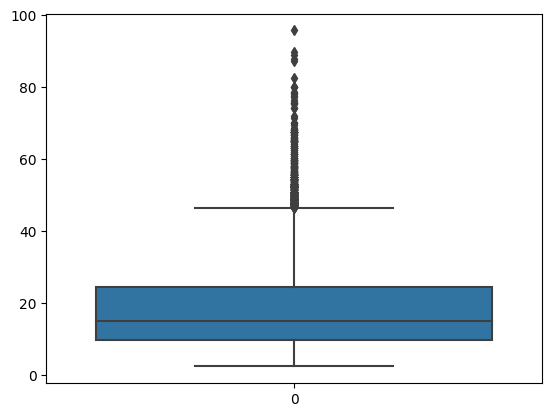

In [95]:
sns.boxplot(df_merged["new_price"])

In [96]:
import matplotlib.pyplot as plt

(array([2.1861e+04, 1.7851e+04, 1.0588e+04, 5.7440e+03, 1.2100e+03,
        2.6900e+02, 7.5000e+01, 1.9000e+01, 9.0000e+00, 5.0000e+00]),
 array([ 2.5   , 11.8265, 21.153 , 30.4795, 39.806 , 49.1325, 58.459 ,
        67.7855, 77.112 , 86.4385, 95.765 ]),
 <BarContainer object of 10 artists>)

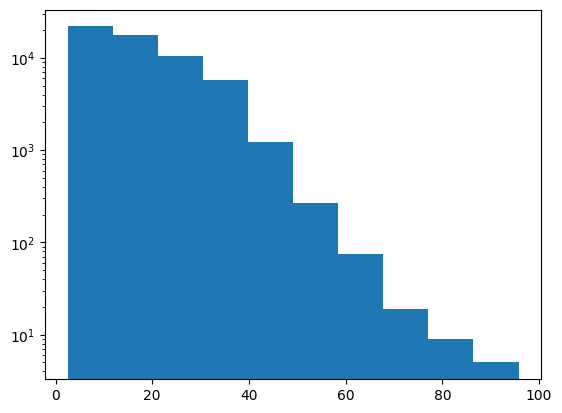

In [97]:
plt.hist(df_merged["new_price"],log=True)

In [98]:
df_merged.columns

Index(['Unnamed: 0', 'index', 'distance', 'cab_type', 'time_stamp',
       'destination', 'source', 'price', 'surge_multiplier', 'id',
       'product_id', 'name', 'date_time', 'date', 'day', 'hour',
       'fare_per_mile', 'class_hour', 'new_price', 'traveling_time',
       'max_travel_time', 'min_travel_time', 'avg_travel_time', 'merge_date',
       'temp', 'clouds', 'pressure', 'rain', 'humidity', 'wind'],
      dtype='object')

<AxesSubplot: >

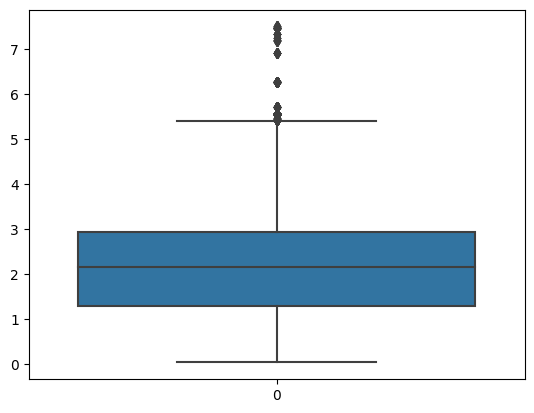

In [99]:
sns.boxplot(df_merged["distance"])

(array([ 5560., 14908.,  9858., 14528.,  8481.,  1990.,  1508.,   532.,
          104.,   162.]),
 array([0.03 , 0.777, 1.524, 2.271, 3.018, 3.765, 4.512, 5.259, 6.006,
        6.753, 7.5  ]),
 <BarContainer object of 10 artists>)

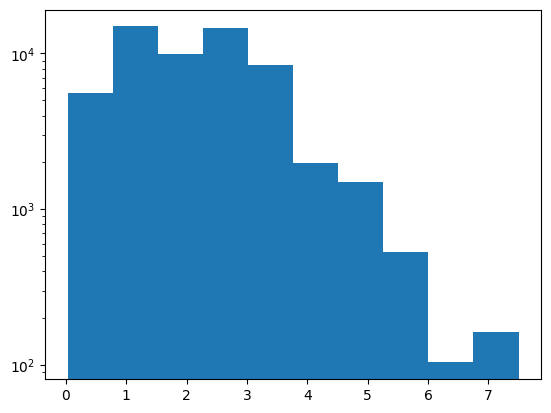

In [100]:
plt.hist(df_merged["distance"],log=True)

<AxesSubplot: >

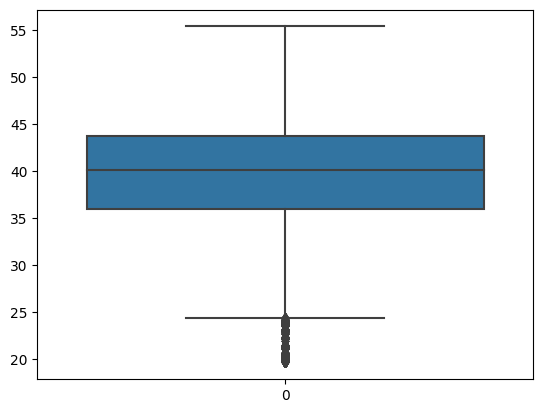

In [101]:
sns.boxplot(df_merged["temp"])

(array([ 1552.,  1459.,  3928.,  4707.,  6424., 15461., 13852.,  6871.,
         2221.,  1156.]),
 array([19.62 , 23.199, 26.778, 30.357, 33.936, 37.515, 41.094, 44.673,
        48.252, 51.831, 55.41 ]),
 <BarContainer object of 10 artists>)

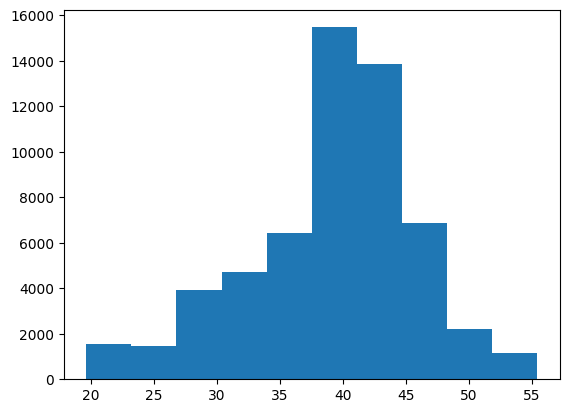

In [102]:
plt.hist(df_merged["temp"])

<AxesSubplot: >

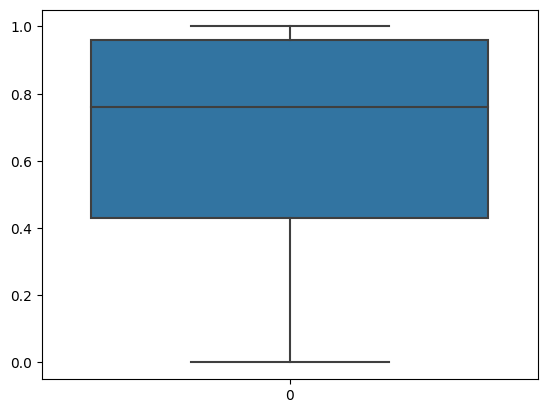

In [103]:
sns.boxplot(df_merged["clouds"])

(array([ 3527.,  3218.,  3141.,  2663.,  4819.,  5294.,  3748.,  4330.,
         6319., 20572.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

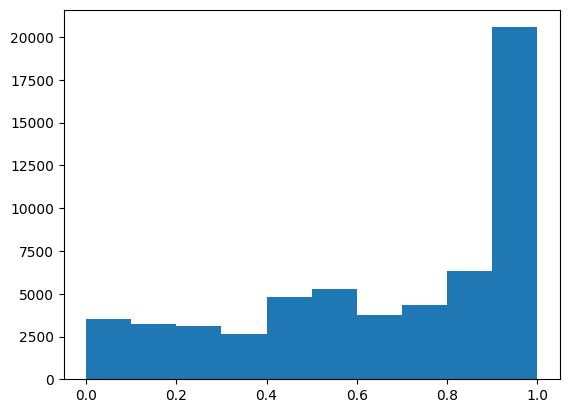

In [104]:
plt.hist(df_merged["clouds"])

<AxesSubplot: >

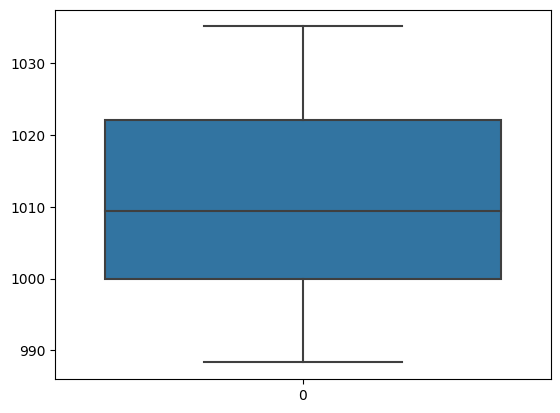

In [105]:
sns.boxplot(df_merged["pressure"])

(array([8370., 3438., 7958., 7245., 4009., 5360., 4877., 8904., 2078.,
        5392.]),
 array([ 988.325 ,  993.0045,  997.684 , 1002.3635, 1007.043 , 1011.7225,
        1016.402 , 1021.0815, 1025.761 , 1030.4405, 1035.12  ]),
 <BarContainer object of 10 artists>)

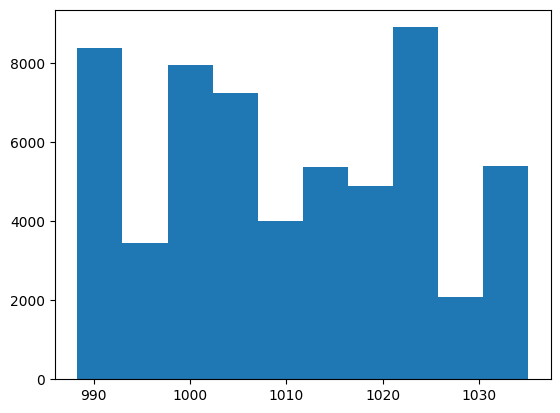

In [106]:
plt.hist(df_merged["pressure"])

<AxesSubplot: >

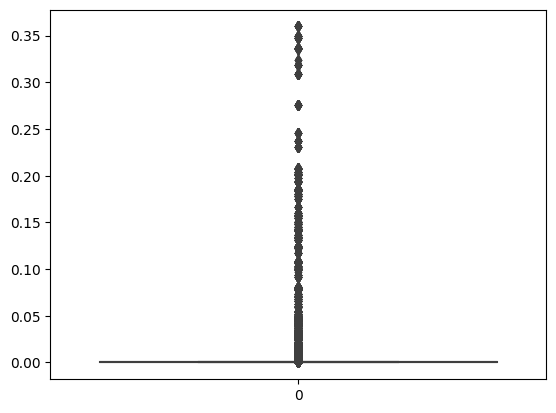

In [107]:
sns.boxplot(df_merged["rain"])

(array([5.5223e+04, 8.4600e+02, 2.8000e+02, 3.6000e+02, 3.8200e+02,
        2.9800e+02, 6.2000e+01, 2.8000e+01, 4.7000e+01, 1.0500e+02]),
 array([0.       , 0.0359825, 0.071965 , 0.1079475, 0.14393  , 0.1799125,
        0.215895 , 0.2518775, 0.28786  , 0.3238425, 0.359825 ]),
 <BarContainer object of 10 artists>)

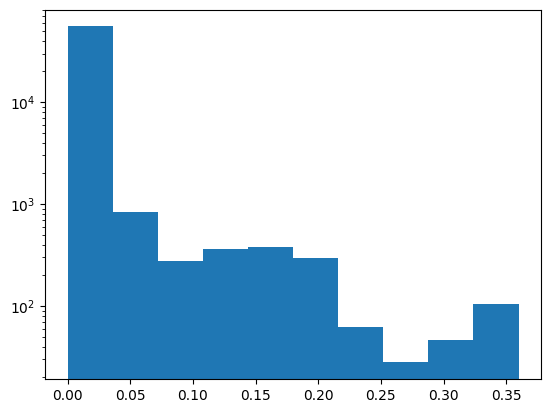

In [108]:
plt.hist(df_merged["rain"],log=True)

<AxesSubplot: >

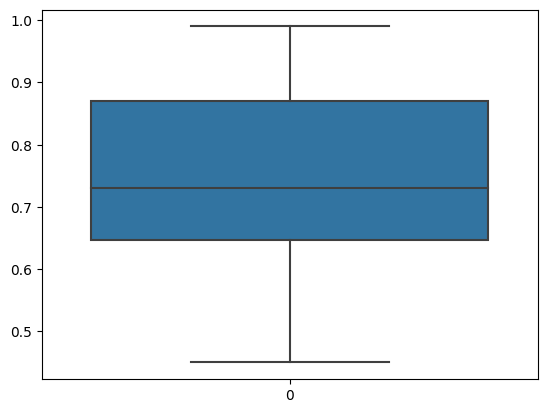

In [109]:
sns.boxplot(df_merged["humidity"])

(array([ 1251.,  2594.,  5380.,  7592., 10486.,  6197.,  5205.,  5712.,
        10169.,  3045.]),
 array([0.45 , 0.504, 0.558, 0.612, 0.666, 0.72 , 0.774, 0.828, 0.882,
        0.936, 0.99 ]),
 <BarContainer object of 10 artists>)

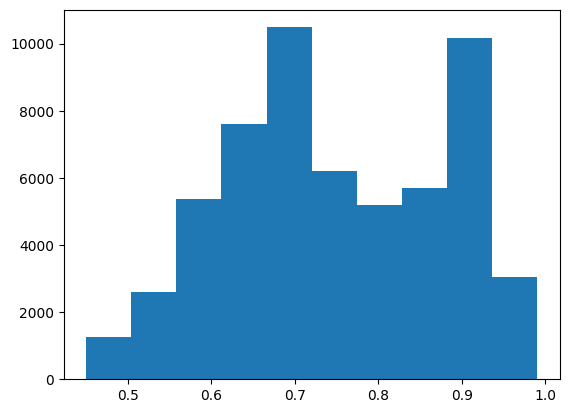

In [110]:
plt.hist(df_merged["humidity"])

<AxesSubplot: >

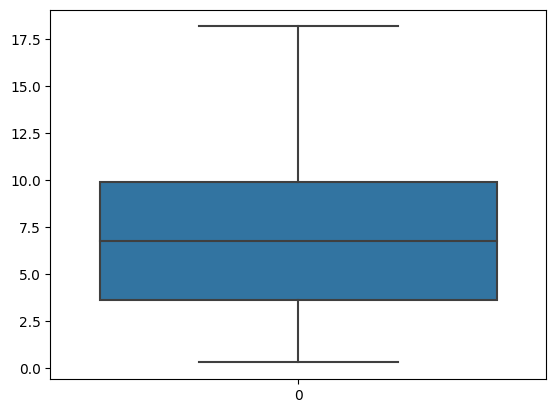

In [111]:
sns.boxplot(df_merged["wind"])

(array([ 4575., 11195.,  7770.,  8099.,  6238., 13006.,  3695.,  1799.,
          918.,   336.]),
 array([ 0.3  ,  2.088,  3.876,  5.664,  7.452,  9.24 , 11.028, 12.816,
        14.604, 16.392, 18.18 ]),
 <BarContainer object of 10 artists>)

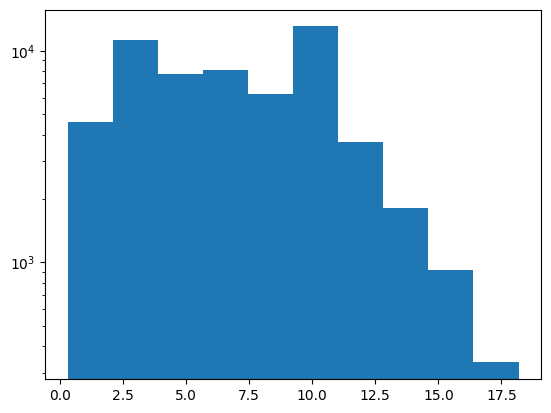

In [112]:
plt.hist(df_merged["wind"],log=True)